<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/23.%20PI_P%3D0_20_dim_user_case_BOGP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 0 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [3]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

 The latest version of GNU Octave built for all supported Ubuntu releases. GNU Octave is normally distributed with Ubuntu, this PPA is for you if you have a need to use a newer version of Octave than what you can already get from your installed version of Ubuntu.

Simply follow the instructions below to add this PPA to your system and install the octave package. If it's not that easy or you encounter any errors, contact the team and let us know.

Much credit goes to the Debian Octave Group who maintain the official Debian packages that this work is derived from. Without their efforts to bring Octave packaging to such a high level of quality in Debian and Debian derivatives, this PPA would not be here.
 More info: https://launchpad.net/~octave/+archive/ubuntu/stable
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:

In [4]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

--2021-10-30 14:44:05--  https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m [following]
--2021-10-30 14:44:05--  https://www.dropbox.com/s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc991cd5d98322752e187833d865.dl.dropboxusercontent.com/cd/0/inline/BZC-S4hVk21ZDoKWPICllOhHucgKNjXHevf2I7KdhjTaMsccITgQWn_HFefOfZpY8oCviJa6cnP9P65BvLlTMli0HyafONNA68ormrOAqR-rSA0f5Lv8v1c0PCsx2i-XHUF6tYk0qqJWoSIBsN3veKAC/file# [following]
--2021-10-30 14:44:05--  https://uc991cd5d98322752e187833d865.dl.dr

In [5]:
!wget https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
!wget https://www.dropbox.com/s/52gyqiq137mo2bb/SE.mat

--2021-10-30 14:44:08--  https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/utf73kdk09gjvsu/RR.mat [following]
--2021-10-30 14:44:08--  https://www.dropbox.com/s/raw/utf73kdk09gjvsu/RR.mat
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc62009b8d80af2d83baea06c943.dl.dropboxusercontent.com/cd/0/inline/BZAmEQ84-c0Do8I2lFiPDla1U6RAoTX9VoRFy91LVymbkpoQm0LFf2MRghAtXesRa71PSOLBxcVQ_iw3snTo6SdXpSOZhporwex0nb6RTZxdsemDKab6QS33BGImmKUcPw3NM-6rnkBhm1d2UeWpMoq-/file# [following]
--2021-10-30 14:44:08--  https://uc62009b8d80af2d83baea06c943.dl.dropboxusercontent.com/cd/0/inline/BZAmEQ84-c0Do8I2lFiPDla1U6RAoTX9VoRFy91LVymbkpoQm0LFf2MRghAtXesRa71PSOLBxcVQ_iw3snTo6SdXpSOZhporwex0nb6RTZxd

In [6]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [9]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [10]:
def PIacquisition(Xsamples, X, model):
  Xsamples = Xsamples[np.newaxis,:]
  yhat, _ = surrogate(model, X)
  best = max(yhat)
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  probs = norm.cdf((mu - best) / (std+1E-30))
  return -probs[0]

In [11]:
#optimize the acquisition function
def opt_acquisition(X, y, model):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  
  for i in range(1):
    result = dual_annealing(PIacquisition, bounds, args=(X,model))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [12]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_PI_P=0.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_PI_P=0.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_PI_P=0.npy")

x_next is [-26.85099265 -15.03728162  -0.8639204   -9.50749725 -19.09853378
  -1.06513724  -8.9537688  -29.09261912 -26.0163778  -29.96566669
  -9.34891688  -6.4155479  -27.67206887 -19.46340542  -2.81489575
 -23.11428786 -24.93770419 -17.66356672 -23.69195295 -23.10335251]
f()=0.000000, actual=3.946
0


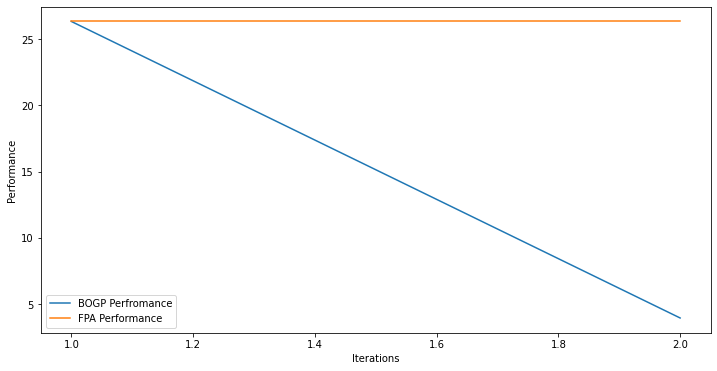

x_next is [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
f()=26.331286, actual=26.331
1


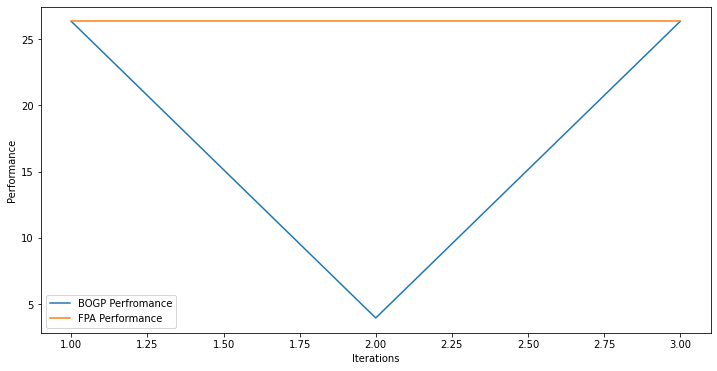

x_next is [ -9.46280646 -18.33508205  -5.52623156  -8.9612922  -30.65724707
 -25.20423313 -13.69591498 -25.54126769 -30.20243779 -15.18287933
 -19.21500441 -30.78824324 -24.79087204  -1.06412785 -30.51261996
  -6.74783239 -14.76613409 -18.86799606 -15.61007577  -6.64473451]
f()=0.000000, actual=6.409
2


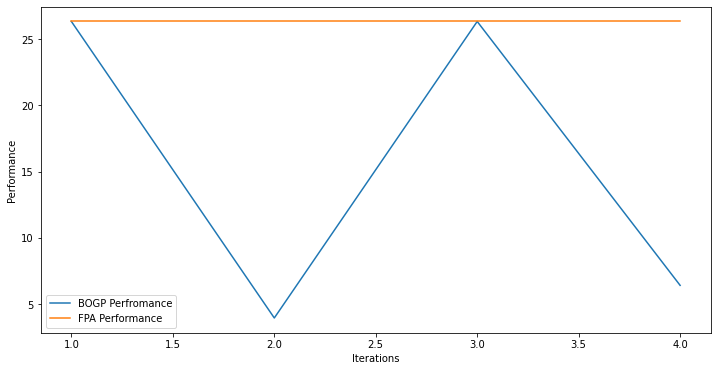

x_next is [-29.66675663 -16.24854651  -2.72057021  -2.96283426 -28.49101363
 -25.44771976  -2.81535668  -0.34678689  -5.23218094 -20.00191033
 -13.80377625 -30.05021624 -27.26936343 -16.68010456 -14.23993461
  -9.82147397 -20.28166237 -26.27863363  -6.54626773 -18.22973366]
f()=0.000000, actual=8.488
3


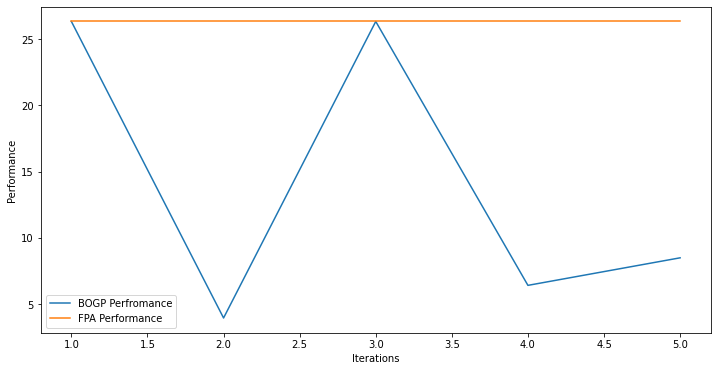

x_next is [ -0.73886193 -16.04921548  -3.86498525 -11.44155117  -7.52962688
 -25.17030595 -23.71626474  -5.24137024 -29.86137627  -5.54514623
 -10.32757024 -11.66567625  -1.99154632 -21.54449231 -16.31149436
  -6.45788868 -14.67513599 -16.73039928 -20.04699952 -17.2184988 ]
f()=0.000000, actual=9.099
4


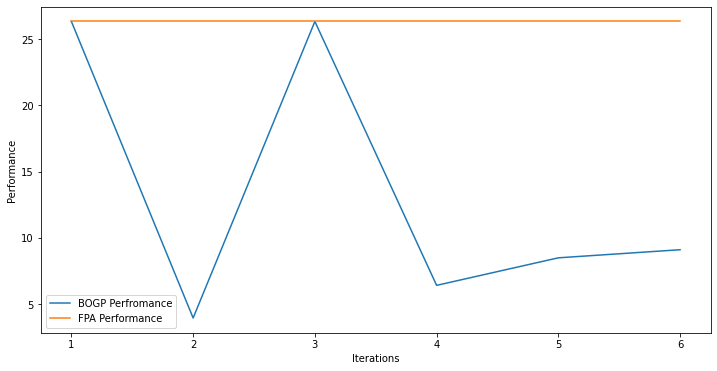

x_next is [-18.24856819  -6.89433237 -15.95767838 -11.1197877  -26.12347485
 -22.28022381 -10.79175624  -9.28262479 -23.01059974  -7.43093112
 -18.66401878  -3.82409937 -15.45982373 -27.33874578 -26.75498901
 -25.81091047 -23.55592259  -4.41351614  -1.2652252  -30.56112969]
f()=0.000000, actual=7.658
5


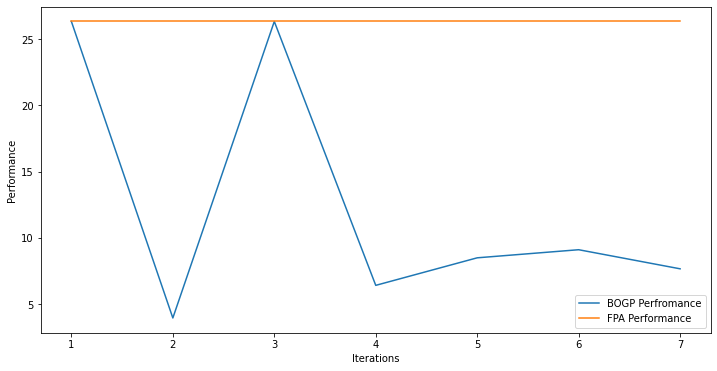

x_next is [ 0.0000000e+00  0.0000000e+00 -8.8817842e-16  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
f()=26.331293, actual=26.331
6


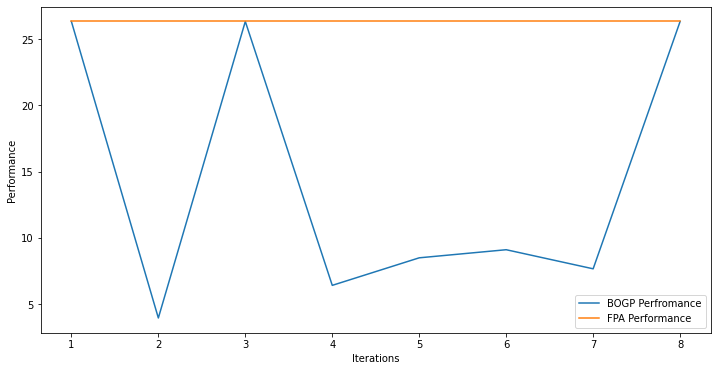

x_next is [-17.73355754 -11.73511136 -15.399797   -30.77683099 -14.21930793
  -7.83999492 -16.06062218 -11.17137092  -7.26541396  -8.00976978
 -19.39199835 -22.43132703 -20.40225725 -12.81896674 -29.33157696
 -28.567953   -17.86047616 -12.07041183 -27.57750525 -26.02963613]
f()=0.000000, actual=2.304
7


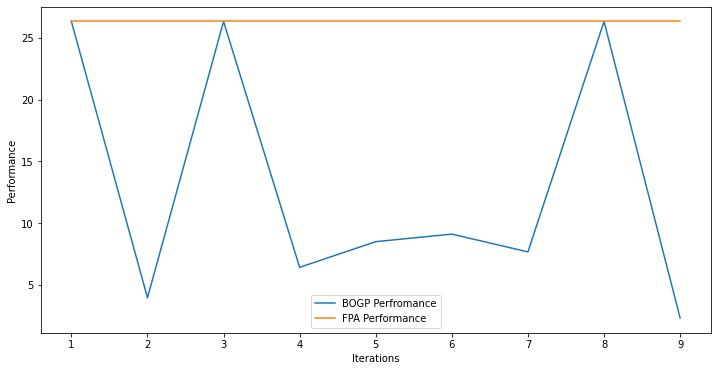

x_next is [-3.36506134e-01 -3.16411984e-04 -8.23366195e+00 -2.17160417e-01
 -9.15076538e-01 -3.04835367e-02 -2.40081800e-01 -3.49170145e-01
 -1.50053585e-01 -5.84789351e-02 -6.67972292e-01 -3.84996924e-01
 -3.09619134e-01 -3.96139687e-02 -1.47089319e-01 -5.66671907e-02
 -3.94255737e-01 -2.96930048e-02 -2.02993490e-01 -1.06400014e-01]
f()=25.861970, actual=25.708
8


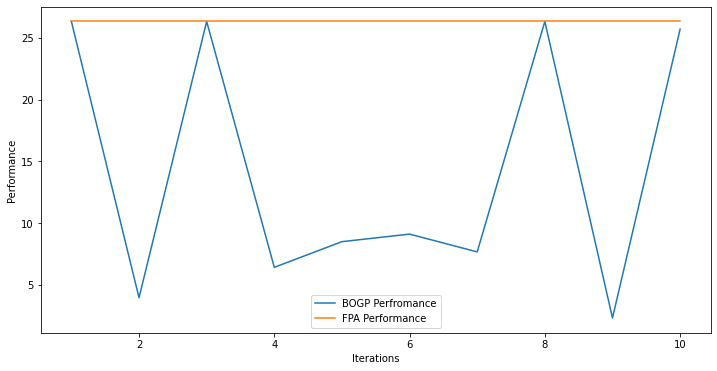

x_next is [-0.32051691 -0.35677595 -0.29571468 -0.02569438 -1.12620903 -0.5337261
 -0.32156529 -0.24286956 -0.02633081 -0.13442033 -0.59329942 -0.20870871
 -0.06878107 -0.21311248 -0.19503122 -0.01677032 -0.21672202 -0.13226778
 -0.0641332  -0.07879928]
f()=26.125703, actual=25.727
9


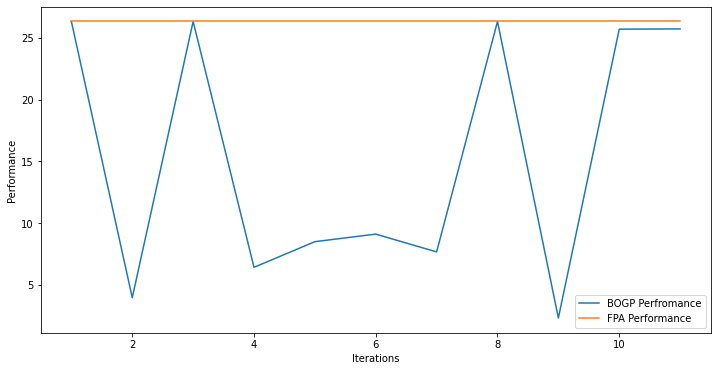

x_next is [-3.11312396e-02 -2.70686381e-02 -1.76397230e-01 -4.85486218e-02
 -1.79225138e-02 -3.85779007e-02 -1.42393457e-01 -2.78799975e-02
 -2.18689546e-01 -8.46559577e-02 -3.42138766e-02 -2.67952447e-03
 -7.63851138e+00 -2.23152682e-01 -5.34981900e-02 -6.84647156e-02
 -1.16038331e-01 -2.00576517e-01 -1.05820141e-01 -9.98258892e-02]
f()=25.942474, actual=25.513
10


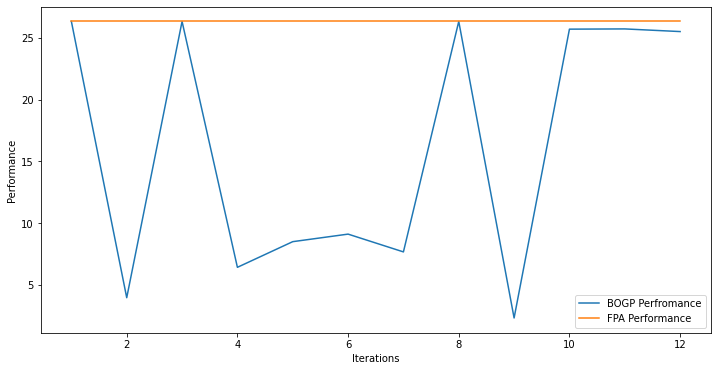

x_next is [-1.09140487e-02 -1.51504785e-03 -5.42654799e-02 -4.31108896e-03
 -7.61584146e-04 -1.70189085e-02 -1.65913267e-03 -8.59948669e-03
 -3.09723851e+01 -3.33849158e-02 -4.86378046e-03 -1.53788911e+01
 -1.35011388e-03 -8.94580016e-04 -3.08829411e+01 -4.97136272e-03
 -9.76451885e-04 -3.73773140e-03 -1.32671375e-03 -5.28207737e-03]
f()=28.088183, actual=25.684
11


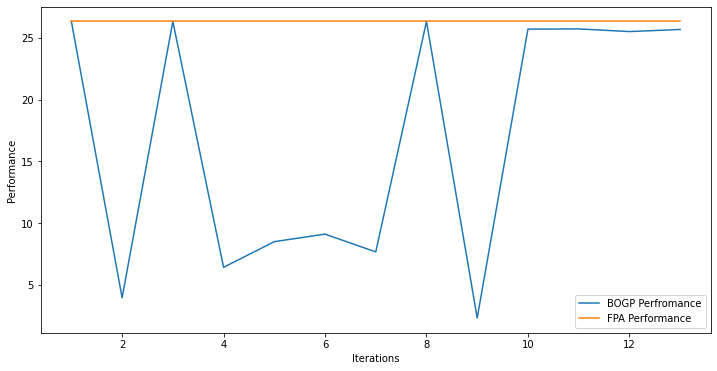

x_next is [-2.94161354e-02 -9.51798347e-03 -1.39721241e-01 -8.60333834e-03
 -2.35798340e-02 -1.80816140e-02 -1.56109391e-02 -3.41746997e-02
 -1.02849954e+01 -2.28831951e-01 -1.19924523e-02 -5.13062435e-02
 -2.61251075e-02 -8.15304698e-02 -7.94200055e-02 -4.42619636e-03
 -4.27503974e-02 -5.65355812e-02 -1.46486984e-02 -1.71495127e-01]
f()=26.396978, actual=26.151
12


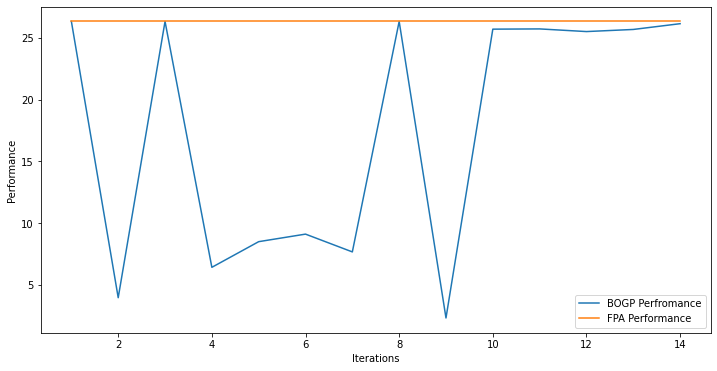

x_next is [-0.0517063  -0.023559   -0.12436142 -0.01090139 -0.01434033 -0.07804949
 -0.05176769 -0.12628775 -0.43889895 -0.07014503 -0.03169821 -0.06709477
 -0.01502705 -0.04053558 -0.10417595 -0.0633329  -0.01193159 -0.07880857
 -0.03572645 -0.06830048]
f()=26.263231, actual=26.195
13


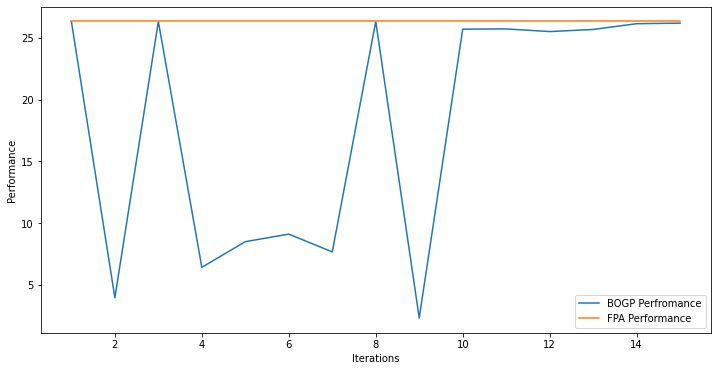

x_next is [-7.02879024e-02 -1.02163243e-01 -4.32985849e-03 -5.97755811e-02
 -5.96280242e-02 -6.93325881e-02 -6.41150131e-02 -2.70155517e-02
 -3.09604629e+01 -3.41601130e-02 -4.96946705e-02 -1.10578741e-01
 -1.57121204e-02 -2.35936338e-02 -1.74231917e-01 -5.49686727e-02
 -3.15984592e-01 -2.24007210e-02 -2.43148225e-02 -3.06080902e-02]
f()=26.523632, actual=26.127
14


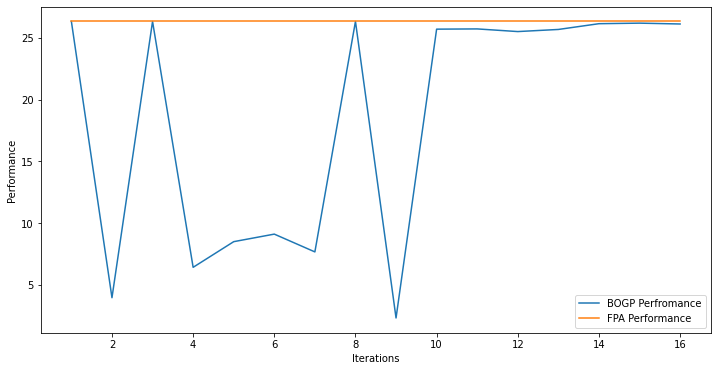

x_next is [-3.73256501e-03 -9.21779505e-02 -2.61866669e-02 -4.11518209e-02
 -2.34971564e-02 -2.28864747e-02 -2.62019789e-02 -6.15827171e-02
 -1.38497617e-01 -1.22100444e-01 -2.53185695e-02 -1.64320106e-01
 -2.89453318e-02 -4.71555851e-02 -4.49333827e-02 -4.50410989e-03
 -2.66789960e+01 -1.12974086e-01 -5.59963887e-02 -6.15804343e-02]
f()=25.462845, actual=25.020
15


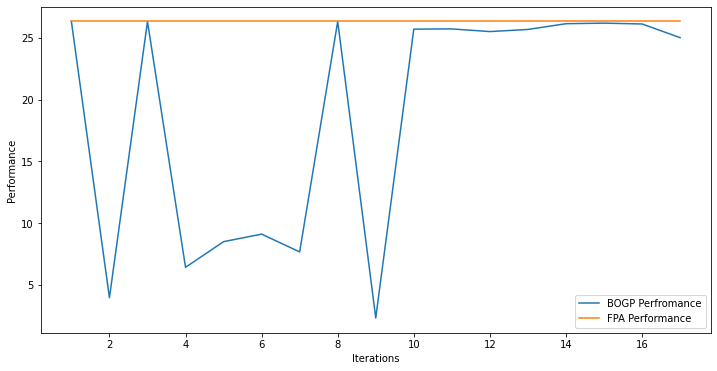

x_next is [-1.66845611e-01 -2.17047703e-01 -2.01116121e-01 -1.02964010e-01
 -1.01480456e-01 -8.04657982e-03 -3.06389811e-02 -2.80201151e-02
 -3.09245616e+01 -2.33749445e-01 -1.59604330e-02 -3.48893627e-01
 -2.19496413e-01 -1.29257476e-01 -3.02493142e+01 -1.31908743e-01
 -2.70648424e-01 -4.96488913e-03 -1.15457816e-01 -5.12195701e-03]
f()=25.842102, actual=25.825
16


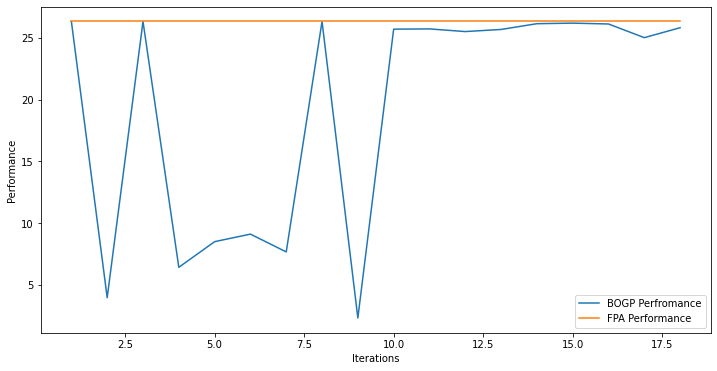

x_next is [-2.81174573e-01 -1.29413692e+00 -2.96297331e+01 -3.49047476e-01
 -8.25726939e-01 -2.95219228e-01 -5.49314753e-02 -1.16095231e-01
 -3.04719502e+01 -3.03476214e+01 -1.16211064e-01 -5.49526792e-01
 -1.08616083e+00 -6.57322387e-01 -4.24961532e-01 -3.46213510e-01
 -2.39682956e+00 -3.01129869e-01 -1.18550872e+00 -2.77243014e-02]
f()=24.449731, actual=21.872
17


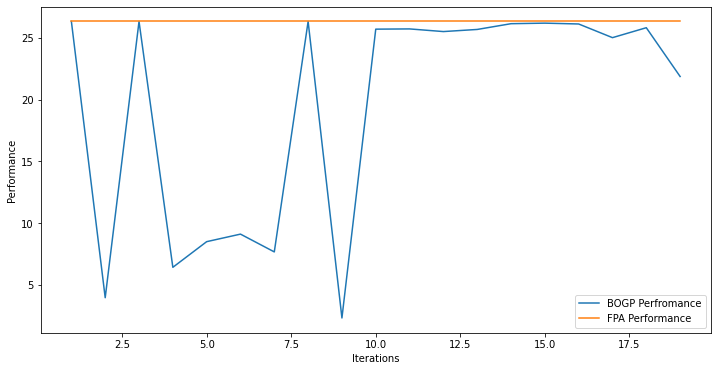

x_next is [-8.25853137e-02 -3.05721453e+01 -3.27978493e-01 -2.13349484e-02
 -1.69904762e-02 -2.26364465e-03 -3.15113598e-02 -6.58009397e-02
 -6.41583069e-01 -5.23400731e-02 -9.09370330e-02 -3.16161395e-02
 -3.30817115e-02 -8.32644271e-02 -4.03076030e-01 -8.82019111e-02
 -2.89839203e-02 -4.71127813e-02 -5.90919857e-02 -1.34930933e-01]
f()=23.847738, actual=26.081
18


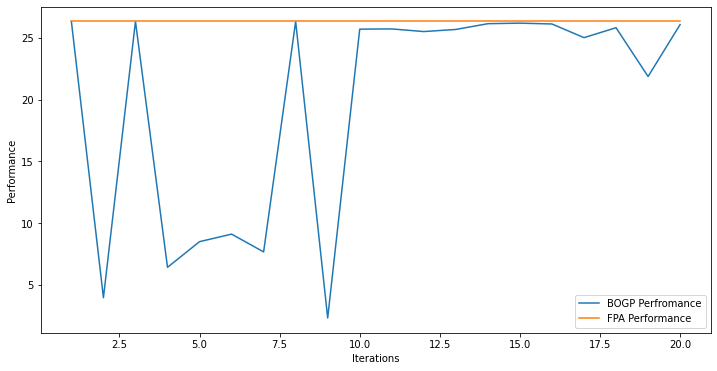

x_next is [-0.1402083  -0.25026536 -0.250238   -0.18797802 -0.10527338 -0.0222807
 -0.08474604 -0.01710448 -0.02073019 -0.21979729 -0.00383309 -0.23915176
 -0.30073213 -0.17612228 -0.17438243 -0.0170025  -0.23282837 -0.23240318
 -0.04555915 -0.18849152]
f()=26.089634, actual=25.995
19


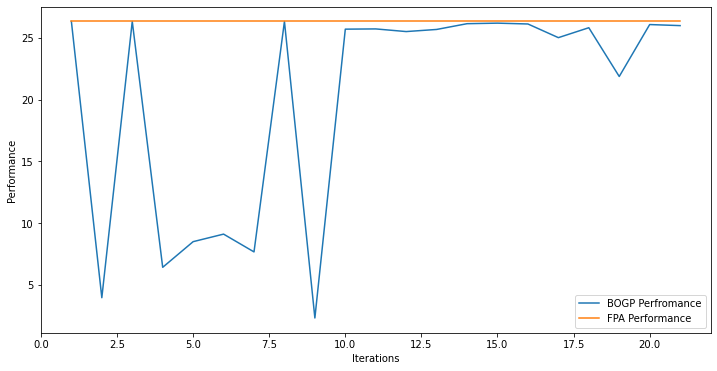

x_next is [-6.27013143e-08 -2.58135870e-06 -3.09997485e+01 -8.38680782e-08
 -4.59252752e-08 -7.67331023e-08 -1.17048316e-06 -1.77086459e-07
 -7.48213137e-08 -2.89794118e-07 -2.29888373e-07 -2.62335198e-07
 -2.57027432e-07 -3.54932373e-07 -1.43785298e-06 -5.79120082e-07
 -3.72097185e-08 -8.05262205e-07 -1.14854215e-07 -1.71524509e-06]
f()=26.520579, actual=26.287
20


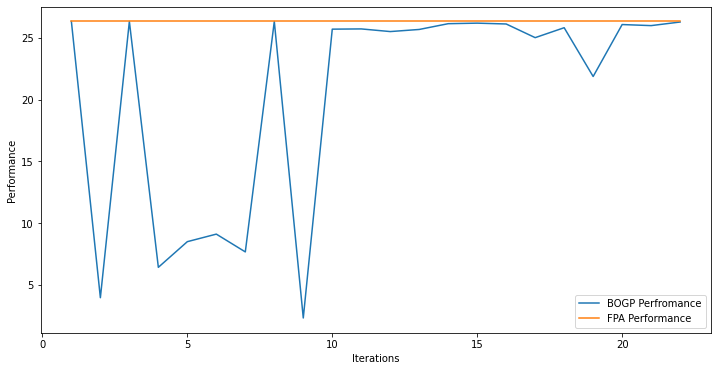

x_next is [-1.53141638e-01 -3.08316787e+01 -4.77344736e-01 -1.00763841e-01
 -2.93788767e-02 -2.79844115e-01 -2.83083302e-02 -9.97908644e-02
 -3.09145206e+01 -8.32082734e-02 -5.31490720e-02 -3.22555301e-01
 -3.74158549e-01 -8.77269594e-02 -1.04859298e-02 -2.60566441e-01
 -8.72526837e-01 -1.68202199e-01 -3.03937439e+01 -9.48593267e-02]
f()=27.102832, actual=22.357
21


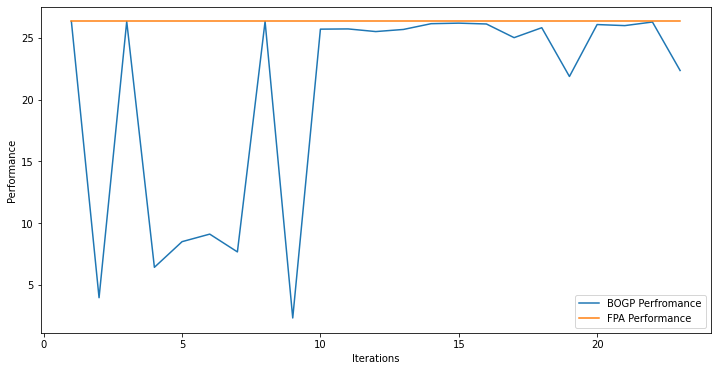

x_next is [-1.87618039e-01 -1.33813706e-01 -3.03961433e+01 -3.97114066e-02
 -3.96593964e-01 -5.90394305e-02 -1.25876158e-01 -1.50506635e-02
 -3.08840617e+01 -1.08339858e-01 -2.86605123e-01 -3.80388633e-01
 -2.21624924e-01 -4.87760872e-01 -1.98252280e-01 -6.79773756e-02
 -6.47788661e-02 -2.39888688e-01 -7.27449193e-02 -5.66026079e-02]
f()=25.675156, actual=25.903
22


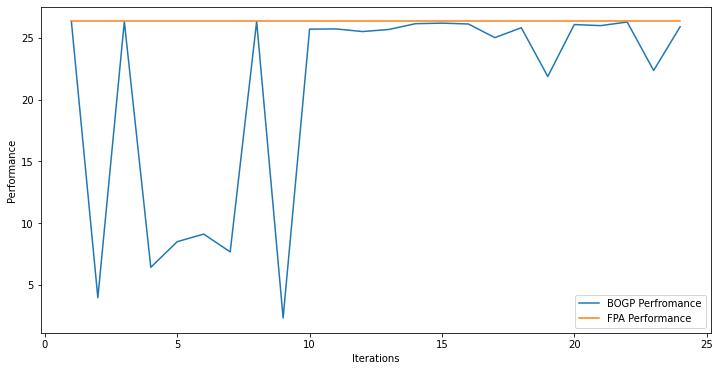

x_next is [  0.   0. -31.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=26.272634, actual=26.287
23


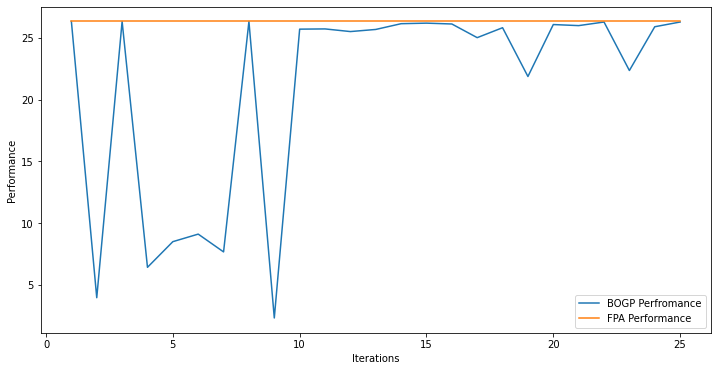

x_next is [-3.44526249e-01 -2.00862827e-01 -2.00949709e+01 -8.12571928e-02
 -2.65876591e-01 -2.41143868e-01 -3.32767302e-01 -4.39927093e-02
 -2.09445345e+01 -2.08936908e-01 -1.84301743e-01 -1.20907303e-01
 -2.38580609e-01 -4.15515020e-01 -4.45655454e-01 -4.89097360e-01
 -4.80356259e-01 -6.58131530e-02 -1.24348973e-02 -7.87432121e-02]
f()=25.817371, actual=25.700
24


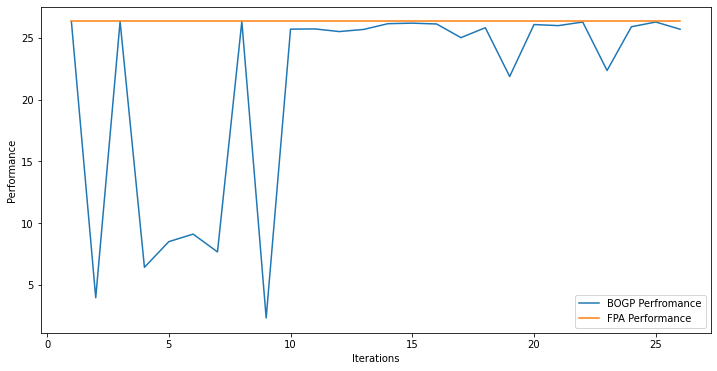

x_next is [-7.43950099e-02 -5.69255248e-01 -3.06664160e-01 -3.01731313e-01
 -5.30658447e-01 -4.89538346e-01 -2.86731828e-01 -7.02539828e-01
 -3.08348503e+01 -6.72835606e-02 -3.04167262e+01 -1.01790870e+00
 -3.55582691e-02 -1.17831929e-01 -2.80794487e-01 -2.64192155e-01
 -2.50708598e-02 -1.92014969e-02 -4.88324473e-01 -1.60896492e-01]
f()=24.029397, actual=25.567
25


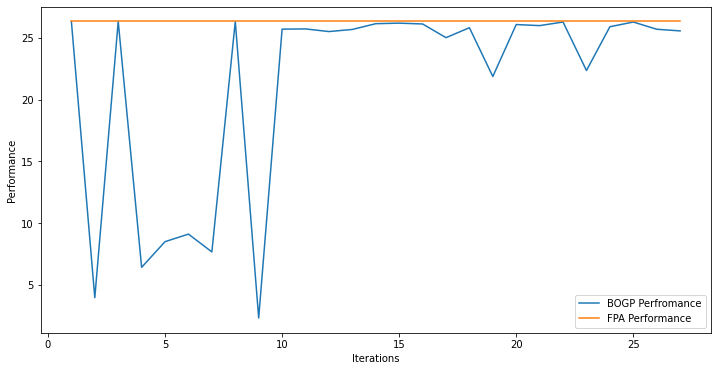

x_next is [-1.04650891e+00 -2.34090901e-01 -3.23850001e-01 -3.72392687e-01
 -8.96938071e-01 -8.56062062e-02 -8.20686587e-02 -7.98815202e-02
 -2.05991367e+01 -6.93223729e-02 -2.23415084e+00 -2.08097114e-01
 -1.32222227e+00 -1.46609318e+00 -3.03682069e+00 -2.92790438e+01
 -1.26407802e+00 -6.95021338e-01 -1.34702132e-02 -7.07990499e-01]
f()=23.691330, actual=22.293
26


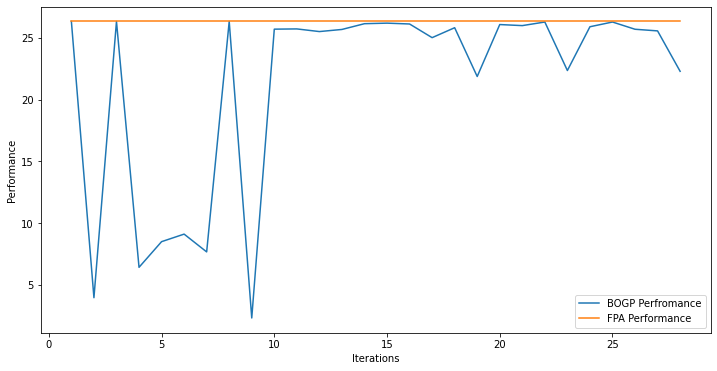

x_next is [-3.09999755e+01 -4.31361303e-08 -7.12402266e-07 -1.16839023e-07
 -1.90873749e-07 -1.53848027e-07 -1.25379021e-07 -8.57546063e-07
 -3.09999505e+01 -1.11447801e-07 -1.41350541e-07 -3.94195553e-08
 -1.16936833e-07 -1.13113472e-07 -2.16556360e-07 -1.25243030e-07
 -3.09495013e-08 -5.32798412e-08 -4.04879676e-08 -1.49733296e-07]
f()=25.571661, actual=24.417
27


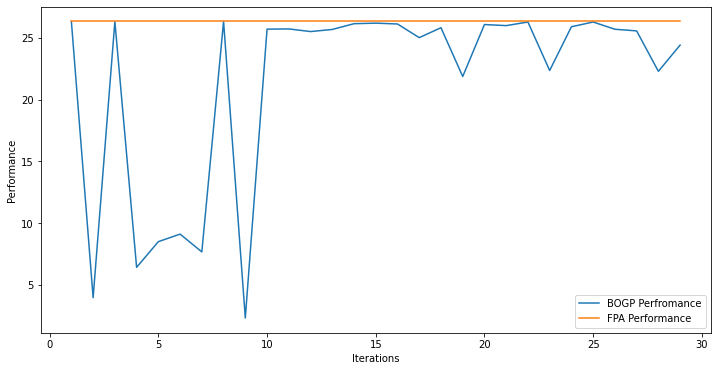

x_next is [-8.77096373e-01 -3.06018491e+01 -3.08923563e+01 -1.51011274e-01
 -2.44964175e-01 -9.09300551e-02 -8.55560869e-02 -1.40247288e-01
 -1.46379099e+00 -1.12837929e-01 -2.94344126e+01 -1.66144746e-01
 -7.25533969e-01 -3.43430624e-01 -1.66418349e-01 -6.79949949e-03
 -2.56790342e-02 -4.19286715e-02 -1.12241535e-03 -1.42659820e-01]
f()=25.004611, actual=25.663
28


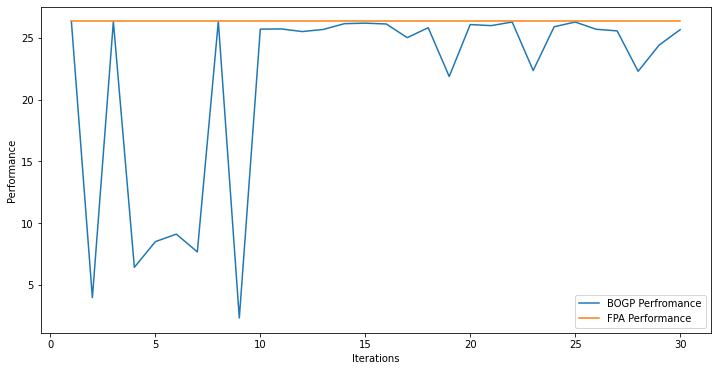

x_next is [-1.51388253e-04 -8.92269043e-05 -5.31278337e-04 -9.40231443e-05
 -9.50987331e-04 -1.13036073e-03 -1.31223004e-04 -9.19988734e-06
 -1.10685027e-03 -6.75414514e-04 -1.00914868e-04 -5.44433668e-04
 -1.10113002e-03 -1.11137338e-04 -1.59247294e-04 -1.84513098e-05
 -5.53433786e-04 -3.10143436e-04 -4.67330181e-04 -9.29067113e-05]
f()=26.327896, actual=26.330
29


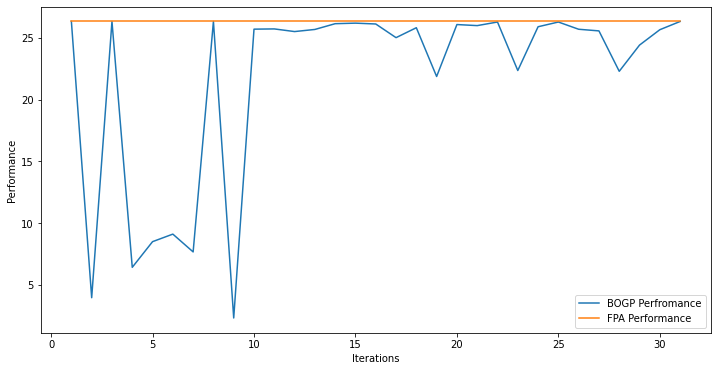

x_next is [-1.18561747e-01 -3.29347264e-02 -5.41981519e-01 -4.16103059e-03
 -3.15807028e-02 -7.64785492e-02 -3.03513410e-01 -1.04685795e-01
 -5.30453034e-02 -4.42242062e-02 -3.09106811e+01 -7.02072392e-02
 -1.81437252e-01 -8.13498796e-02 -6.42862956e-01 -7.18533356e-02
 -7.04246568e-03 -4.45463966e-02 -1.35460472e-01 -6.39464771e-02]
f()=26.349176, actual=26.076
30


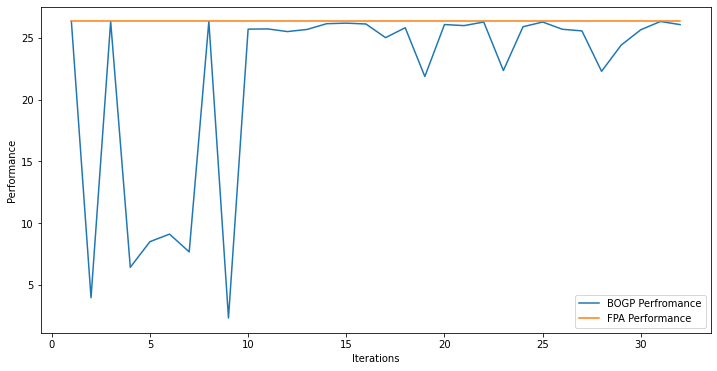

x_next is [-2.86689468e-01 -3.03986836e+01 -3.05231300e+01 -2.17983310e-01
 -2.50927779e-01 -1.86390423e-01 -2.88548074e-01 -4.25280091e-01
 -3.07384250e+01 -3.24874438e-03 -6.40378762e-01 -7.60706925e-01
 -5.55262868e-02 -1.59642115e-01 -1.24517781e+00 -1.39524644e-01
 -1.88625368e-01 -2.63109387e-02 -1.96696706e-01 -9.58112023e-02]
f()=25.646407, actual=25.649
31


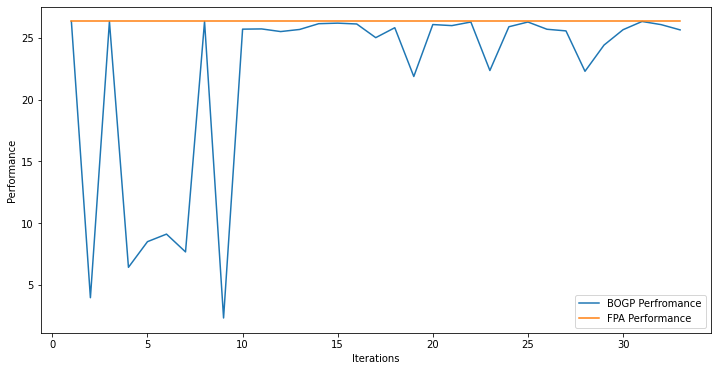

x_next is [ -0.26105536 -27.91965862  -0.58895595  -0.45954948  -0.25757115
  -0.25707706  -0.55818609  -0.13652252 -29.5193493   -0.5188729
 -29.34613963  -0.50094262  -0.6722062   -1.46392145  -2.90486854
  -0.58491369  -0.65632997  -0.0944553   -0.16638774  -0.1859377 ]
f()=25.214862, actual=25.199
32


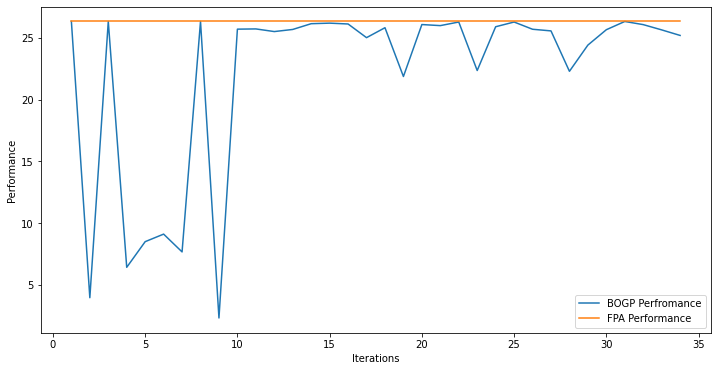

x_next is [ -1.09419451 -30.4393265   -0.33184994  -0.38336958  -0.55223354
  -0.14118424  -0.04636897  -1.03459721  -0.80464634  -0.31291266
 -30.67389503  -1.89523685  -0.94986926 -30.40477206  -0.5116151
  -1.01696205  -1.27183526  -0.47253238  -0.49819656  -0.04614758]
f()=23.923268, actual=24.489
33


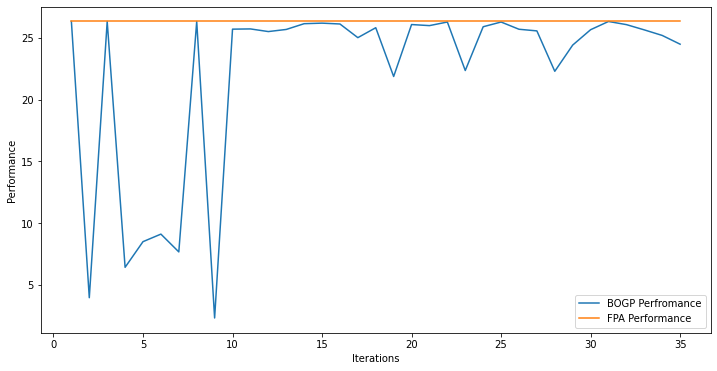

x_next is [ -2.43331446 -24.85523823 -24.72337479  -0.06241367  -1.73876657
  -1.19067853  -0.03977287  -3.56112358  -4.7929395   -0.9135844
 -27.75829808  -1.1025301   -1.12719536  -2.2855071  -30.01984367
  -0.05052711  -0.44888868  -0.12098447  -0.25064248  -0.8224847 ]
f()=23.835366, actual=23.631
34


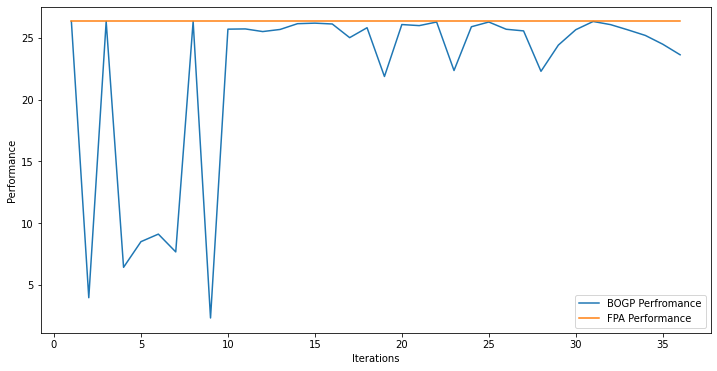

x_next is [ -1.20280749 -30.42318035 -27.84200275  -0.86039911  -0.40927386
  -0.96438421  -0.92259483  -0.61365115 -28.31619527  -1.25400012
  -3.32604762 -29.522738    -4.05319616 -30.72036797 -12.82600023
  -0.91333834  -3.82917831  -1.68581441  -2.45385948  -0.55355594]
f()=22.366796, actual=22.132
35


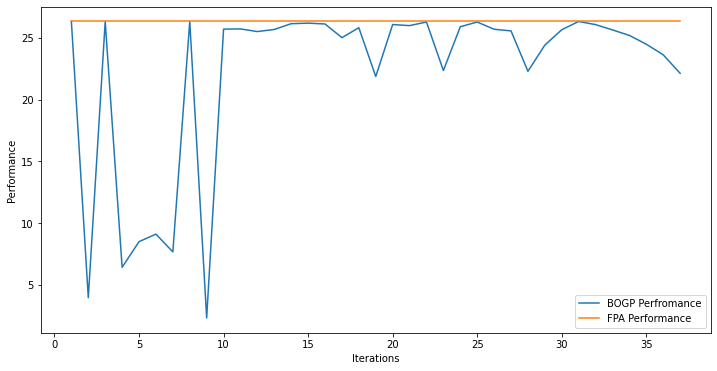

x_next is [ -1.24467914  -2.0861127  -30.94174179  -0.50493401  -0.46961111
  -0.41817325 -29.78607326  -1.00021055 -30.36786082  -1.4554057
 -11.39888299  -0.31112189  -3.24730629  -1.07533343  -5.08188407
  -0.5658961   -3.79122714  -0.80997822  -0.69833565  -0.58097532]
f()=22.221755, actual=23.118
36


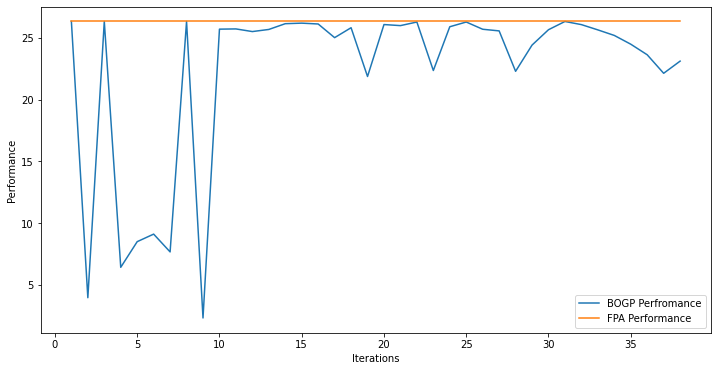

x_next is [-1.69090763e+00 -5.05385695e-01 -2.91677575e+01 -3.93284347e-01
 -1.56735067e+00 -1.34666081e+00 -5.16771186e-01 -3.03324072e+01
 -8.85978012e-03 -1.04553431e+00 -2.94882858e+01 -2.98868572e+01
 -1.71620845e+00 -8.81435154e-02 -6.33020967e-01 -7.35514679e-01
 -1.88588562e+00 -2.55468524e+00 -7.56009348e-01 -2.53553279e+00]
f()=20.788573, actual=21.811
37


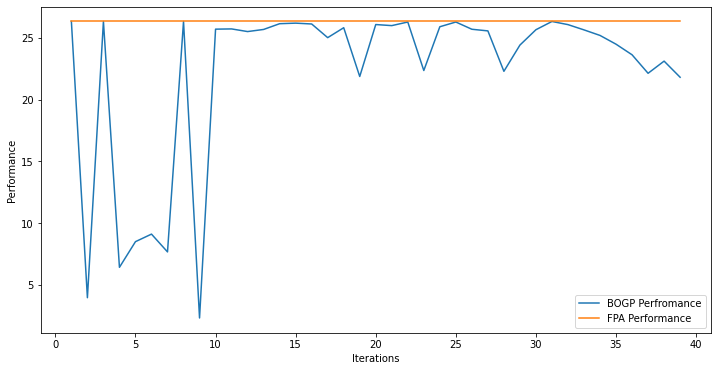

x_next is [ -0.33278273  -2.16010929 -29.17092324  -0.23289064  -0.31241147
  -1.74561001  -0.48915807  -1.98642767 -29.73956025  -0.64657843
 -27.84867306  -0.81055734  -0.26333877  -1.24330933  -3.64823395
  -0.50596797  -0.11014079  -0.75249019  -3.12194154  -0.85116165]
f()=24.423335, actual=23.857
38


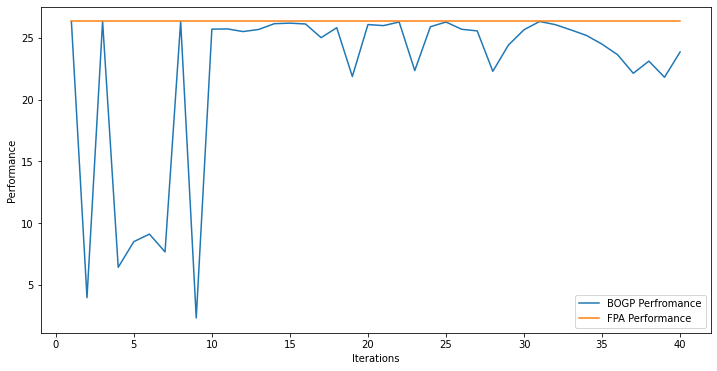

x_next is [-28.18662526 -30.26768193 -25.74059962  -1.83072089  -0.07572268
  -0.46445692  -1.66179881  -1.19747912 -30.9558891   -1.44342229
 -30.95248232 -30.04242877  -0.09014572  -2.11811816 -30.01704809
  -0.66712791 -24.80239549  -3.48396653  -1.01688952  -1.04241894]
f()=21.018756, actual=20.307
39


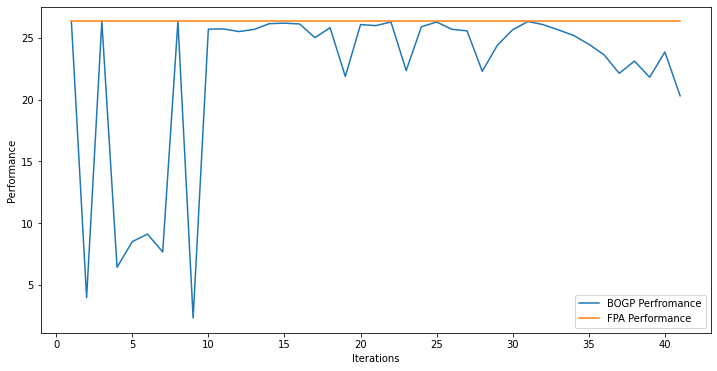

x_next is [ -0.45595492 -27.95919648  -6.42254415  -0.17827781  -1.33188279
  -0.31566766  -0.36570033  -0.16606336  -0.78201912  -0.75938878
 -25.46171846  -0.7663664   -1.69951486  -3.47375284  -3.5401749
  -0.12161162  -0.90507086  -2.77939349  -1.85276879  -2.24050063]
f()=24.024796, actual=23.642
40


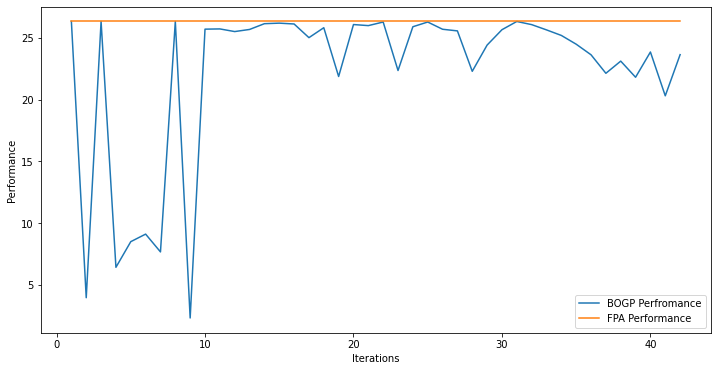

x_next is [-29.63956403 -20.68352155 -30.83718622 -30.31594448  -0.53746563
  -0.26728064 -26.61059838 -29.82656137 -27.79350827  -0.58233857
 -19.98298018  -1.74739676  -3.46580822 -28.5480021   -0.61502373
  -0.262688    -0.60259147 -23.32439931  -0.89204338  -3.67226242]
f()=12.193683, actual=15.936
41


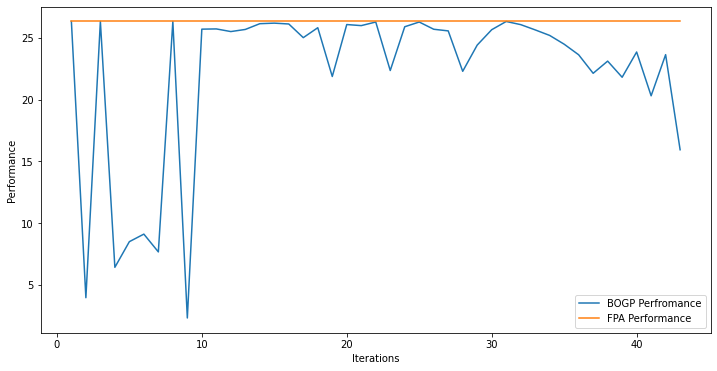

x_next is [ -6.24212912  -0.68811159  -0.44699321  -0.28625198  -0.6000502
  -0.37397024  -3.7171628   -3.57077479 -28.70773691  -0.63070043
  -2.32268262  -1.15039068  -1.32067569 -28.4530231  -28.92524345
  -0.62738737  -0.07749141  -0.49510505  -0.99403927  -1.42993502]
f()=23.393852, actual=22.686
42


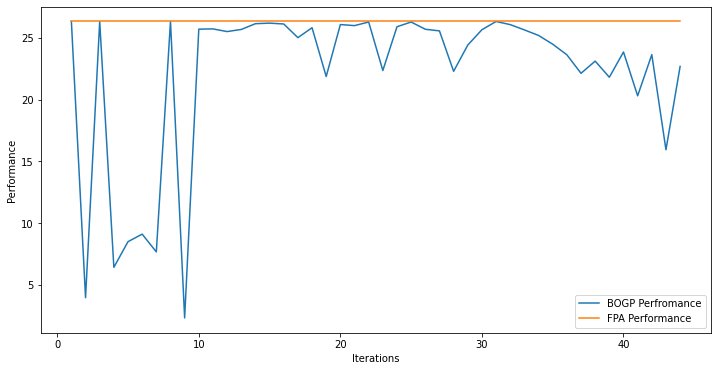

x_next is [-26.9141381  -30.67057198  -1.46521344  -0.72312679  -1.24392027
  -1.69659098 -27.03200145 -26.4528238   -7.84967733  -0.85305297
 -30.11736228 -23.67332355 -30.012055    -0.79266315  -0.6961758
  -6.89554431  -0.38514253  -0.35642167  -0.80196913 -27.82150141]
f()=16.037299, actual=16.651
43


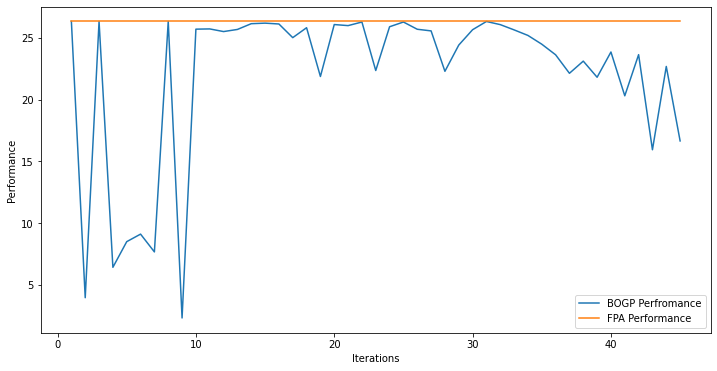

x_next is [-1.25267220e+00 -1.82391730e+01 -2.83485320e+01 -2.72662904e-01
 -1.32588347e+00 -4.25919088e-01 -9.39027523e-02 -2.30927518e-01
 -2.37733274e+01 -2.45039073e-02 -1.74450015e+00 -4.28056050e+00
 -1.03430177e-01 -3.77736628e+00 -7.39530624e+00 -4.40099964e-01
 -2.42691608e+00 -9.06679048e-01 -2.43293188e-02 -1.15719225e+00]
f()=24.175728, actual=24.134
44


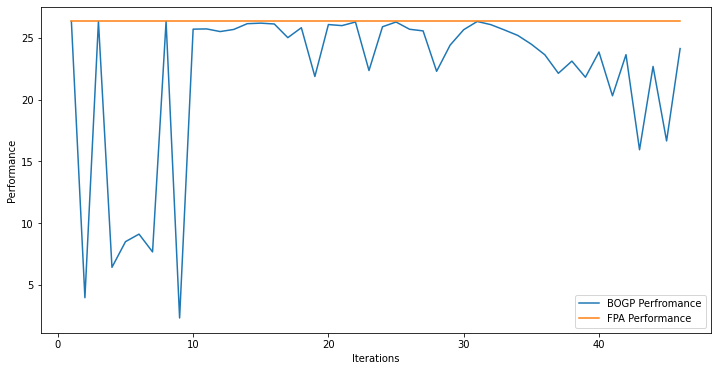

x_next is [-27.64724874 -29.60481213 -29.00082143  -3.60075559  -4.23170963
 -12.552851   -27.58358664 -24.94083762  -3.63405124  -3.76841625
  -0.95751488  -2.65355445 -30.4345008  -29.93219911 -12.97849748
  -1.92641337 -30.63854132  -2.60507342  -2.5216289   -0.21487526]
f()=15.521308, actual=15.345
45


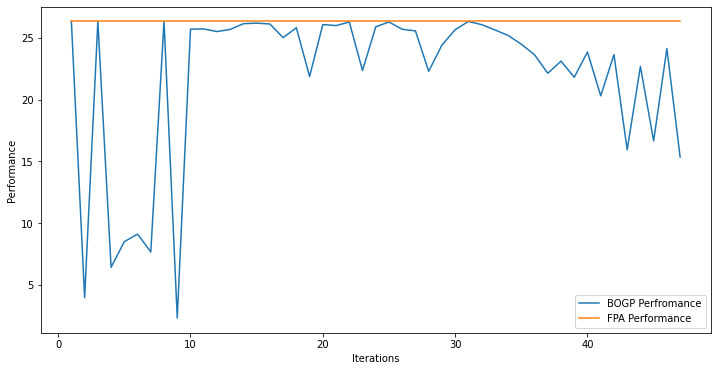

x_next is [ -4.83280403 -28.34448743 -23.35289686  -1.72232594  -2.22044939
  -1.56619896  -3.34577966 -30.3644598  -18.48701792  -0.93219891
  -6.41216214  -0.87353598  -3.30686501  -3.23157918  -9.92761285
  -0.67146863  -0.16459351  -1.51896836  -1.93545459  -2.66837677]
f()=21.397971, actual=20.714
46


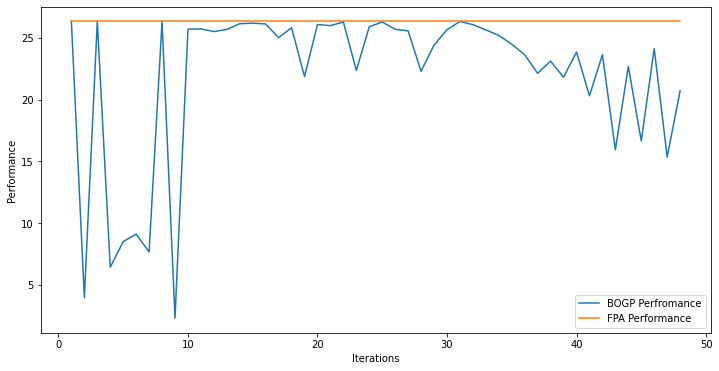

x_next is [ -1.93113164 -30.16346085  -0.78169976  -0.13894308  -0.48037954
  -0.07932986  -0.18128972  -1.66888732 -22.33021019  -1.29587478
  -0.32165794  -0.19954432  -2.86593759  -1.0194653   -0.66237034
  -0.05013834  -0.3954974   -0.20896336  -0.40490731  -1.05999558]
f()=24.904742, actual=24.279
47


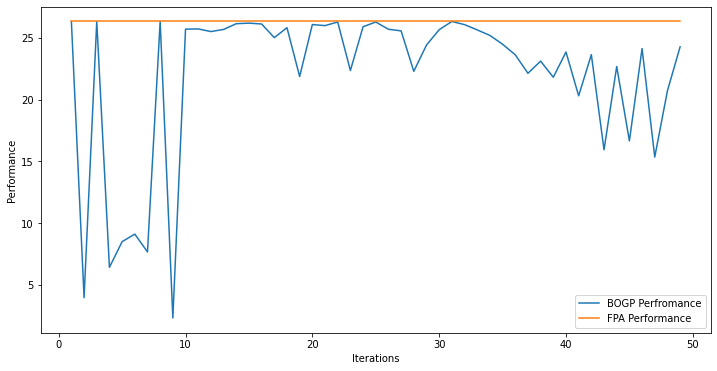

x_next is [ -4.85760807 -30.22726578  -5.0404693   -0.5409697   -0.60688736
  -1.54218089  -3.11646331  -0.46354614 -24.71046986  -3.07446634
 -30.83536804 -27.66423764  -2.06463481  -0.5990324   -7.86304219
  -0.31946963  -0.15285669  -1.39184131  -1.34886871  -0.81692585]
f()=22.871005, actual=22.107
48


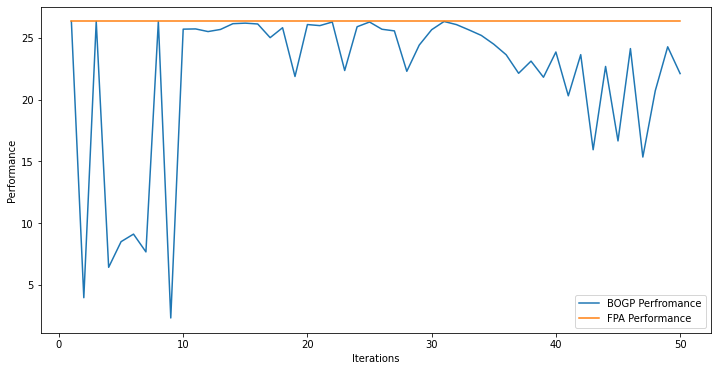

x_next is [-24.47296012 -23.58256706 -25.14274166  -3.68239966 -30.09508607
  -2.16249812 -29.14412378  -2.03933295 -26.26814777  -0.47209795
 -29.45366714 -29.72533487  -3.42461557 -27.24389846  -2.30029466
 -26.68396713  -0.5791838  -20.65153259  -6.46765364  -1.78956409]
f()=13.327509, actual=14.212
49


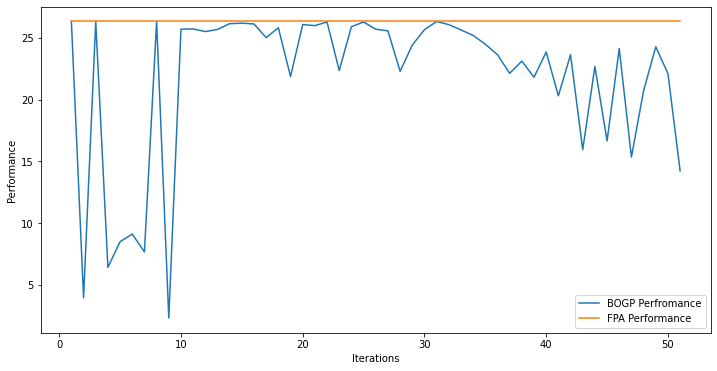

x_next is [-1.37280048e-01 -3.09284589e+01 -3.00601199e+01 -8.96718208e-02
 -7.46226061e-02 -5.07543715e-02 -5.98939742e-02 -2.14221327e-01
 -2.16881045e-01 -4.12195561e-02 -2.68746517e-02 -1.93909232e-01
 -2.98216177e-01 -2.09350238e-01 -3.00178424e-02 -3.92890596e-02
 -2.14131881e-01 -2.95262488e-02 -6.67963879e-02 -9.42626718e-02]
f()=26.089451, actual=25.930
50


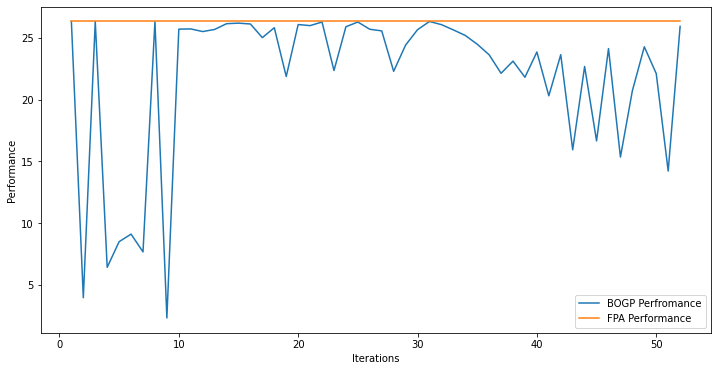

x_next is [-30.34982258 -28.44864019 -10.6329091   -3.49904314  -2.73790089
 -30.55972802 -30.13030322  -4.65062867 -23.67050447 -24.32615899
 -27.92481423 -11.91767669  -4.87643138 -27.92945056 -25.42536243
  -4.25011396  -6.11731176  -0.55121362 -10.75324965  -8.75541561]
f()=11.853343, actual=10.664
51


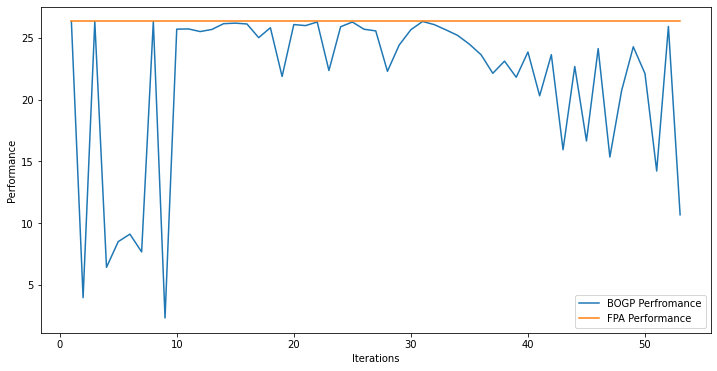

x_next is [-2.14319621e-01 -5.46811016e-01 -2.77358296e+01 -1.41955999e-02
 -5.06553852e-02 -3.21146787e-02 -8.35995322e-01 -3.31117832e-01
 -6.96335900e-02 -5.87731042e-01 -6.56055610e-02 -1.80148123e-01
 -7.78877234e-02 -5.13991211e-02 -1.11886174e+00 -5.11772582e-01
 -9.70258982e-01 -2.04072011e-02 -1.11799716e-01 -3.11705440e-01]
f()=25.744752, actual=25.532
52


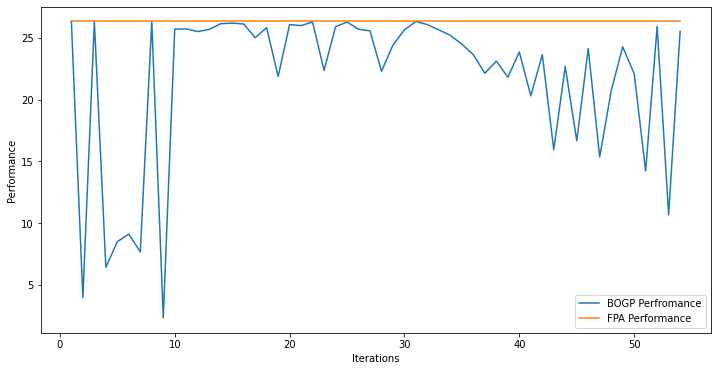

x_next is [-9.29022992e+00 -1.27442719e+01 -1.83613482e+00 -1.74172252e+00
 -1.17627155e-01 -2.00904029e+00 -2.01032938e+00 -2.25495571e+00
 -1.67171245e+00 -8.31999394e-01 -3.09219983e+01 -7.97739058e+00
 -2.92835228e+00 -1.73408931e+00 -5.13130400e-02 -6.75990475e-01
 -6.64118604e+00 -3.04115217e-02 -7.76371838e-01 -8.10435245e-01]
f()=22.445168, actual=21.362
53


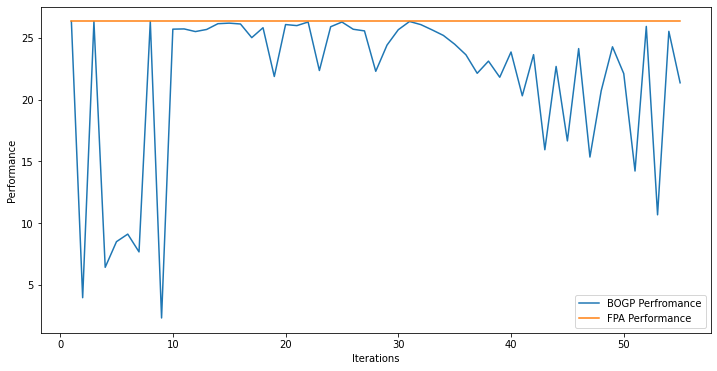

x_next is [ -1.65452994 -30.30746145 -28.74787294  -0.3691729   -2.48680841
  -1.3853934   -0.2829397   -0.23892311 -29.74265349  -2.60468465
 -24.5959608   -1.70807576 -20.10676798 -23.73481867 -23.70136727
  -0.18737629  -0.34788898  -1.49069548  -0.4836017   -3.81225202]
f()=21.958832, actual=21.941
54


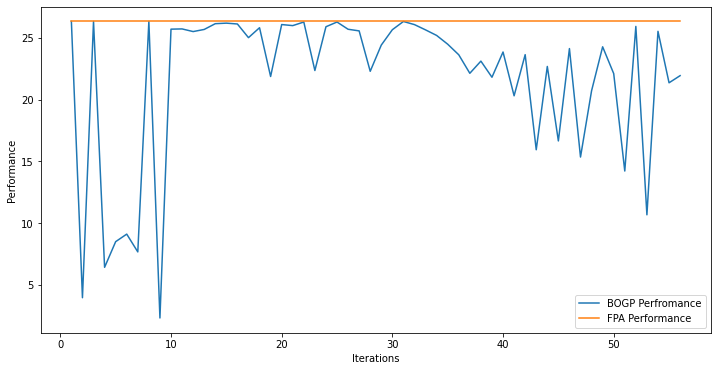

x_next is [  0.   0. -31.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=26.125047, actual=26.287
55


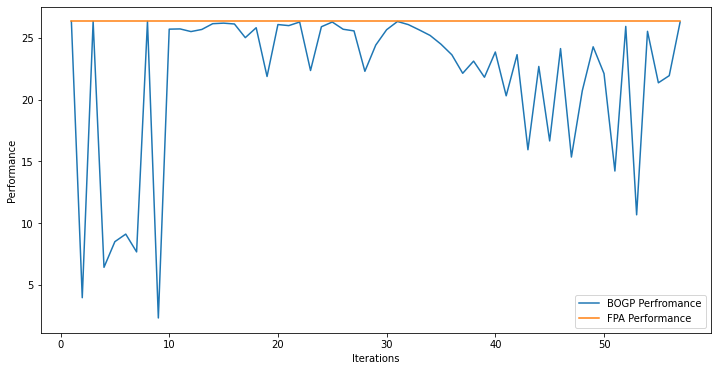

x_next is [ -4.1726986  -18.75919201 -28.15273605  -1.40215328  -0.67068634
  -3.90634659  -4.98938315  -2.27087625  -6.30543464  -4.77619165
 -28.74928943  -3.33383635  -7.14180344 -26.38655398 -27.97723388
  -0.24903766  -1.04180223  -2.242732    -1.45954478  -0.81098072]
f()=20.742005, actual=20.425
56


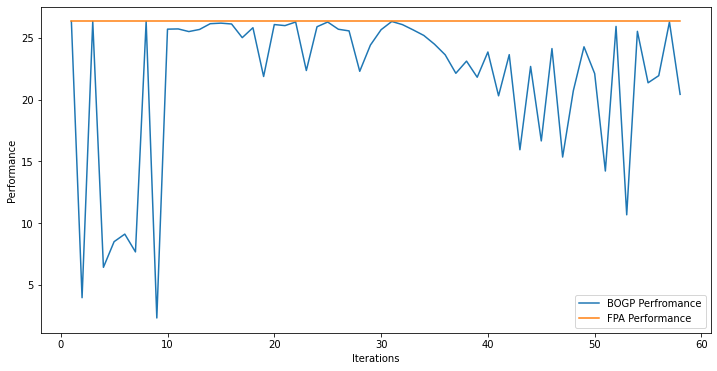

x_next is [ -2.56730213  -1.85234137 -27.97272793  -8.82082228  -4.1069507
 -14.41494249 -28.15281643 -15.2600211  -18.29016999  -2.87298176
  -5.47585185 -24.54370097  -9.39745402 -20.41844003 -15.72608709
 -11.26631638 -25.64558781 -29.28970945  -0.93447563 -19.33343368]
f()=11.697218, actual=11.470
57


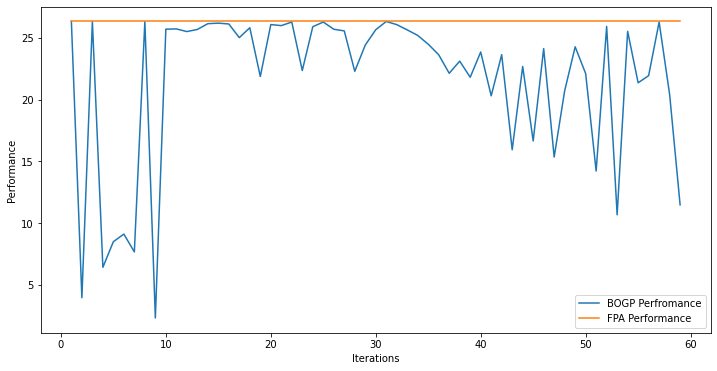

x_next is [ -8.60426492 -25.64484209 -14.08775271  -0.72049092  -1.91547437
  -5.61587435 -11.05861526  -9.20575975  -7.02689993  -1.3064468
  -2.51471643  -3.30022741  -5.62364193 -11.61916333  -5.18794523
  -3.41530745  -5.16633445  -9.30133841  -0.30704667 -21.3036635 ]
f()=17.214621, actual=16.573
58


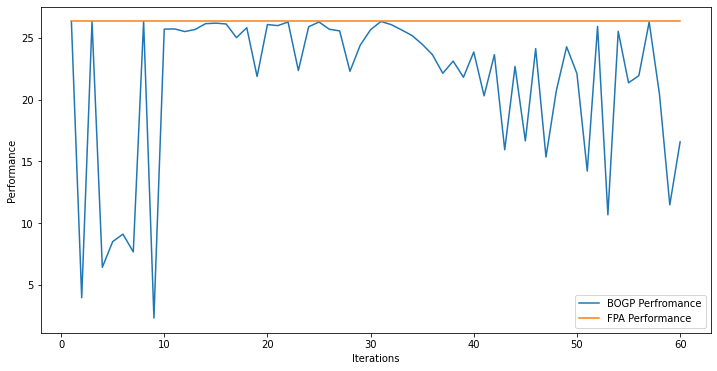

x_next is [-1.69745451e-01 -3.07186180e+01 -6.29701382e-01 -2.17959536e-01
 -4.34687775e-01 -2.31143131e-02 -4.38251805e-01 -1.11903788e-01
 -2.77986898e+01 -2.93496282e-01 -2.69671362e+01 -5.86556317e-01
 -2.14462253e-01 -4.22591170e-01 -3.54278803e-01 -2.01986026e-01
 -3.52166012e-01 -8.90853025e-01 -2.71735161e-01 -1.85740348e-01]
f()=25.437135, actual=25.469
59


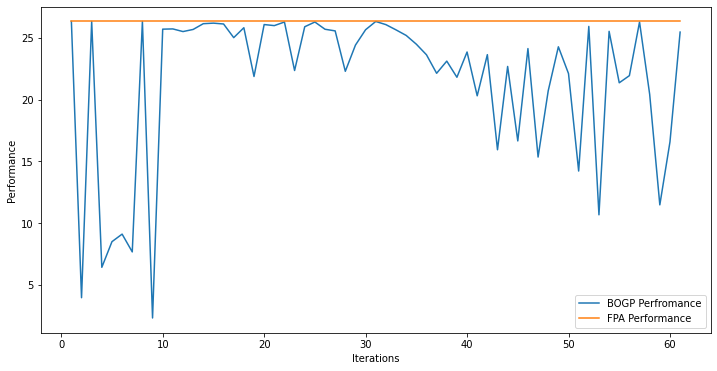

x_next is [ -0.22200562  -3.61299788 -30.66603618  -0.69760779  -0.19789156
  -0.50349337  -0.71273482  -0.87414173 -28.70027588  -0.0635747
  -1.2851305   -1.39565159  -0.63433942  -0.12884497  -2.32490247
  -0.17801651  -0.67111259  -1.23744969  -0.07197306  -0.62231908]
f()=25.083597, actual=25.012
60


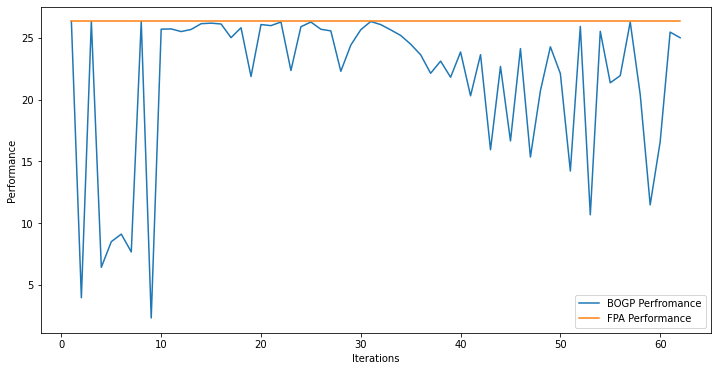

x_next is [ -5.46903336 -10.17254503  -6.39124224  -0.47852967 -26.75391826
  -8.20451959 -25.22926257  -1.09330091  -7.26276323 -10.58306194
 -17.4032372  -24.29805586  -3.25651775 -21.41438281 -13.27280946
 -15.03612719 -24.90379453  -3.16400021 -29.20784777 -12.0752311 ]
f()=9.215714, actual=9.312
61


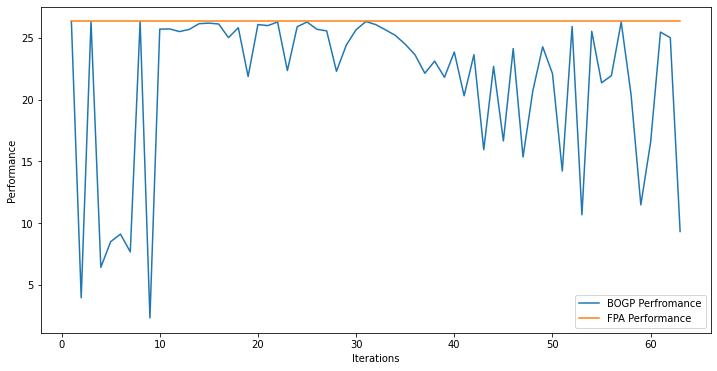

x_next is [ -2.6749211   -6.23605435 -30.94198938  -5.94671416  -3.68619199
  -0.35919385  -8.17777597  -0.95786853 -27.97755608  -1.58537332
  -6.03892507  -0.07654697  -3.50344749  -1.45718007 -29.6160586
  -2.78291711  -1.02179446  -1.58124496  -2.83187357  -2.23521079]
f()=21.336186, actual=20.346
62


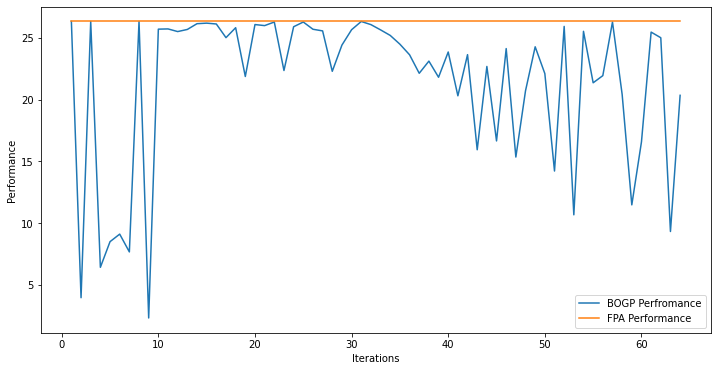

x_next is [ -4.90613493 -28.08736785  -4.52969774  -3.58898794  -2.36116803
  -1.88763186 -23.1629699   -4.37286483 -18.70126611  -0.64170387
 -22.75653699 -26.50157369 -26.51338108  -2.19916949 -19.70721833
  -4.71691531  -1.09274101  -4.99518052  -0.9430968   -1.87868202]
f()=18.595367, actual=18.813
63


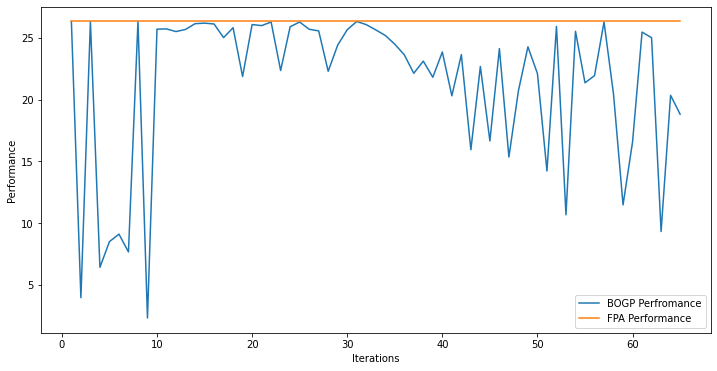

x_next is [-12.73831509 -10.16909196  -0.08826264 -25.21830417  -2.27381387
 -25.69870893 -23.46936098 -12.12031379  -0.12917873  -2.59311208
  -5.62165401 -10.36495475 -22.89841034 -13.53748091  -0.54083229
 -13.59289475 -20.34803875 -26.39565821 -17.04974477  -7.17957969]
f()=21.335816, actual=6.293
64


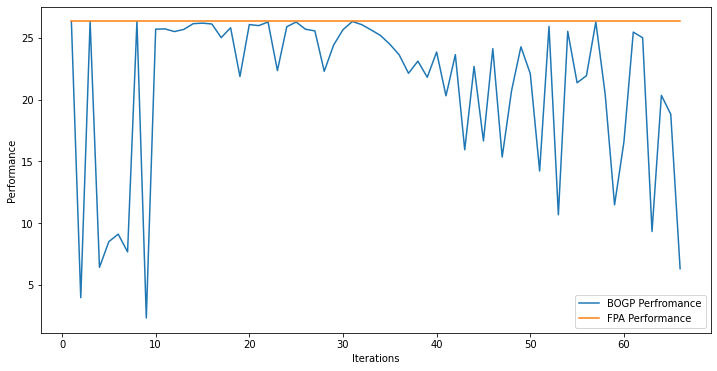

x_next is [ -3.61698561 -24.74801212 -14.46649326  -2.5919581   -4.23679646
  -0.19196351  -2.39637877  -2.81117526 -28.31386016  -5.76670805
  -0.69608626  -5.33659288  -0.25871899  -1.41644448 -22.16104358
  -2.38270698 -18.11425269  -9.90890234  -6.10262519  -0.69364826]
f()=19.198225, actual=17.799
65


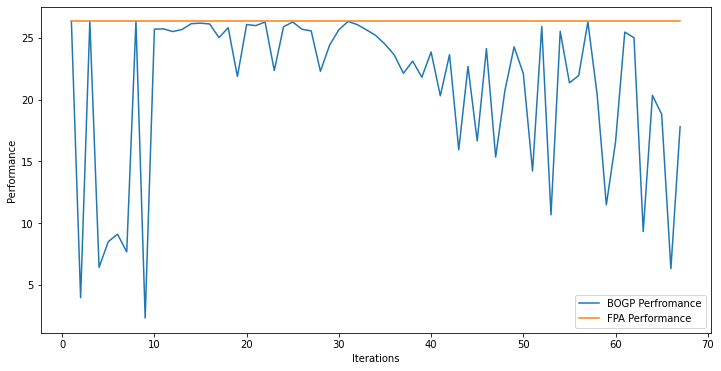

x_next is [ -9.15773039 -19.35550636 -13.47341678  -5.50618048  -8.82317822
 -16.90970525  -0.91256553  -3.49802517  -6.12249677  -5.61431497
  -2.39001327 -17.54275931 -14.36986901 -18.3091578   -9.74734286
  -1.4364259  -17.67431807 -27.70317393  -4.51167856  -5.72631649]
f()=12.461774, actual=13.333
66


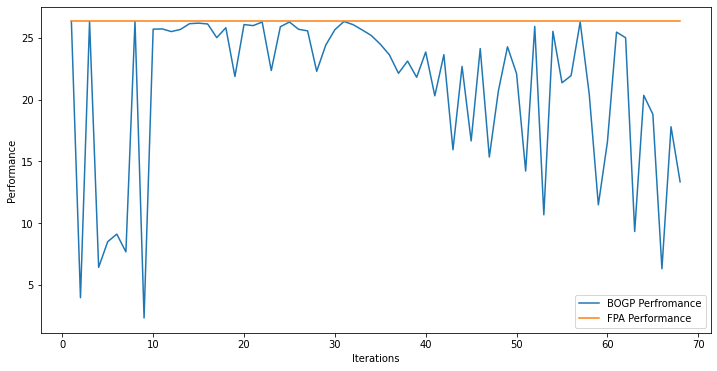

x_next is [ -2.52517914  -6.18235203 -30.17479445  -2.59659144  -2.22803286
  -1.10407731  -0.39932503 -10.65750983 -18.63643162  -0.84901565
 -28.30903937 -26.15287023 -19.24762281  -2.88360675  -1.09040155
  -1.97052189  -2.94148153  -0.63436782  -1.04355271  -1.78864612]
f()=20.698005, actual=20.483
67


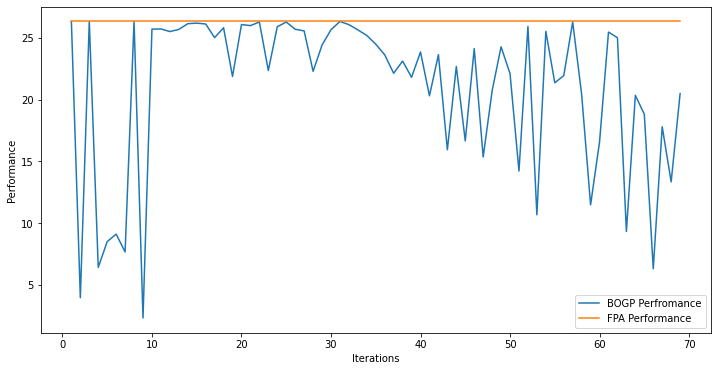

x_next is [-2.27542628e+00 -2.99815958e+01 -2.73336762e+01 -2.78971283e-02
 -2.00283214e+00 -1.97403839e+00 -2.03785791e+00 -6.58261264e-02
 -2.99083818e+01 -1.13882339e+00 -3.07158004e+01 -4.32918060e+00
 -5.35001727e-02 -2.60125566e+00 -3.58610370e+00 -1.29181144e+00
 -9.07115390e-01 -9.91110422e-01 -6.58275019e-01 -2.91120427e+00]
f()=23.600798, actual=22.791
68


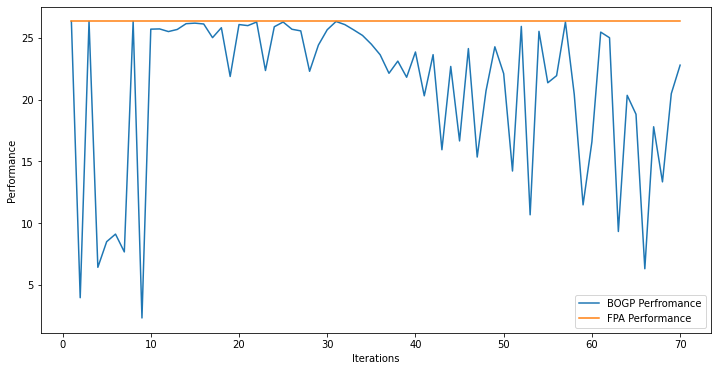

x_next is [ -2.06375281 -24.25085859 -23.74811767 -27.38335268 -18.04439406
  -5.47230178  -7.92379892  -7.79299059  -4.27864937 -21.51955005
 -23.91618846 -16.13326354 -11.68768002 -26.7389634  -16.74955684
 -20.14089668 -20.43737654 -23.39112066 -26.82536534 -11.68735192]
f()=20.963258, actual=3.516
69


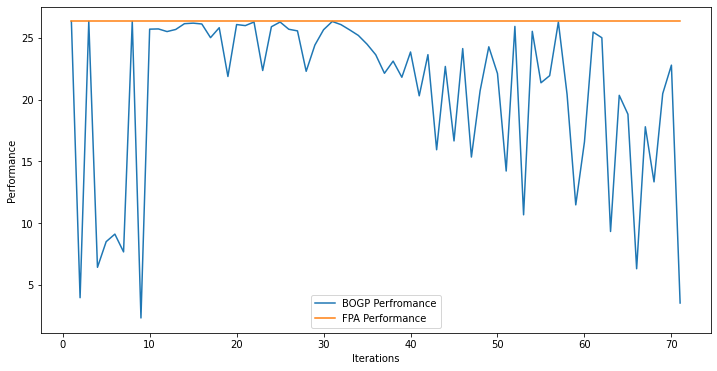

x_next is [ -2.63407533 -30.27898328  -0.28584846  -2.92605457  -1.79326692
  -0.15334291  -2.69421269  -8.98556799  -7.09241025  -0.70658943
 -30.36788367  -5.31197824  -1.26657476 -13.06232814 -30.55309726
  -0.66950517  -0.6151874   -8.00605301  -0.36032347  -0.24086478]
f()=21.895388, actual=21.745
70


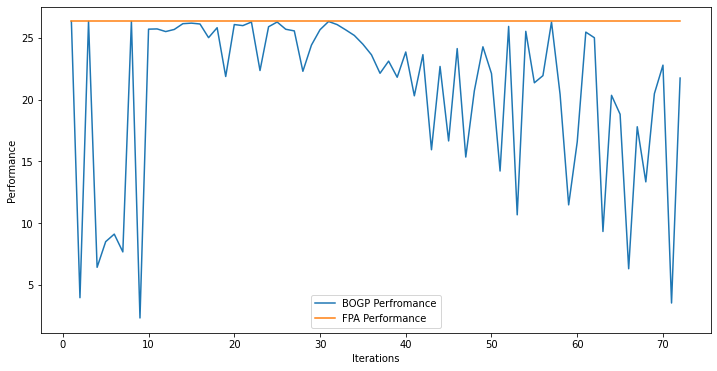

x_next is [-10.89941104 -14.8074317  -15.4929012   -2.62462454 -29.26199147
 -29.67630265  -5.82796672 -13.18042313  -9.12171691  -7.94194547
 -27.35252959  -2.47403706 -21.16634498 -20.40532097 -29.01293567
  -9.82140864  -6.68001478 -23.64999254  -2.02388346 -24.81056635]
f()=9.311253, actual=10.631
71


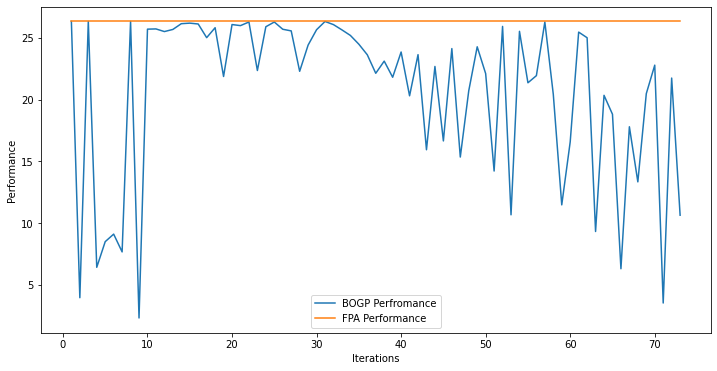

x_next is [-21.42661041 -24.46871281 -10.5401122   -3.63389373 -19.62876352
  -9.04269648  -3.00820019 -17.15148822 -26.28136699  -4.16099297
 -18.40915804  -6.98089749  -2.11096797 -25.11084273  -5.65737563
  -4.87139593  -1.77099591 -14.83951359  -0.35585748  -9.03675123]
f()=17.301099, actual=14.280
72


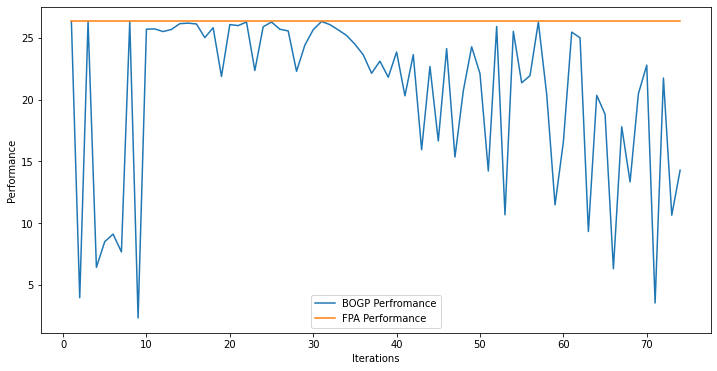

x_next is [ -0.52195987 -13.79064699 -19.68711178 -27.23191773 -25.09804136
 -21.12973841 -23.10642577 -13.40230871  -0.08859294  -4.09466721
 -26.66882367  -2.40904386  -8.65197974 -13.45951174 -30.64873168
 -19.47308049  -4.71260425 -13.54972142 -17.86510805  -1.3579827 ]
f()=6.530168, actual=8.170
73


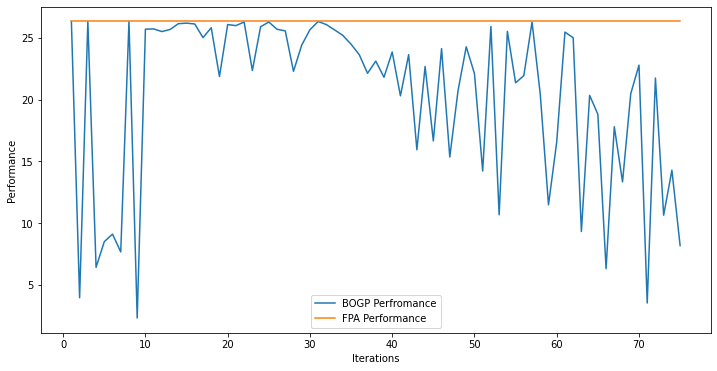

x_next is [-29.45654819  -9.07217502  -0.48102502 -28.59347169 -10.98513862
 -22.09553393 -13.07046604  -1.26252962 -24.78823428 -16.89222321
 -22.80020266 -13.46859628 -13.14571271 -17.8252359  -18.30743902
 -11.60115696 -25.77584238  -5.03877964  -9.22586159  -2.87461807]
f()=20.339403, actual=6.141
74


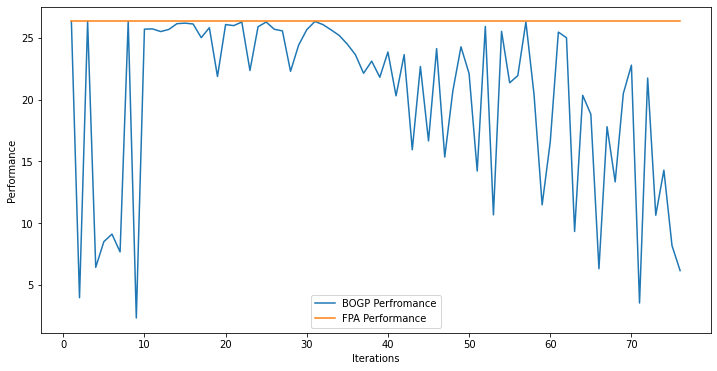

x_next is [-3.51630221e-05 -2.49216971e-04 -3.60510119e-02 -1.58029355e-04
 -3.39062458e-04 -1.74871388e-04 -3.12840926e-04 -1.03450490e-04
 -1.23920982e-06 -1.20829432e-04 -6.18973280e-04 -1.87847130e-04
 -2.71483054e-05 -6.43892388e-06 -4.45954793e-04 -3.43943386e-04
 -3.49278787e-04 -8.21951480e-05 -3.21056087e-04 -6.08836012e-05]
f()=20.150974, actual=26.330
75


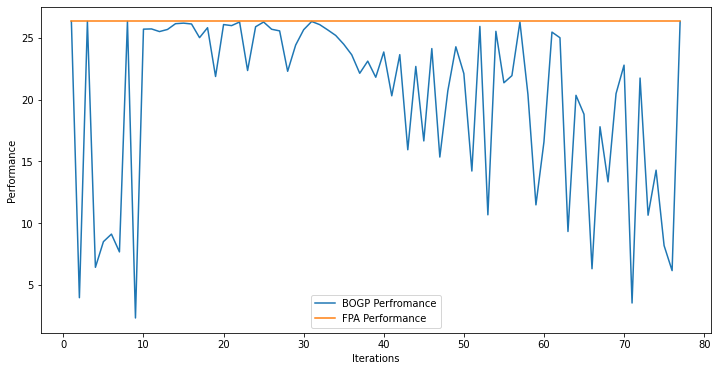

x_next is [ -2.47768682  -5.18071647 -30.61421292  -1.63308151  -1.47978936
  -2.10458308  -4.74872588  -1.14535549 -24.38971783  -2.7078481
 -10.06729704  -5.03326776  -5.03497625 -21.08364051  -1.2346946
  -0.45990762  -2.49828934  -0.38277714  -3.82398485  -4.57649434]
f()=21.139579, actual=20.309
76


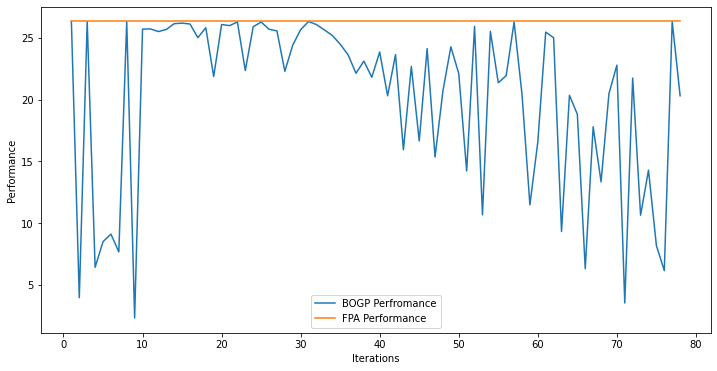

x_next is [ -0.75169143 -28.32390552 -25.97943034  -0.04944324  -0.60619051
  -0.39438025  -0.20261275  -0.25478269 -20.83051668  -0.05770675
  -1.64983207  -2.40211091  -1.58577139  -0.95125871  -0.78731492
  -0.41880979  -0.27214197  -0.46697324  -0.21020469  -0.87105019]
f()=24.922646, actual=24.865
77


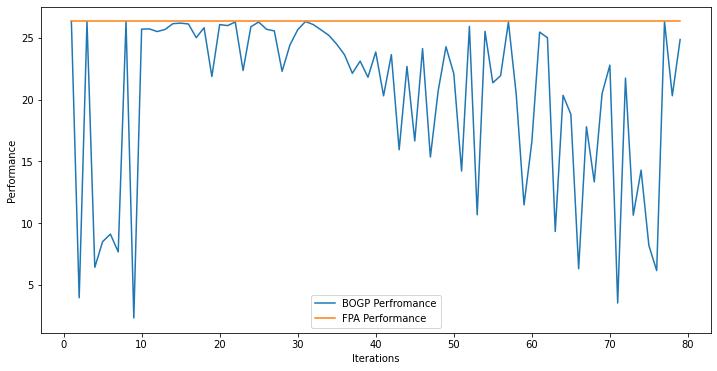

x_next is [-30.28804024 -11.05422742 -30.47953827  -0.43764535  -0.887305
  -2.43808657 -25.569992    -8.79226343  -6.79346802  -4.58065378
 -26.96709578 -15.08707941  -5.07742619  -2.80384892  -2.96654715
  -1.70586754  -3.53137861  -0.0853106   -0.3256086   -2.76934725]
f()=18.917210, actual=18.494
78


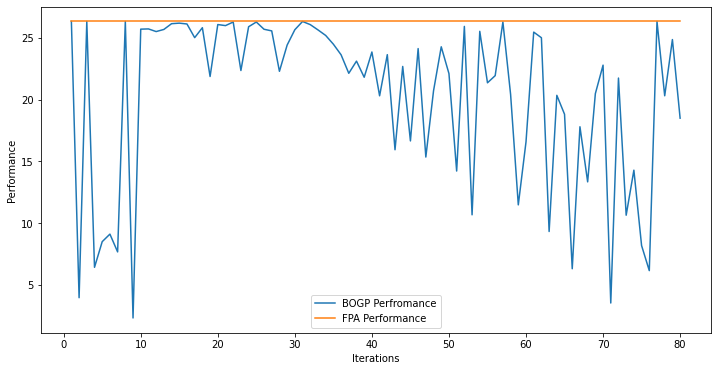

x_next is [ -0.89506109 -29.33125524 -30.64450067  -0.17133482  -0.27993896
  -0.81533181  -0.46932315  -0.97210882  -1.03639296  -0.57136527
  -0.52507682  -0.52923307  -1.14388262  -0.89601433  -0.20203549
  -0.04276412  -1.30975335  -0.08191271  -0.48650257  -0.06178535]
f()=25.095932, actual=24.865
79


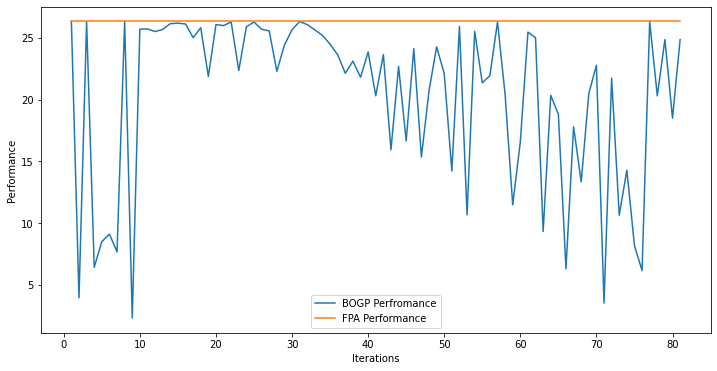

x_next is [ -4.87348163  -2.99091126 -20.6386678   -0.27746923  -3.04808771
  -0.13980382  -7.22178471  -3.34491108 -27.9164369   -0.64520153
  -0.99898225  -9.26456599 -11.16704343  -4.4725295  -29.01009934
  -0.12946223  -1.42907739  -0.07295702  -1.03794224  -3.29807759]
f()=21.413426, actual=21.103
80


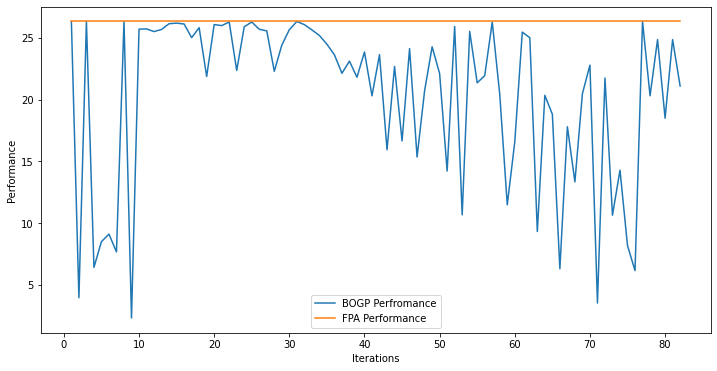

x_next is [-27.60686185 -16.82899584  -5.14253572 -26.04994901 -11.26067081
 -29.23225955  -4.54287936  -0.98570159 -21.50017224 -19.95332134
 -13.61091074  -7.87826887  -7.21742173 -22.9873279   -8.61817506
 -29.7654254  -30.73242979 -14.47011025 -22.67474954 -25.59139964]
f()=20.336456, actual=2.513
81


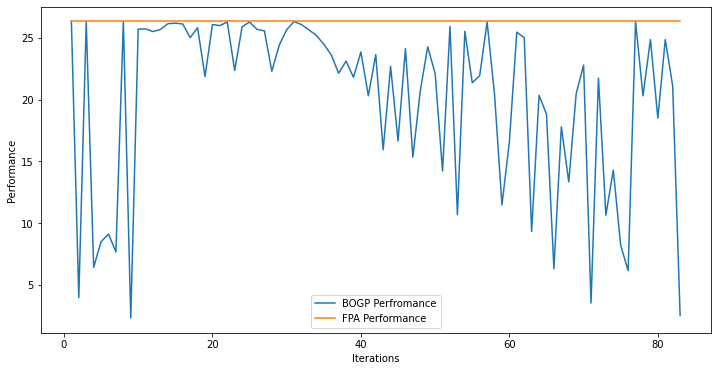

x_next is [ -2.78752244 -15.50883656 -19.28552538  -2.2583072   -1.93194687
  -2.64582008 -23.19586377  -0.23078941 -10.17237641  -6.68764486
  -4.01765941  -5.82235224 -22.54226752  -0.85589129 -24.05087522
  -2.39043976  -3.04255528  -7.00474001  -2.26648236  -1.70111241]
f()=17.828191, actual=18.563
82


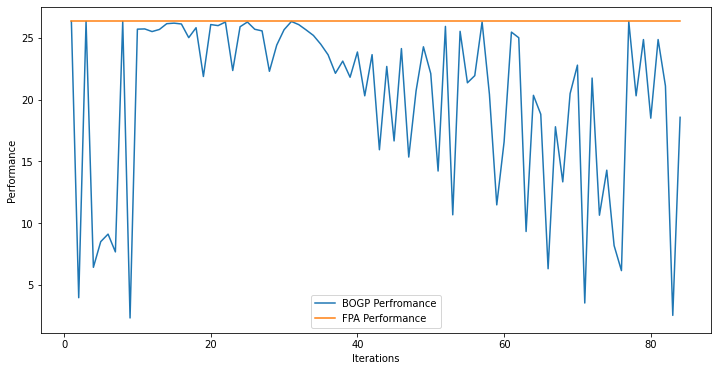

x_next is [ -0.48658112  -1.46568106  -0.12277528  -0.33071453  -0.08893874
  -0.23236452  -0.3804833   -0.40242711 -20.10228306  -0.05677841
  -0.66745991  -0.02605581  -0.33676199  -0.81154607  -0.21409683
  -0.19006876  -0.27913895  -0.17758158  -0.07122066  -0.16085058]
f()=25.669389, actual=25.712
83


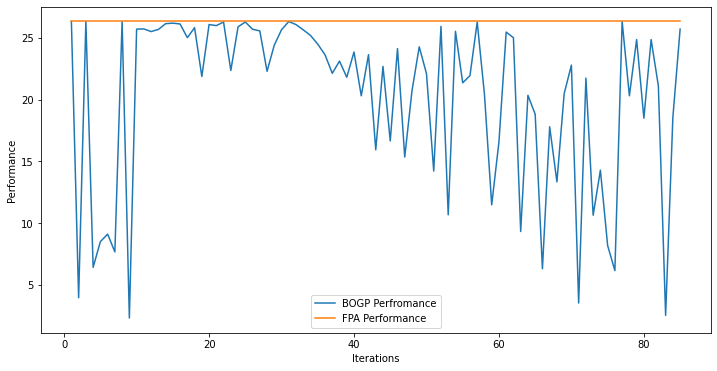

x_next is [-22.00840464  -8.9059244   -9.77413362  -6.90144456 -22.39534972
 -10.95268952  -2.22371163  -7.9620547  -30.59323915 -17.58631673
 -26.68296281 -29.25131252  -4.42558416  -9.86042235 -19.50761205
  -4.2093869  -10.59286427 -12.98245772  -0.67939852 -12.13265364]
f()=11.124846, actual=10.439
84


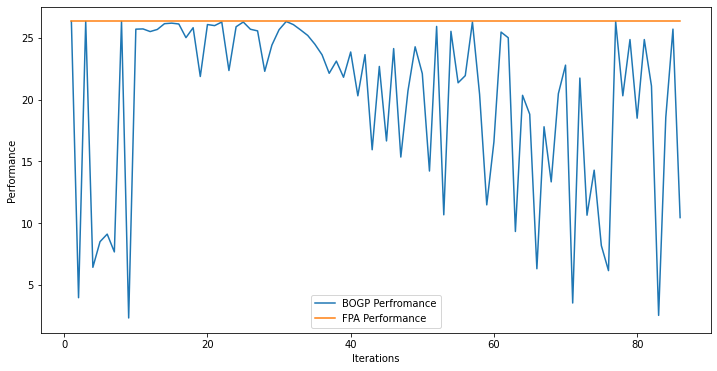

x_next is [-8.12969962e-09 -3.39235671e-09 -1.80855864e+01 -1.74142707e-09
 -2.34498802e-09 -2.26365947e-09 -1.55660524e-08 -1.54870506e-09
 -4.03608726e-08 -5.89362120e-09 -3.95244424e-08 -1.40890716e-08
 -2.00778805e-08 -1.20261694e-08 -2.34879258e-08 -1.36429977e-08
 -9.03170995e-09 -6.04497852e-10 -1.22941554e-08 -3.34595355e-09]
f()=25.733711, actual=26.287
85


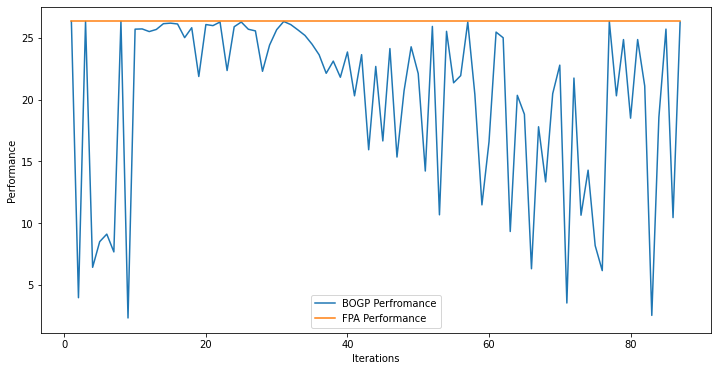

x_next is [ -6.29707449 -17.97774323 -12.13571624 -29.51805764 -10.30466457
 -26.5464541   -8.84120224 -10.44425971 -24.14176143  -2.65357353
  -8.31793063  -3.04417775 -27.08299799 -30.79507057  -0.18180906
 -13.28617915  -2.65375409  -3.9939524   -9.72330087 -29.21180801]
f()=20.125699, actual=7.631
86


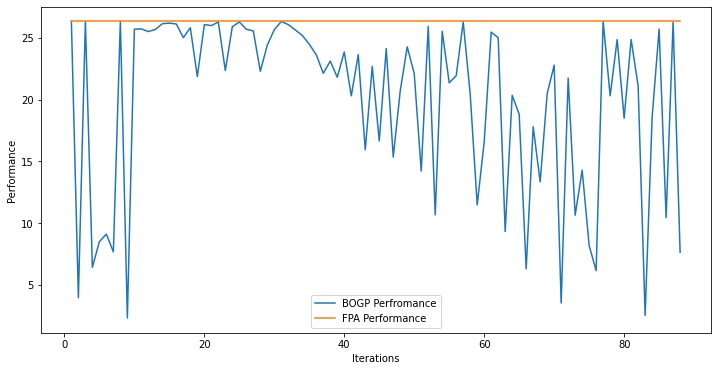

x_next is [ -4.71219948 -30.71463779  -1.5814841   -2.07499262  -0.41865857
  -0.73292759 -30.08625507  -0.96254825 -11.34067969  -4.74674448
  -7.2336107  -21.49934504  -2.47004601  -4.00780073 -22.21991611
  -1.51861016  -3.04270347  -1.0047939   -0.16739702  -2.73051538]
f()=20.241487, actual=20.477
87


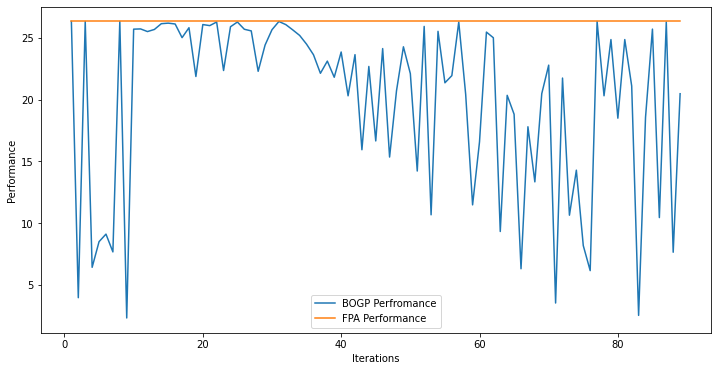

x_next is [ -0.09171508  -0.31805203 -30.58512602  -0.10621141  -0.07940878
  -0.15616451  -1.18948223  -0.12450948  -0.04949469  -0.44820087
 -30.16143143  -0.88246062  -0.31924364  -0.15388611  -0.33022461
  -0.19437598  -0.72431724 -29.92349995  -0.05620589  -0.47213412]
f()=23.805117, actual=24.705
88


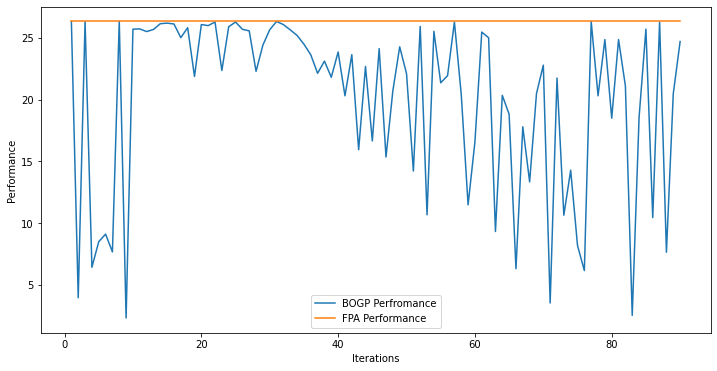

x_next is [-29.47479045 -17.72996697 -13.41574857 -23.40407866 -10.20201522
  -9.13901586 -16.86098716 -24.67247045 -13.59615678  -1.17075209
 -10.45478499 -15.06511994 -29.96099117 -24.75414659  -0.62467876
 -25.41721277 -11.19028146 -24.95746178 -16.0192118  -27.92079302]
f()=20.041341, actual=4.459
89


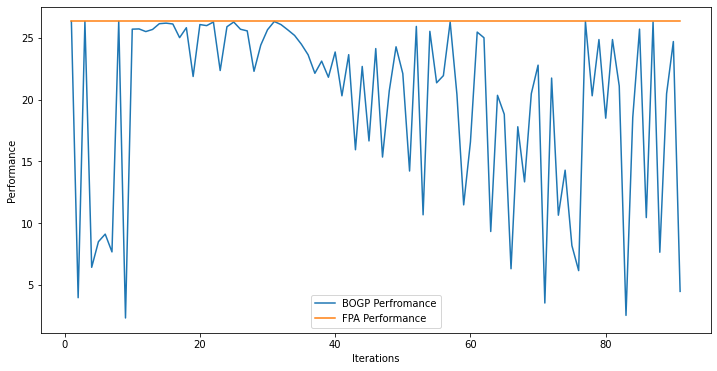

x_next is [ -1.65894966 -19.85016229 -20.67507434  -0.2794771   -3.37414649
  -3.26290749  -6.10855421  -2.34554499 -10.36585962  -2.49818094
 -17.51044832 -10.63059236  -2.81270542 -22.0282396  -23.74341311
  -1.04176344  -3.75992997 -29.51578086  -3.07498177 -11.84748336]
f()=18.043781, actual=18.179
90


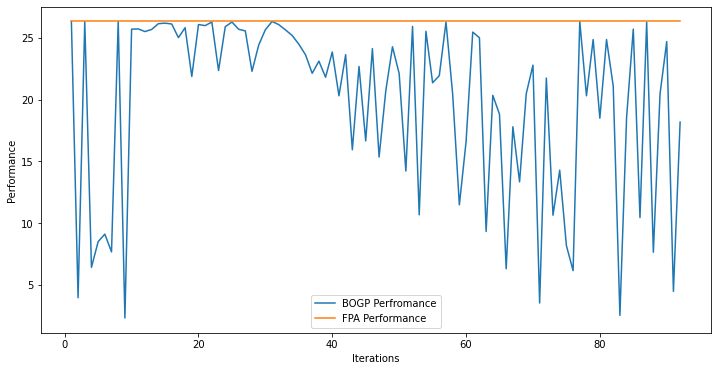

x_next is [-28.57236217 -10.15546178 -22.4591903  -16.58467509 -21.11520355
 -24.6022735   -8.92261972 -14.66990246  -5.2532564  -11.19935541
 -22.08709163 -23.51543155  -9.96506071  -8.52494058 -21.62674524
 -29.99942154 -10.03066537 -22.72044269 -25.01165124 -23.92418505]
f()=19.850599, actual=2.261
91


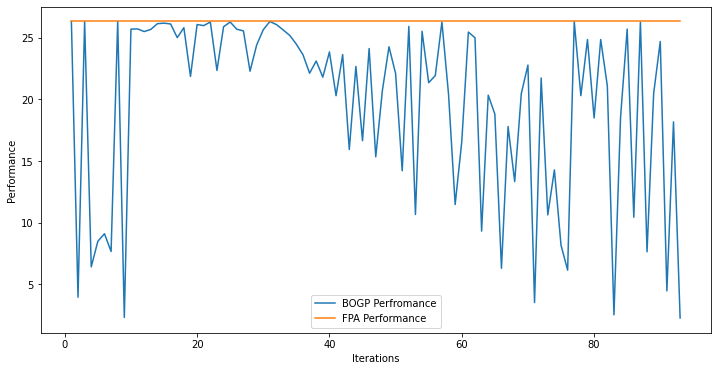

x_next is [ -4.69414612 -17.13375357 -29.03198161  -5.62064767 -13.50619575
 -20.58776053  -4.28688737 -18.85752483  -5.45769098 -11.07183025
 -19.83062597  -5.72892295 -21.00482692  -3.42596466 -25.46017522
 -23.4372256  -23.73323625 -27.85338465  -1.40023498 -18.35797483]
f()=19.659676, actual=9.008
92


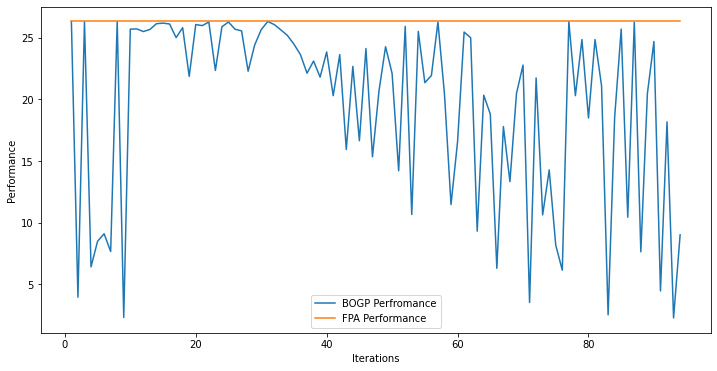

x_next is [ -8.57259244 -10.67672882 -15.90906495  -0.79022439  -0.89069098
  -4.93878786  -3.31793439  -5.03805953 -26.24371044  -0.03398232
  -8.0039373  -29.33891417 -30.41721524 -27.46717171  -0.83241895
  -4.7876208  -17.94501415  -4.13847113  -1.5967292   -0.70078711]
f()=18.237913, actual=18.139
93


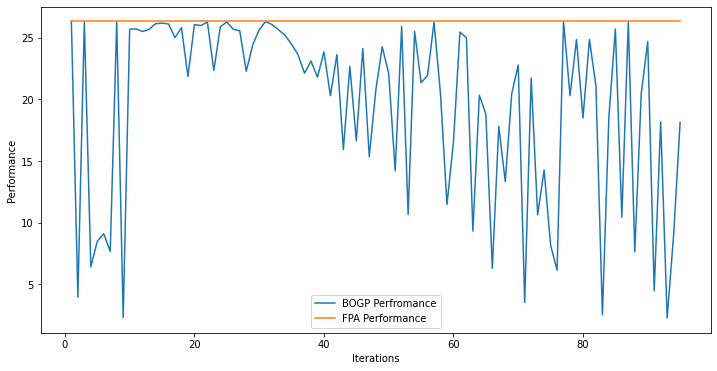

x_next is [-10.0614992  -11.26770035  -7.13392615  -4.69335829  -2.10867626
  -4.85724547 -22.81850605 -12.41268746 -30.22923362  -1.74141743
 -28.68660576  -4.22942561  -7.78206792  -3.81609642 -22.68049679
 -13.20650578 -24.03038228  -1.03869093  -5.66108705 -18.71767312]
f()=13.866115, actual=12.226
94


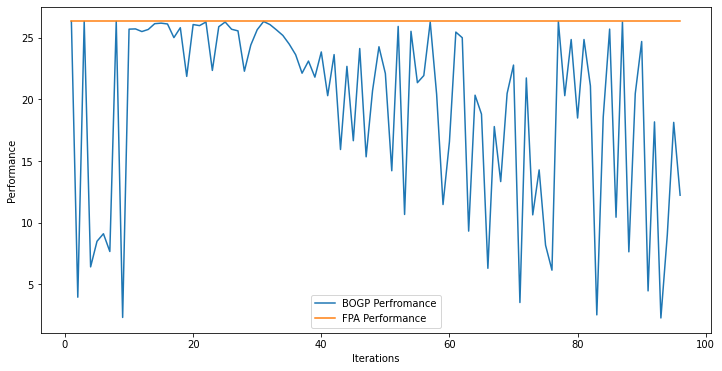

x_next is [ -3.07746944 -12.93124411 -22.70841248  -0.91154306  -0.11518048
  -8.19663932 -27.25044755  -5.52341657  -4.73144885  -7.44815034
 -10.17939588  -9.03644363  -0.34073797 -13.21494962 -28.33873392
  -4.06370996  -3.53490123  -3.25742269  -0.66966929  -7.79751183]
f()=17.462752, actual=17.387
95


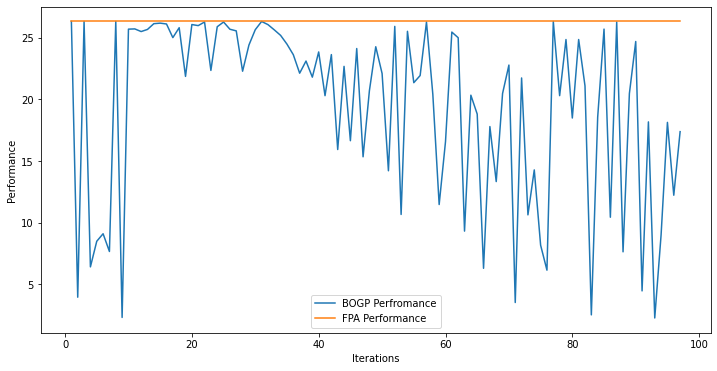

x_next is [ -2.88489549 -26.42563653  -4.46211592  -1.09344469  -1.34890346
  -0.40245595  -3.13122862  -4.86304917  -0.53795245  -1.59140588
 -27.25966328  -5.72523712  -5.56230006 -30.00562518 -29.7148018
  -7.80507633  -3.39546079  -0.04943418  -4.95893316  -2.17898595]
f()=20.179114, actual=18.863
96


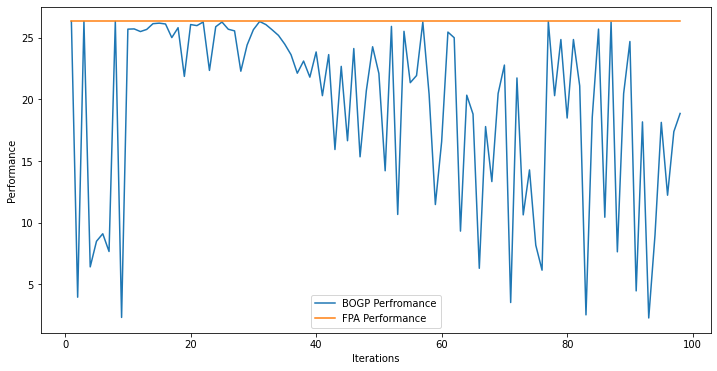

x_next is [-3.19317036e-02 -3.58930674e-01 -3.05289085e+01 -3.88203656e-03
 -7.61650313e-02 -5.27999117e-02 -1.59612756e+00 -9.50015652e-02
 -2.79013184e+01 -2.82699274e-01 -1.74189550e-01 -9.56594311e-01
 -3.85761677e-01 -2.05256724e-01 -1.16852700e+00 -2.69372325e-01
 -3.86391379e-01 -1.45946810e-01 -9.39577532e-02 -4.16792203e-02]
f()=25.664484, actual=25.656
97


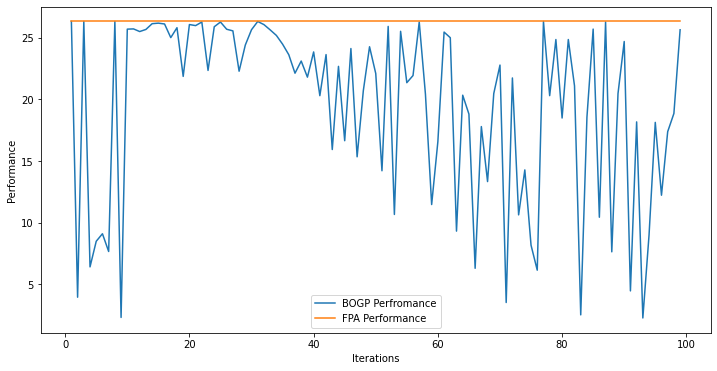

x_next is [-25.49534604 -30.27451539 -16.48277662  -0.21307447 -12.95940701
 -25.56062884  -6.90328317 -24.44181609  -5.50534046  -4.631324
 -16.8245365  -24.82415684 -26.88707927 -19.28997183 -26.39481539
  -3.35002336 -24.85146971  -8.10502976 -14.08993286  -8.58246574]
f()=10.373066, actual=10.382
98


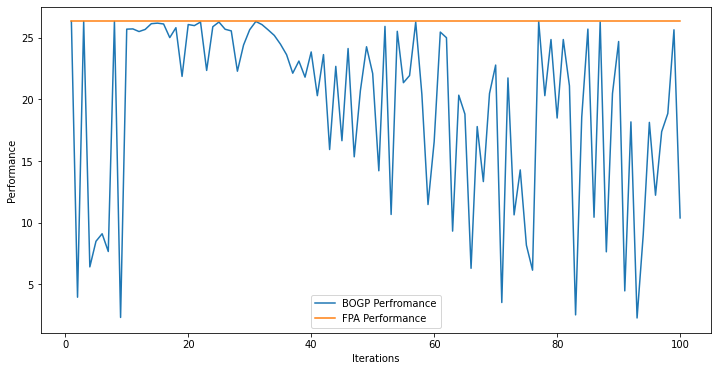

x_next is [-19.57281321 -22.04149668 -13.27368286  -4.44192679 -16.12011967
 -13.27956252 -15.69666937 -22.87953769 -10.28600484 -22.44554666
 -12.08898197 -18.08034309 -12.86948891 -15.91711054  -6.82977233
 -11.3771404   -5.21826932  -9.48528751 -21.7775411  -17.0882854 ]
f()=5.673533, actual=5.566
99


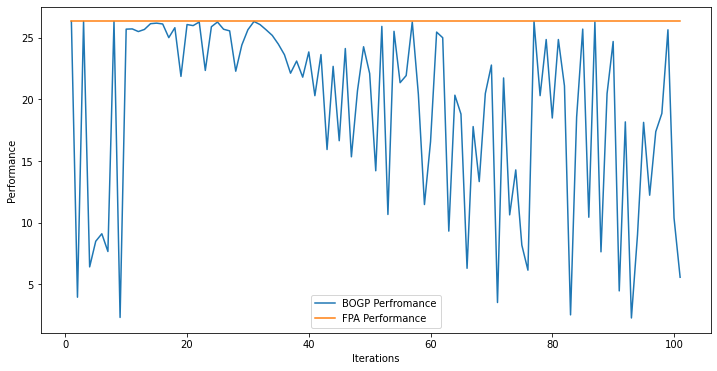

x_next is [-10.90998449 -24.83453858  -4.20541477 -29.39432157 -13.76367341
  -2.72327946 -14.63166027  -1.39800999 -27.21076865 -13.97774345
 -26.26995312 -21.39857585 -10.37117845 -15.36986725  -8.99351271
 -16.86077275 -19.6905598  -12.59996054 -11.47670159 -17.36265943]
f()=6.059766, actual=4.627
100


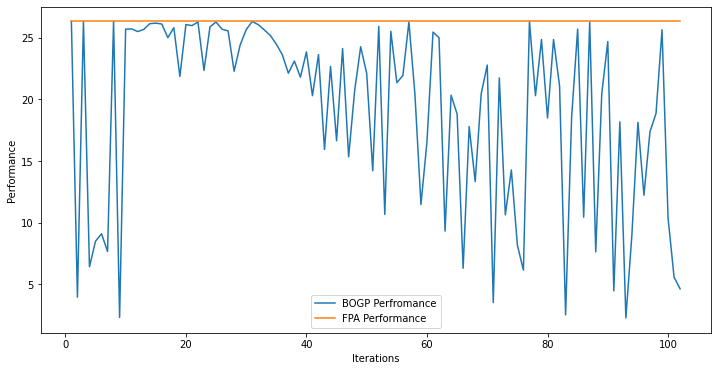

x_next is [  0.   0. -31.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=25.729461, actual=26.287
101


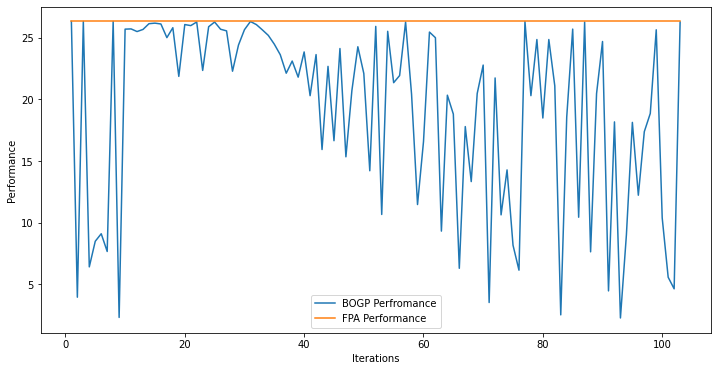

x_next is [-1.61427402e-03 -1.18779734e-02 -3.09849542e+01 -3.87568698e-03
 -4.06535774e-03 -2.66845230e-03 -4.17742944e-03 -6.35500482e-03
 -2.14235833e-03 -2.38443903e-04 -4.97215715e-03 -1.44879554e-02
 -1.22877531e-02 -1.04939763e-02 -1.59475049e-02 -3.20784433e-03
 -5.41523842e-04 -9.16095286e-03 -1.27013808e-05 -3.62377691e-03]
f()=19.187546, actual=26.276
102


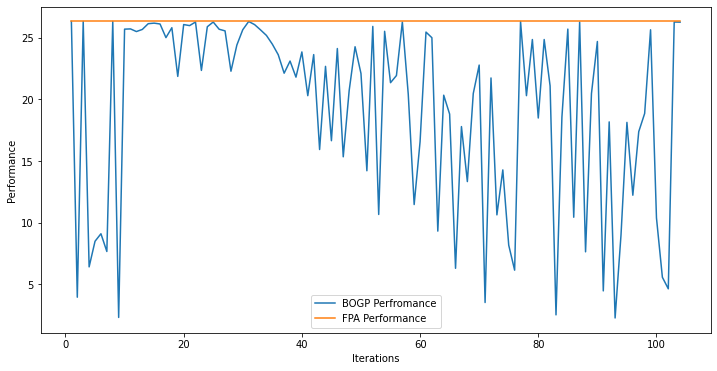

x_next is [-24.41547985 -16.83439446  -2.37215286 -19.96962102 -25.79749427
 -17.99797621 -30.16678829 -19.84822744 -26.67915131  -5.40954001
 -12.79244319 -13.76344325  -5.5079163  -24.55855772 -28.40696288
  -3.10659545 -15.8607589  -30.36162097 -22.54957105  -9.5382906 ]
f()=6.764577, actual=6.061
103


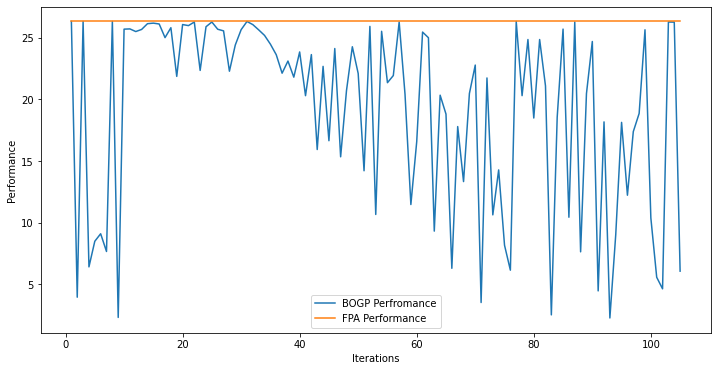

x_next is [-14.08005659 -14.72597661 -14.05809968 -25.91326178 -13.26695747
 -27.39437631  -2.42418511  -1.85866494 -14.27257989  -6.07156582
 -23.70904033 -21.20215004 -21.76968937 -24.17663559 -21.68813382
 -12.9178789  -27.16238464 -15.20155904  -6.74692623 -14.23601674]
f()=0.000000, actual=6.343
104


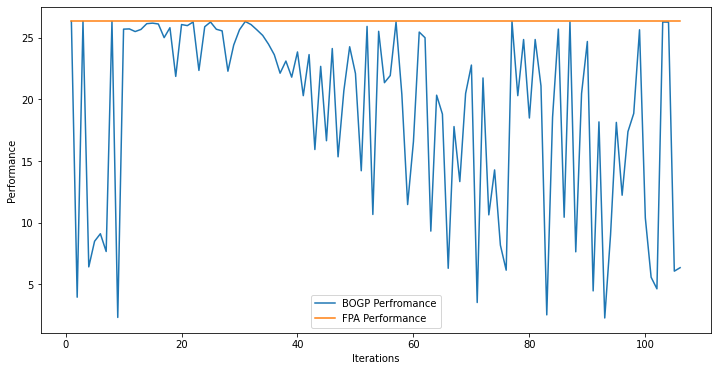

x_next is [ -0.15372468  -0.40803811 -25.08531789  -0.22024079  -6.17287017
  -4.47970054  -9.27376317  -1.1116618   -2.64156767  -0.98258197
 -26.04025019  -5.70905713  -3.17398361  -8.12163404 -11.57718842
  -3.31543522  -1.20758941 -19.31007544  -1.09104446  -0.1419288 ]
f()=20.414938, actual=20.821
105


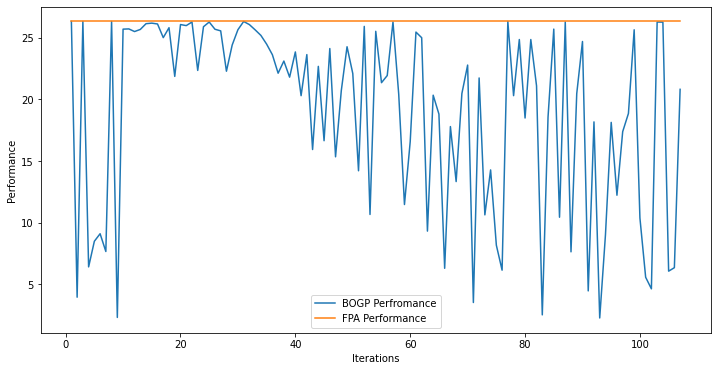

x_next is [ -6.63796314  -2.48400311 -13.30860586  -0.35259006  -0.39463787
 -30.30172759 -27.98655704  -2.15211445 -26.9955247   -2.4187782
 -17.09895248  -0.32225238  -0.92818596  -8.61577408  -3.88325735
  -0.74265043 -14.97431904  -2.2781139  -12.47803769  -5.24678208]
f()=15.443375, actual=16.538
106


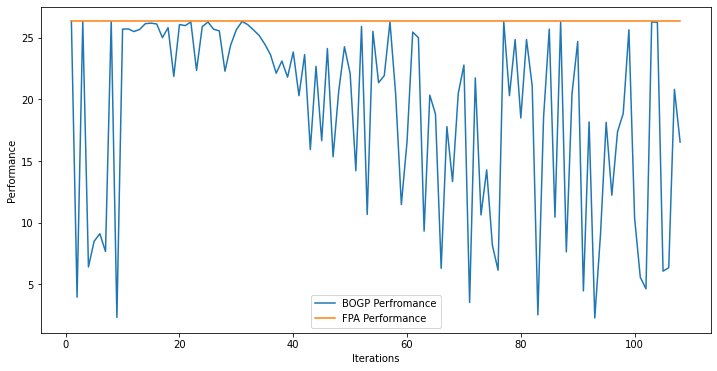

x_next is [-23.36115885  -8.12036105 -23.21225843 -11.08059187 -12.31373592
  -6.83681208 -16.37230589  -7.95906564  -1.33231695  -0.81271345
 -19.1344506  -10.88651384 -27.74919031 -22.37036991 -20.55843145
  -5.12856925  -6.14746566 -10.93026955  -5.35634955 -24.88266097]
f()=12.257219, actual=10.534
107


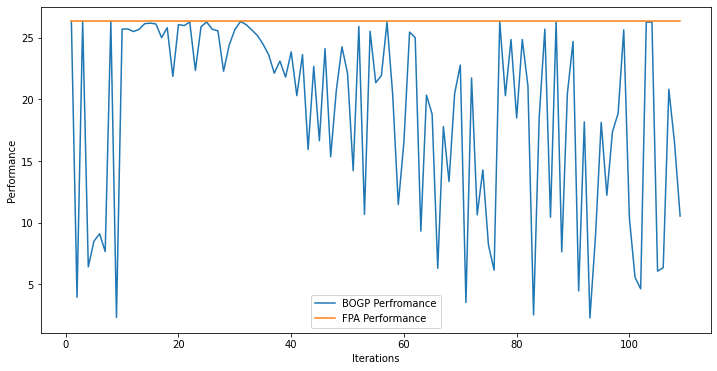

x_next is [-16.5083263  -11.55267776 -22.0608468   -0.16885282 -14.39664527
  -2.12397787 -26.42060044  -2.02150082 -29.0206724   -8.07494157
  -5.45184399 -14.19173661  -0.05348427 -13.33730544 -24.05273818
  -0.25285149  -3.3368827  -26.43797401  -2.56380256  -3.2713734 ]
f()=16.811660, actual=16.567
108


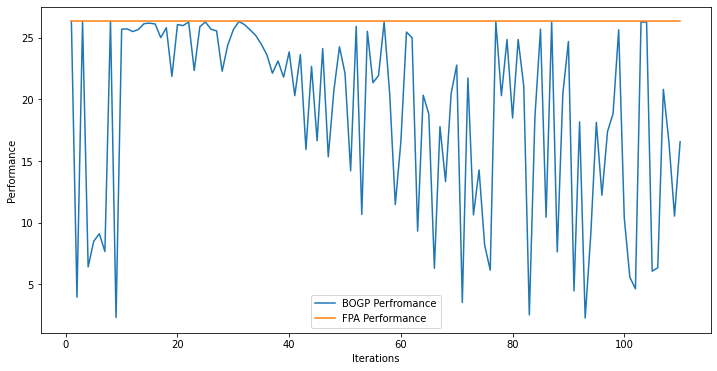

x_next is [-10.28729176  -0.12475818 -28.41034525 -19.06291621 -21.03681097
 -25.34348431  -5.8889301  -21.19750436  -8.82558321  -2.54023595
 -29.8961138  -10.29518034  -9.23602832 -25.8025687   -1.99122553
 -28.78289371 -16.66349616 -22.09678062 -19.85844445 -12.5061944 ]
f()=18.903420, actual=4.734
109


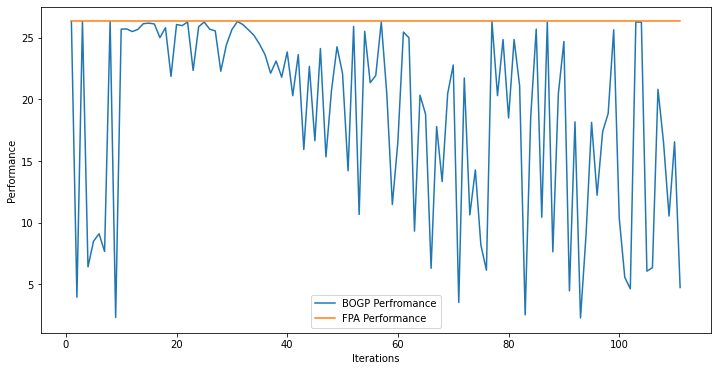

x_next is [-0.02820488 -0.33987215 -0.4467361  -0.23660267 -0.01884036 -0.05118941
 -0.20452948 -0.53250548 -0.57498393 -0.14742532 -0.16303262 -0.50593058
 -0.22975056 -0.761014   -0.17632315 -0.28383976 -0.07315536 -0.09436778
 -0.11263745 -0.36898121]
f()=25.819754, actual=25.850
110


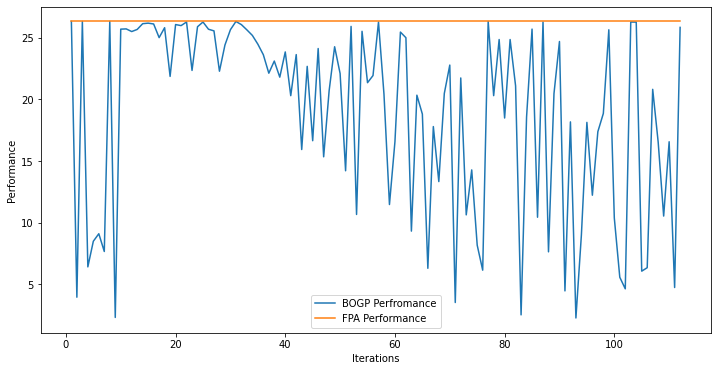

x_next is [-8.39574058e-03 -9.52303998e-02 -3.07999933e+01 -6.64651439e-03
 -2.80682977e-03 -3.72529002e-02 -3.39575548e-02 -8.11799586e-03
 -1.95681329e-02 -1.40604888e-02 -1.14802226e-02 -3.09125712e+01
 -6.40459066e-03 -2.05684945e-02 -1.83352156e-03 -4.10592011e-03
 -1.06785160e-01 -6.92182140e-02 -1.50149694e-02 -2.41945215e-02]
f()=25.496023, actual=25.795
111


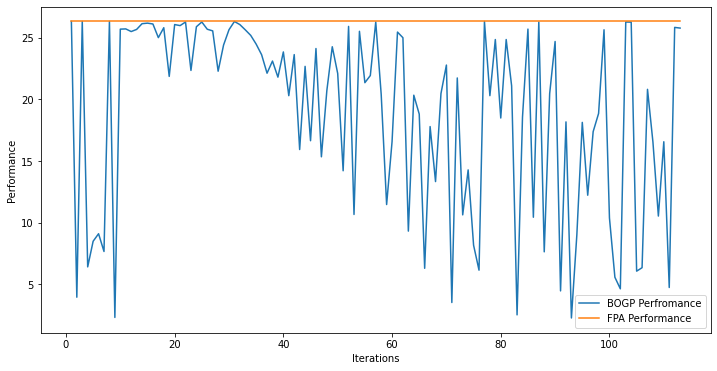

x_next is [ -8.63745604  -1.37119018 -10.41452302 -30.52201144 -18.58663781
  -8.946264   -16.1209209   -6.89092424 -27.61019515  -2.20439149
 -16.22919414 -18.86911552  -8.97874069  -8.47890624 -10.97865021
 -28.1616676  -17.20047095 -15.12848736  -4.624457    -4.94020821]
f()=7.004205, actual=8.068
112


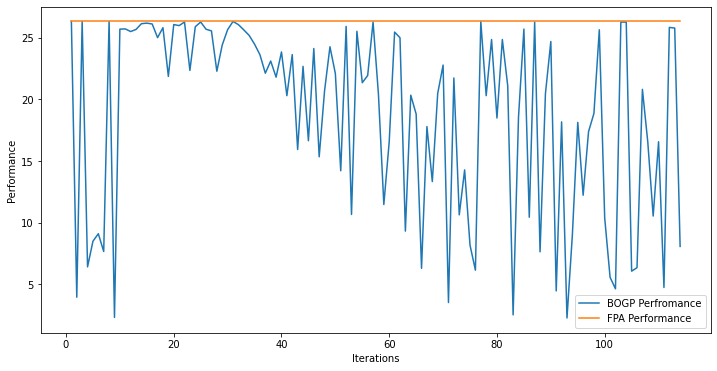

x_next is [-0.01554221 -0.03421618 -0.02099018 -0.00298774 -0.00807099 -0.00901575
 -0.07267011 -0.0117053  -0.13697149 -0.01146903 -0.03739606 -0.00699916
 -0.00797661 -0.04512291 -0.00050999 -0.04345937 -0.01823375 -0.01620925
 -0.02778341 -0.01489526]
f()=26.284196, actual=26.284
113


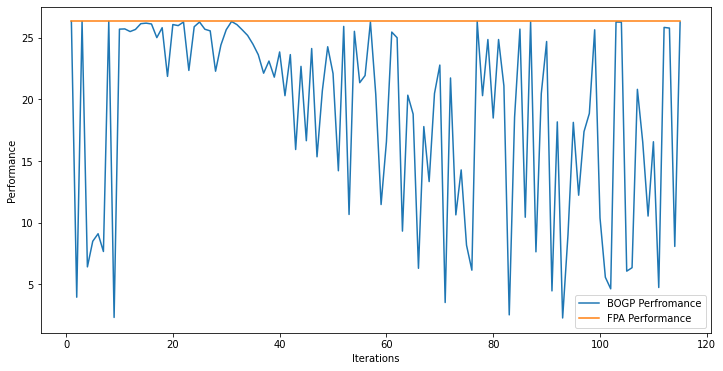

x_next is [-4.43936278e-04 -4.94760680e-04 -3.09989345e+01 -4.30298305e-04
 -3.36417144e-04 -2.71149684e-04 -1.03302388e-04 -4.52106318e-05
 -5.89049637e-05 -5.55612183e-04 -1.97044163e-04 -6.62753528e-04
 -6.65045722e-05 -2.58369941e-04 -9.14325320e-05 -6.37139843e-04
 -7.57220463e-05 -5.94779288e-05 -1.96345194e-04 -2.67993247e-06]
f()=18.869699, actual=26.286
114


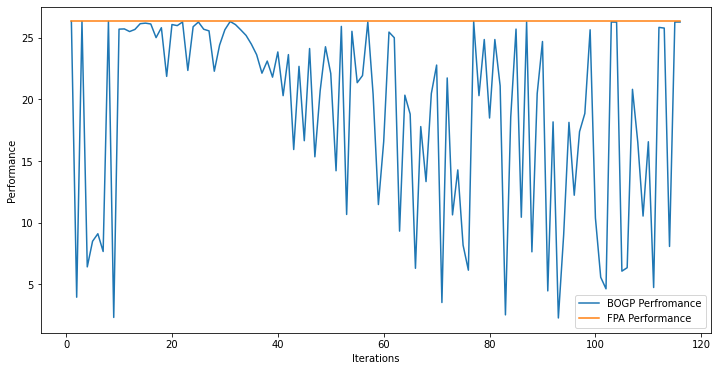

x_next is [ -5.17301031 -30.01295608 -12.69145359  -0.73525315  -3.87849868
  -2.39204938 -21.95611092 -15.23672867 -26.44030659  -1.21494296
  -0.12087316  -2.00623558  -2.19028317 -29.15608047 -25.84177582
  -1.70931769  -4.60928471  -3.57309562  -4.90296896  -5.36051292]
f()=18.520551, actual=17.786
115


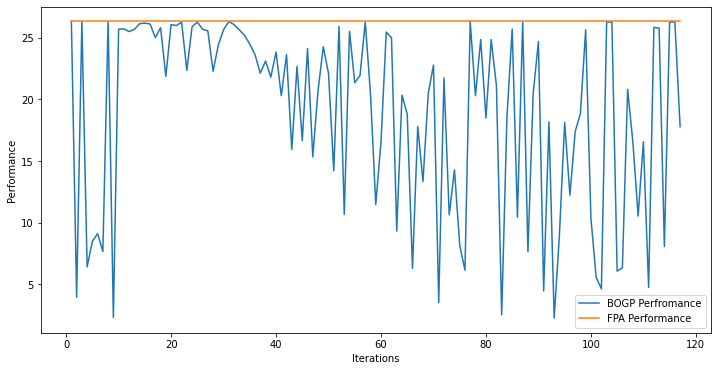

x_next is [-3.69649997e-03 -1.72026979e-03 -3.09733018e+01 -2.39779392e-03
 -6.09614597e-05 -2.16326095e-03 -3.82035133e-03 -3.01072196e-03
 -6.80980749e-03 -1.01544739e-03 -2.87439799e-03 -8.16203871e-04
 -3.14014138e-03 -5.23326497e-04 -1.63093366e-03 -3.30281704e-04
 -2.36564005e-03 -1.46236786e-03 -1.28114203e-03 -3.01623434e-03]
f()=18.924135, actual=26.282
116


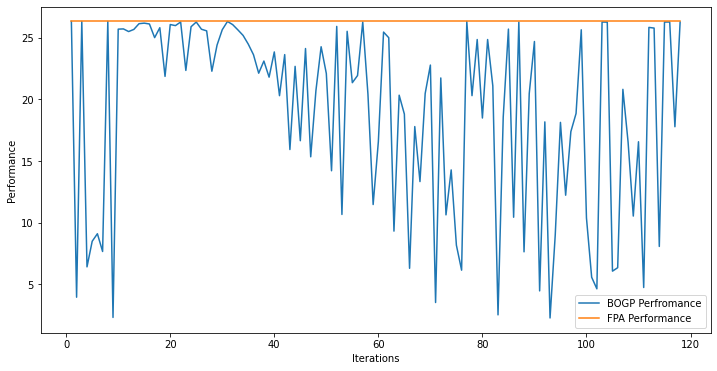

x_next is [-26.502473    -3.44061621 -18.38229797 -18.64061351 -11.18870517
 -30.51917793 -25.78413632 -30.41641066 -13.95459884 -26.58975504
  -1.12997452  -9.70809786 -24.7362091  -19.14061884  -9.10334361
  -1.78586231  -8.78291559 -11.40651862  -5.15973919 -18.23262161]
f()=5.985109, actual=6.484
117


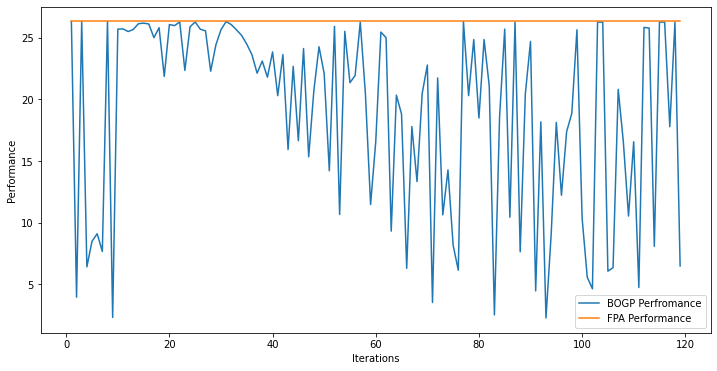

x_next is [ -2.84032087 -23.6160963  -26.51687018  -4.27020374  -1.36169076
 -11.16050335  -3.87377318  -5.72869752 -28.83678342  -0.50495985
 -29.68307029 -25.51252238  -0.9054874   -5.57180698 -29.63048543
  -0.91137221  -4.33656495 -10.28940664  -1.29104593  -6.39744442]
f()=18.793746, actual=18.451
118


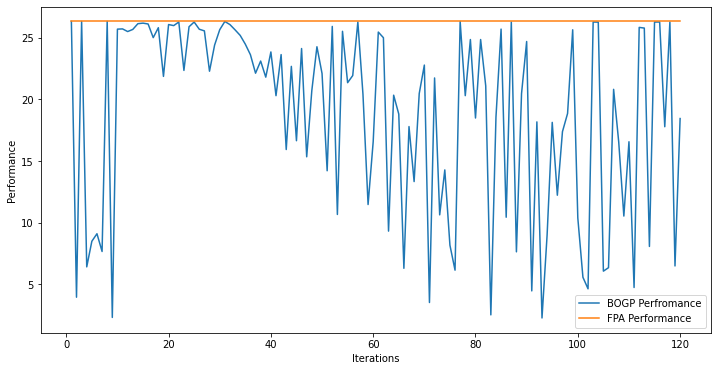

x_next is [ -0.52102765 -27.2272193  -26.27230985  -0.51849507  -1.75036413
  -0.66835145  -2.15195912  -0.64526659  -1.11174301  -2.86721215
 -21.16721366  -2.18550622 -28.82153147  -3.11943406 -16.61656032
  -0.72040768  -2.93224676  -2.60301813  -0.04921402  -1.07516794]
f()=22.102669, actual=22.232
119


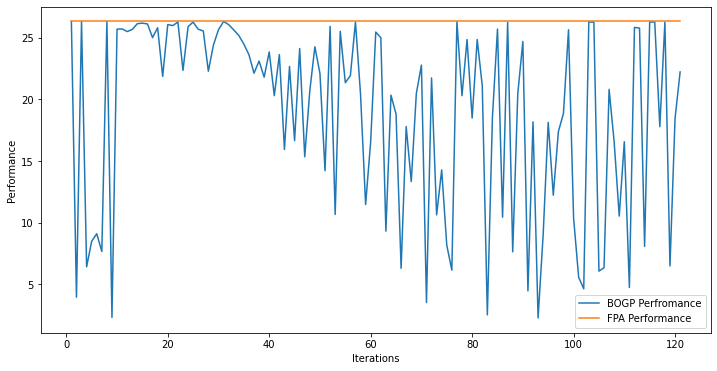

x_next is [ -0.35221772  -6.96022343 -20.53792875  -3.56837867 -18.95811266
  -3.31298972 -18.08982748  -2.95091688 -17.64801719 -11.0919218
 -20.30396205 -18.6148684  -15.85282514  -5.22566009 -30.69557268
  -1.46443654 -22.72843813 -28.10005232 -17.55826607  -9.32793774]
f()=11.319976, actual=11.708
120


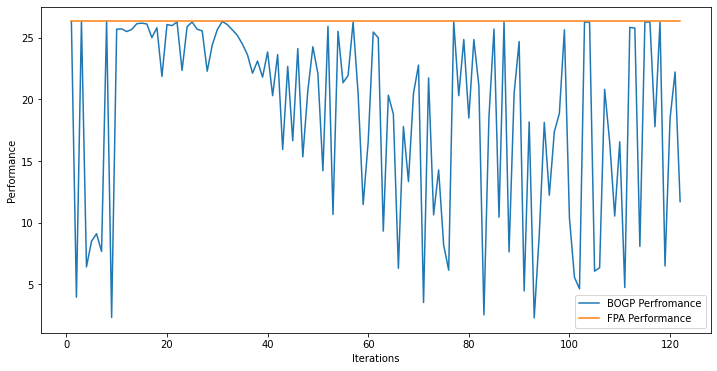

x_next is [ -1.24955617 -26.09213833 -18.97111075 -12.32957363  -2.14751851
 -10.6738994   -2.03986025 -30.55752871  -9.56348017  -3.65236951
  -8.93509126 -14.46889762 -18.15477377 -30.91997052  -8.1155495
 -16.1910252   -1.56750992  -2.72937413 -17.41927974  -1.61259082]
f()=11.714765, actual=11.318
121


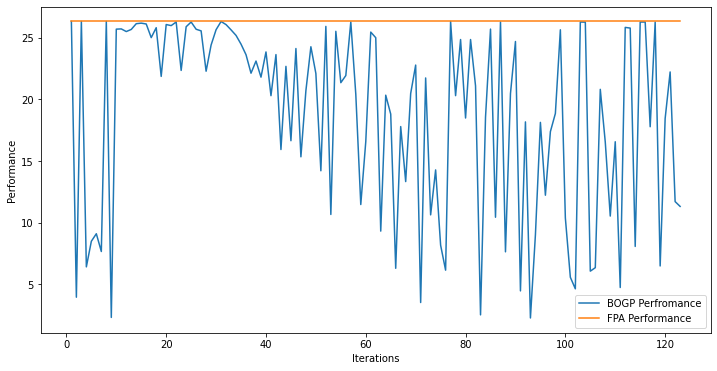

x_next is [-23.09137326 -10.49002093 -13.86070055 -14.58423263  -5.43872961
  -2.17879032  -8.471932   -24.02967081  -1.91752573 -26.98896817
  -8.66056615 -14.12421608 -14.10338483 -14.27324034  -5.27287962
  -6.33197951 -27.19316975 -18.70623849  -1.16757528  -3.83771227]
f()=18.785229, actual=9.395
122


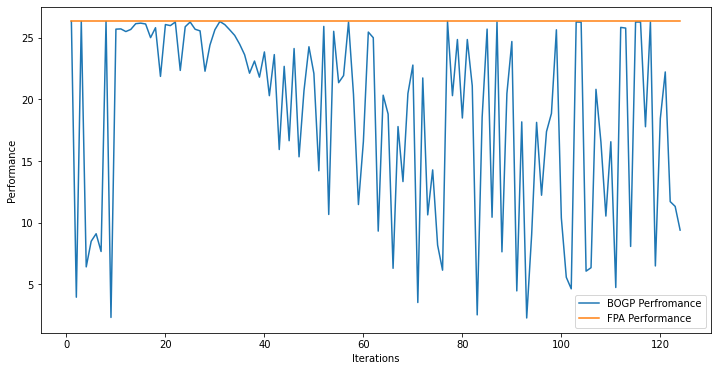

x_next is [-27.4546369   -3.00366283 -24.48041311  -1.01411302  -4.75650864
 -12.86686426 -17.60910093  -0.63602801 -13.93350442 -30.01939283
 -19.57834889 -18.11242636  -4.08119357 -29.18371476 -27.60577496
 -25.2743351  -24.35761669 -12.48273054 -11.97462087 -16.14261247]
f()=18.709292, actual=7.774
123


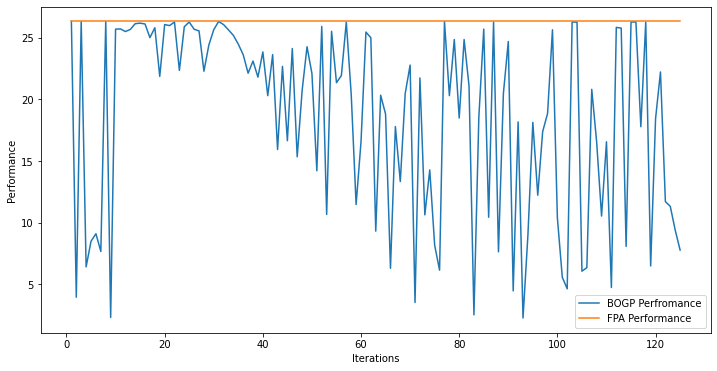

x_next is [-3.15149897e-04 -7.82633431e-04 -3.09981366e+01 -1.01071846e-05
 -5.22824922e-04 -1.66081807e-05 -2.08645379e-05 -1.60706500e-04
 -1.63544379e-03 -1.52034563e-04 -2.91166853e-04 -5.68860653e-05
 -1.25821900e-04 -3.07142547e-05 -6.69861808e-05 -9.22895531e-05
 -2.66084579e-05 -4.31154014e-04 -3.47932972e-04 -1.77882516e-04]
f()=26.058062, actual=26.286
124


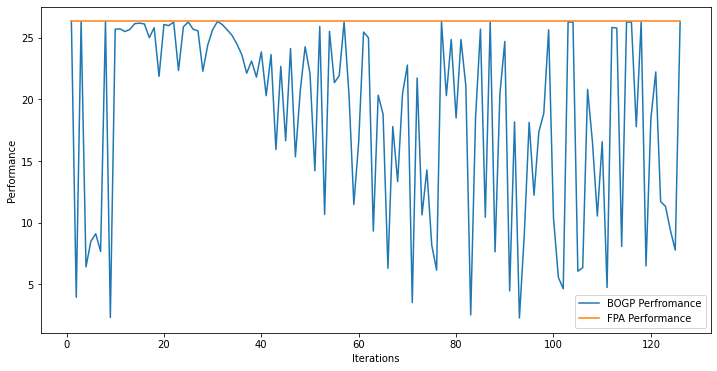

x_next is [-22.00763002 -15.23487806 -28.12877742  -0.81172489 -27.2193655
  -0.59089763  -2.20348343 -27.1983034   -3.08941389 -21.1416099
 -13.99186291 -25.7454816  -12.91490991 -22.41489719 -25.58515323
  -1.43831343 -28.26127358 -26.4806866  -23.08552492 -12.17622747]
f()=18.682391, actual=9.218
125


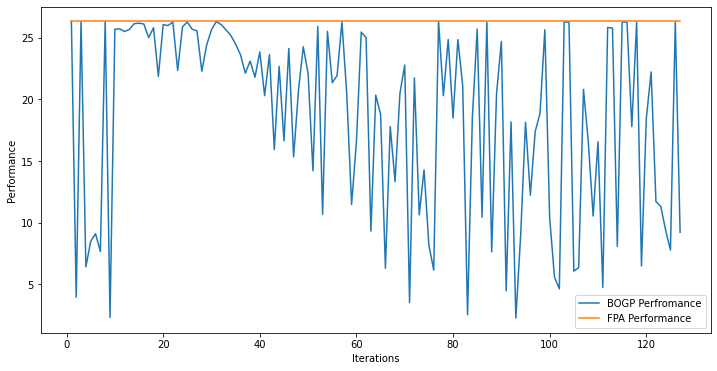

x_next is [ -1.67009676  -3.6293158  -10.67473078  -3.44605161  -9.13360096
  -1.619041    -4.43373575 -11.62450345 -12.86879232  -4.8840199
 -16.98709986  -6.42370223  -4.17189835 -30.76786809  -2.19990922
  -1.40171687 -30.76760549 -28.83334057  -1.12217869  -9.57298678]
f()=16.079153, actual=16.184
126


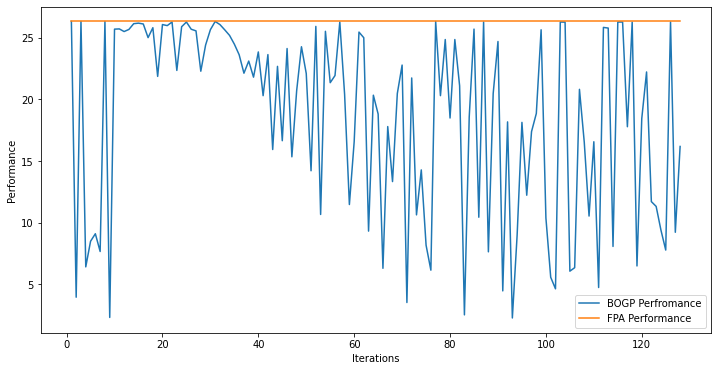

x_next is [-17.10497209  -3.55777111  -3.51759071  -4.28706262  -9.31361852
  -1.22486333 -17.60199019  -6.25181283  -1.93952504 -11.30473153
 -28.85497469 -27.40653238 -27.06603388 -23.99037757 -11.05743814
 -12.17459556 -27.9360017   -7.98223538  -3.06650549  -2.32408437]
f()=12.608423, actual=11.585
127


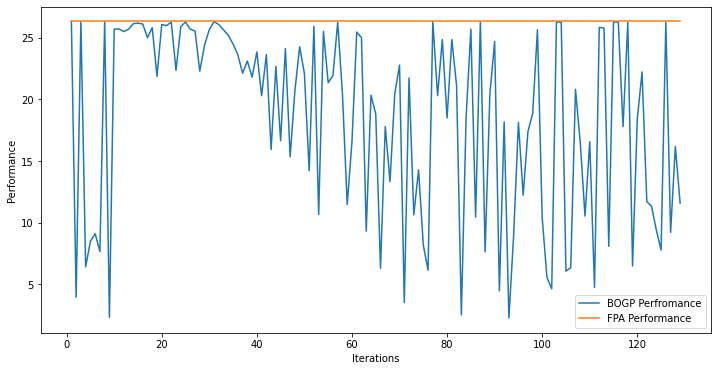

x_next is [-10.93226134 -15.56259219  -2.60854459 -11.2067571  -22.18694525
  -3.48503072 -18.97680702  -4.06370878 -15.43385789 -25.41616538
 -28.01006342  -8.52548511 -16.71504852  -9.95499894 -16.44234723
 -11.50775715 -10.6561534  -24.69497659  -0.71646316 -22.68351367]
f()=18.534541, actual=8.168
128


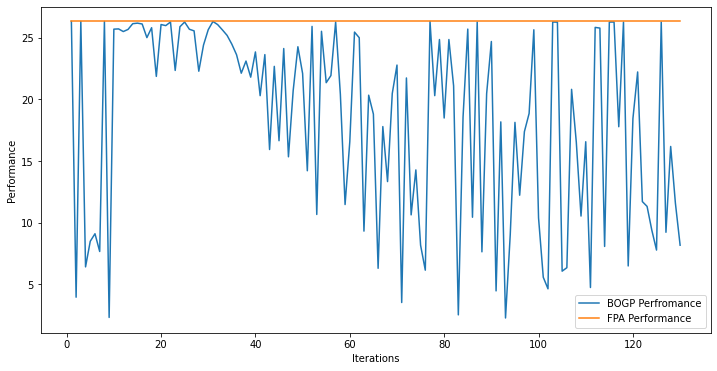

x_next is [ -4.50564133 -25.12518492 -24.21491725  -0.66437607  -1.30820505
  -4.64107729 -27.25381603  -7.99747686  -3.99494046  -3.22494241
 -23.70924137  -3.17589223 -27.40016392  -3.50022113  -5.13198559
  -2.22946783 -14.26255095 -20.3326488   -2.82222121  -4.42507067]
f()=17.482588, actual=16.795
129


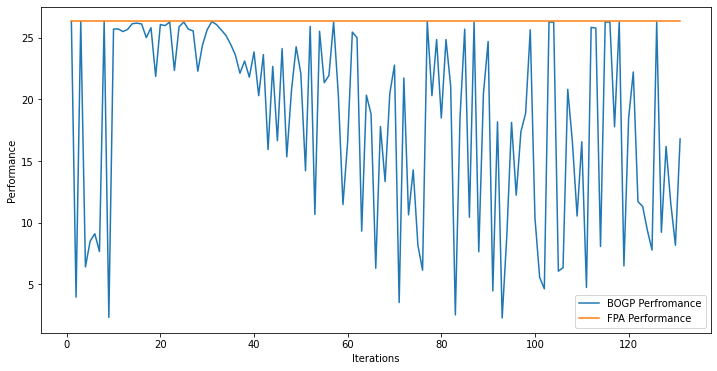

x_next is [-10.88880691  -1.21247598 -12.09197142 -23.11180391 -22.80958997
  -6.06229279 -19.37200922  -6.77632363 -30.10488618 -13.4520685
 -13.50307857 -13.93832218  -5.93356846  -1.04517787 -22.60565992
  -6.90324175 -14.87541424  -6.83069693 -20.46108053  -7.97105385]
f()=7.228094, actual=5.530
130


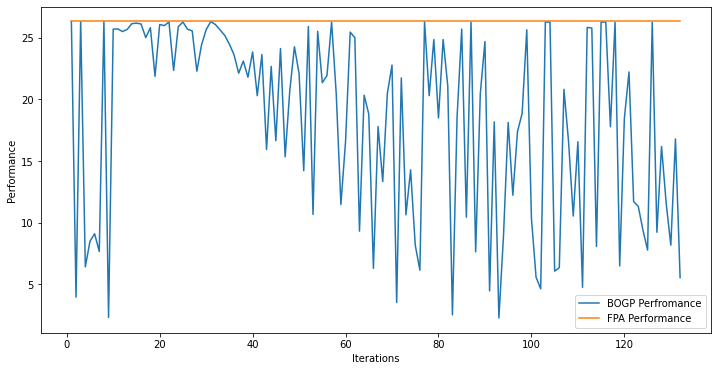

x_next is [-10.96396487 -24.50482356  -8.46554461 -10.75657546  -1.74550945
 -20.992757   -23.84817286  -9.07127823  -1.25049302 -11.65633988
  -9.01476069 -18.17606104 -16.48363551  -2.12450876  -7.42574772
 -30.3084825   -1.8835548  -15.07850151 -15.90353708  -0.66670579]
f()=8.629805, actual=8.146
131


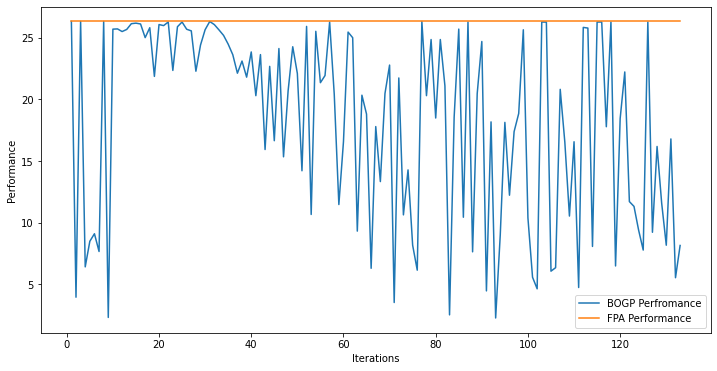

x_next is [  0.   0.   0.   0.   0.   0.   0.   0. -31.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=26.358844, actual=26.290
132


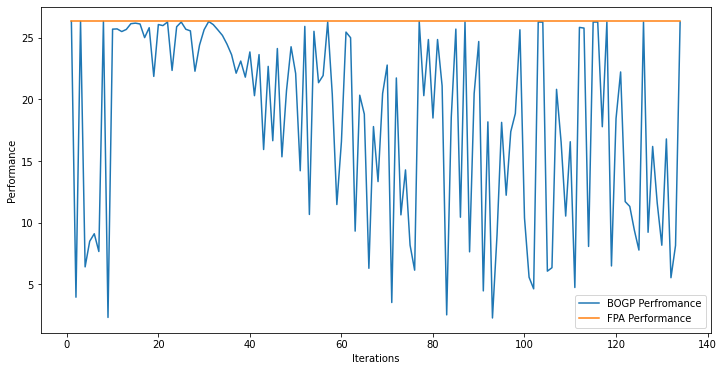

x_next is [-22.62660854 -25.80434365 -23.62291235 -26.33639288 -15.530935
  -4.79670359 -27.5375655   -9.415004   -25.2002861  -29.92675672
 -10.5340026  -22.43014125 -10.65322398  -5.91564825  -4.16453325
  -3.23158798 -11.39275703 -15.87304879 -29.08641526  -3.94748326]
f()=4.213031, actual=5.537
133


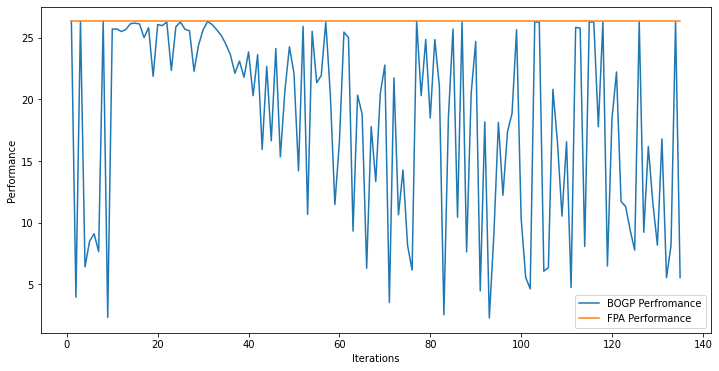

x_next is [-22.66045775  -2.66906899 -23.99721829 -16.83230014  -6.75319233
  -4.3667678  -20.92107546 -29.50932743  -3.27711724  -2.37337604
 -10.96102073  -9.51574154  -6.13063199 -18.49103594  -7.77800079
 -19.48045829  -8.72827353 -17.96781685 -11.52867056 -15.29057609]
f()=8.138439, actual=6.477
134


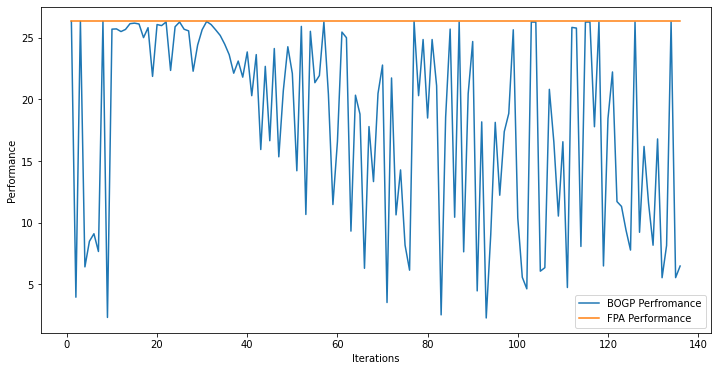

x_next is [ -2.65061666  -0.67459047 -29.49020406  -2.59491216  -7.32531433
  -0.55325796 -22.97713857  -0.63455071 -10.0363579   -3.08809729
 -12.30751093 -26.31906059  -0.16422721  -7.45548539 -21.02616372
  -2.44964659  -1.40106805 -21.1291985   -3.74146205  -8.78095413]
f()=18.111120, actual=18.100
135


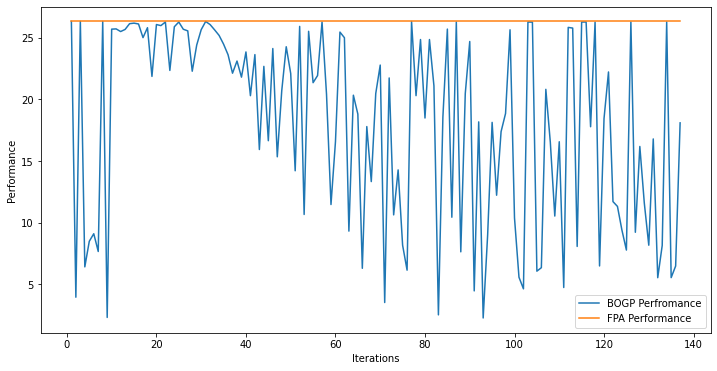

x_next is [ -4.56290756  -2.79409044 -26.07270165  -0.57812048  -6.40188557
  -2.6723333   -5.68729001 -22.48979882 -29.7205419   -1.5132921
  -0.3419877   -8.61356293  -2.58437869 -11.1761354   -4.8395618
  -6.61165375 -19.59064853  -3.92986936  -6.00880198  -0.445631  ]
f()=16.685843, actual=16.515
136


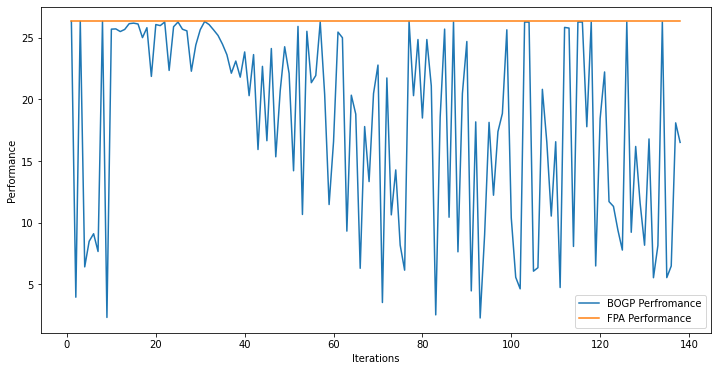

x_next is [-3.55166470e-01 -1.93119894e+01 -1.04597817e+01 -1.97169645e+01
 -2.27117947e+01 -3.03518722e+01 -9.06490384e+00 -1.88723812e+01
 -2.51691366e+01 -2.93379059e-02 -8.67928222e+00 -1.03441304e+01
 -1.90852263e+01 -3.43543840e+00 -2.23237346e+01 -2.51575575e+00
 -5.37340571e+00 -1.33282221e+01 -1.60606300e+00 -6.90678347e+00]
f()=10.795756, actual=13.222
137


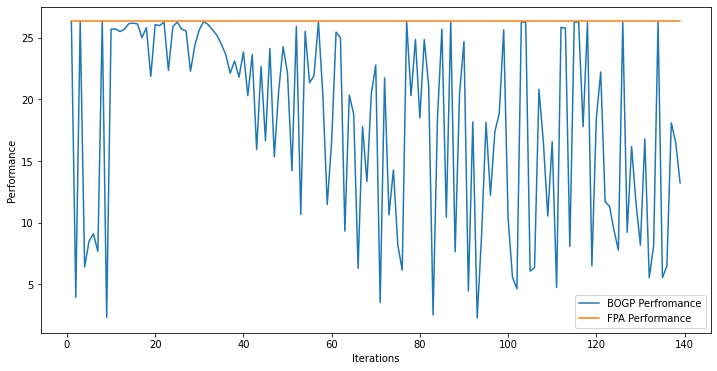

x_next is [-3.26028428e-01 -3.07975871e+01 -3.09281547e+01 -4.57137145e-02
 -3.39012497e-04 -5.10175022e-02 -9.68128373e-02 -3.92169869e-03
 -2.60071349e-01 -1.40486034e-01 -1.00454131e-01 -5.57221425e-01
 -4.84578913e-02 -1.96250224e-01 -3.09968142e+01 -1.44836481e-01
 -1.29015051e-01 -2.20567901e-01 -1.66501708e-02 -1.83976195e-01]
f()=25.760390, actual=25.709
138


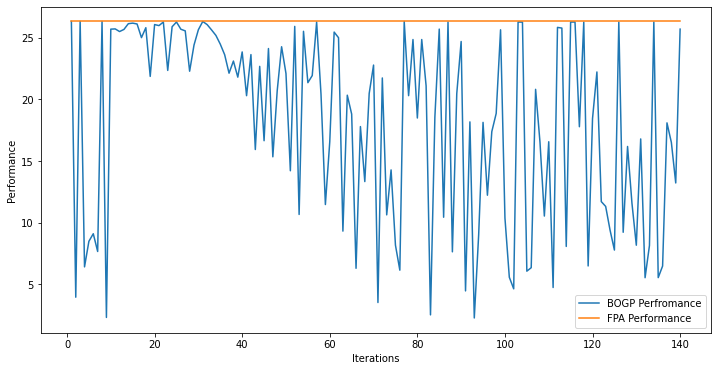

x_next is [-23.10456786 -30.88705076 -15.66303656 -14.4021185  -28.08641765
 -25.9323937   -6.58101419 -18.79428179 -28.90187273  -7.72983614
  -3.56645145 -18.09099574 -15.24141634 -20.02829921  -4.86046746
 -26.86019767  -0.80134327 -18.11791091 -23.3236389  -30.81675505]
f()=18.152161, actual=4.171
139


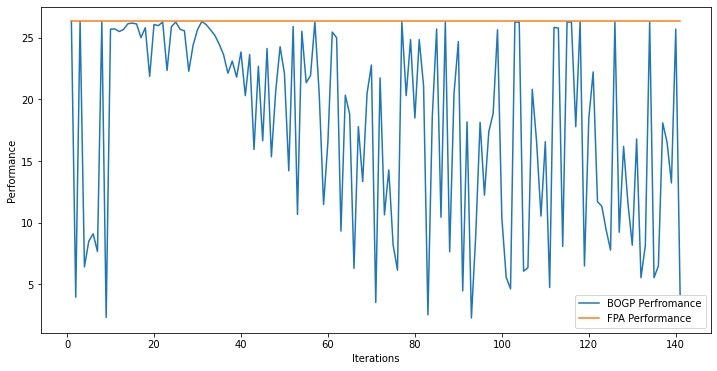

x_next is [-2.66724835e-04 -2.22860354e-04 -3.09990403e+01 -1.03727163e-04
 -1.78112932e-04 -8.73772621e-05 -2.98501779e-04 -4.30637104e-04
 -5.26020849e-04 -5.08954234e-04 -4.15319077e-04 -3.03205806e-04
 -6.26340701e-05 -2.04406458e-04 -2.28551897e-04 -2.17186923e-04
 -9.57627396e-05 -7.44104655e-04 -3.29836158e-04 -2.76438363e-04]
f()=18.052496, actual=26.286
140


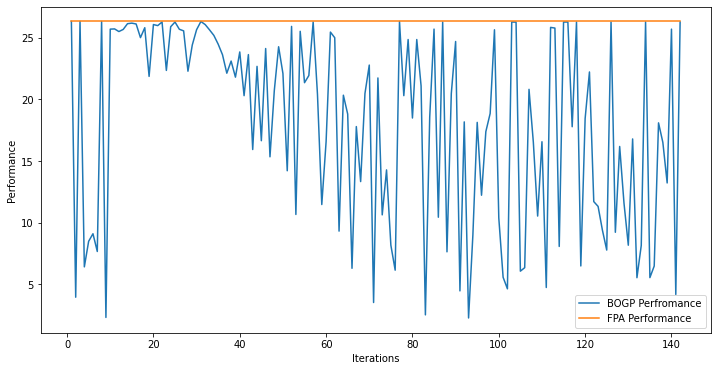

x_next is [ 0.00000000e+00 -3.43564428e-14 -3.09994909e+01  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -5.75750523e-13 -5.17770886e-14
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
f()=26.126441, actual=26.287
141


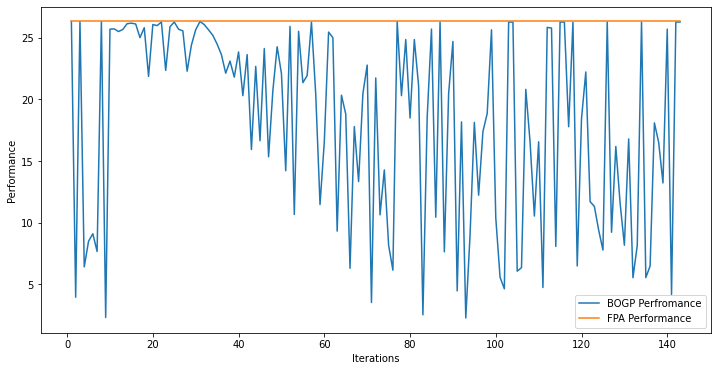

x_next is [ -8.42357704 -21.43703747 -28.71921944  -1.74180145  -1.74867747
  -1.82736329  -3.55344253  -2.82636937 -19.57376105  -2.80415502
  -0.82565373 -30.25187019  -0.11608031 -27.20041363  -1.18307287
  -5.70768861  -1.066474    -4.34920914  -1.64463968  -0.33963512]
f()=20.412946, actual=19.575
142


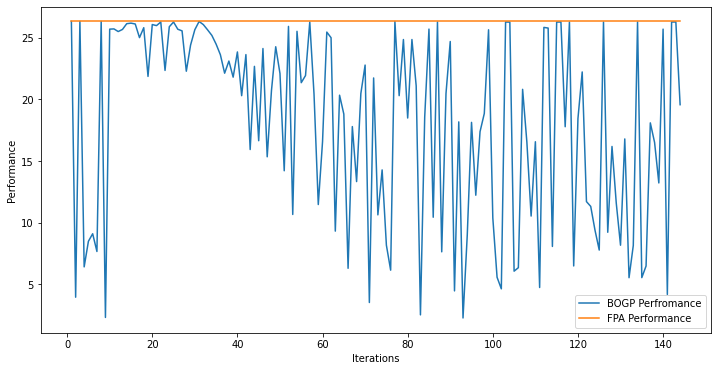

x_next is [ -2.07100154 -21.40683397  -2.82294406  -6.87823848  -6.04947731
 -13.71521575  -8.08268595 -15.09944106 -28.79161414 -28.92562015
 -23.96133963 -26.15349525 -25.4597776  -28.84679653 -15.9244286
 -19.51372621 -16.08975076 -10.82434287 -12.40121767 -20.91554204]
f()=5.760364, actual=6.249
143


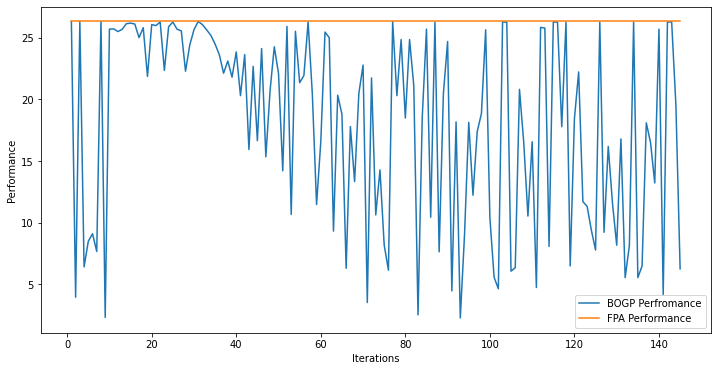

x_next is [ -0.27287065 -30.61051238 -28.76981255  -1.22726123  -0.11313842
  -0.65986349  -0.06209398  -1.0468848  -24.78274903  -0.16952848
  -0.12036077  -0.04605104  -1.95356924  -1.18572071  -1.60490687
  -0.47925584  -0.60092265  -0.36549048  -0.68023297  -0.68552625]
f()=24.791796, actual=24.732
144


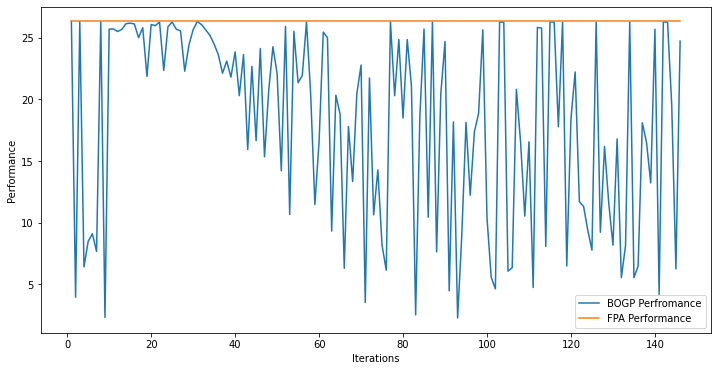

x_next is [-1.28389052e-04 -3.09999872e+01 -3.09999980e+01 -7.69077152e-04
 -8.19986207e-05 -1.86465340e-04 -2.45165331e-04 -1.94027580e-04
 -3.74654394e-04 -3.01500696e-05 -1.17765528e-04 -3.09999843e+01
 -2.54333483e-04 -2.91910815e-06 -3.09994654e+01 -7.47381469e-05
 -8.53314586e-06 -1.96479627e-05 -5.99147312e-05 -1.44474403e-04]
f()=25.910472, actual=25.588
145


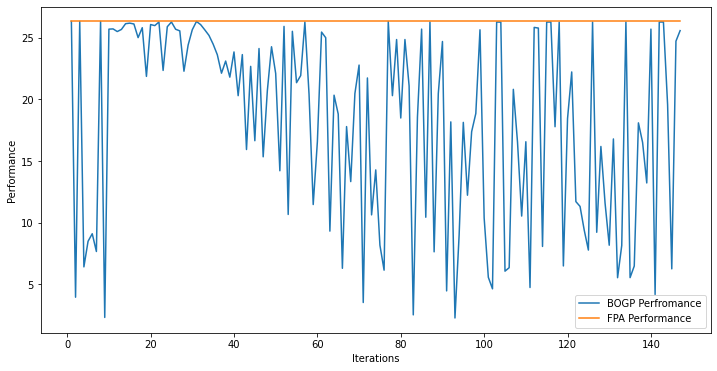

x_next is [ -8.96461085  -1.92585605 -24.0886852  -15.31540282 -25.50529725
  -5.80787381 -12.93505299  -1.43839065 -11.04785782 -28.82376061
  -3.03320335 -17.37757355  -1.54196728 -25.37188598  -1.12669233
 -24.92816575  -3.37573353  -5.03459854 -19.01980167  -5.54061021]
f()=7.065479, actual=6.687
146


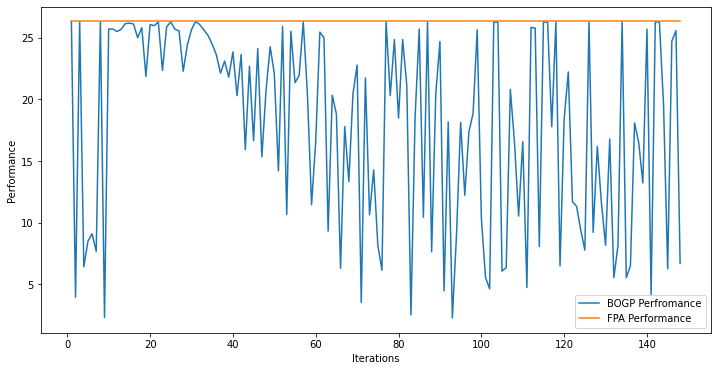

x_next is [ -0.65931979 -20.79498407 -24.22633216  -2.48494594  -6.27582455
  -2.81161341  -1.83410798  -1.79232131  -6.87230391  -2.38756384
 -29.21170316 -15.96370839 -14.08586339 -16.38824325 -23.15243469
  -5.53641311 -18.94552585  -0.40074909  -2.01369465  -0.56400944]
f()=17.706070, actual=18.705
147


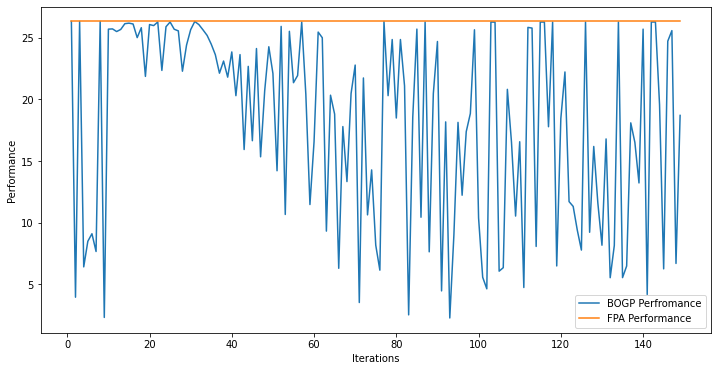

x_next is [ -0.21901945 -27.17598655  -3.14919803  -0.13965226  -0.78406168
  -0.6843878   -1.91826932  -2.13403769  -3.38610324  -0.46125859
  -0.48768003  -4.13150304  -1.88105464  -1.07620744 -29.92063111
  -0.45405781  -0.77619408  -1.25070211  -0.57621297  -0.65435073]
f()=24.090256, actual=23.944
148


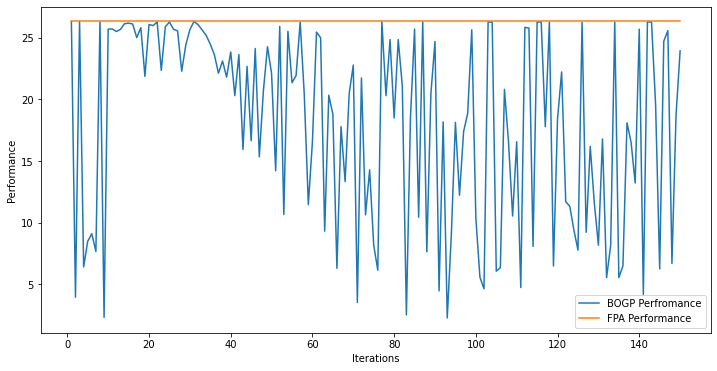

x_next is [ -1.52288198 -24.64490011 -28.9408227   -5.93357418 -21.2882431
  -5.40475394  -7.19243667  -2.45235166 -29.96032543  -2.205286
  -1.48712156  -2.04920338 -20.80206645 -15.88331635 -12.86383001
 -10.14838805  -0.34399934 -29.87682043  -1.31918597 -14.68619628]
f()=15.549297, actual=14.947
149


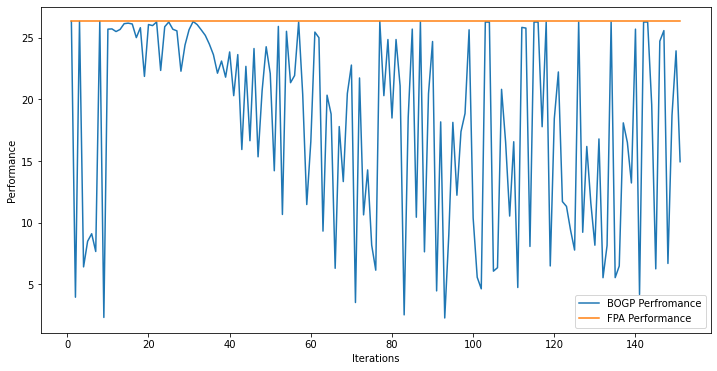

x_next is [-0.36476412 -1.49603441 -3.57350069 -2.95743512 -0.46832534 -0.37711081
 -1.4499206  -3.1994794  -3.07127846 -0.3298826  -0.6063917  -3.38055304
 -0.44527447 -0.73239528 -1.08785646 -1.60619359 -0.89770723 -0.06178987
 -2.41432183 -0.33402582]
f()=18.135330, actual=23.493
150


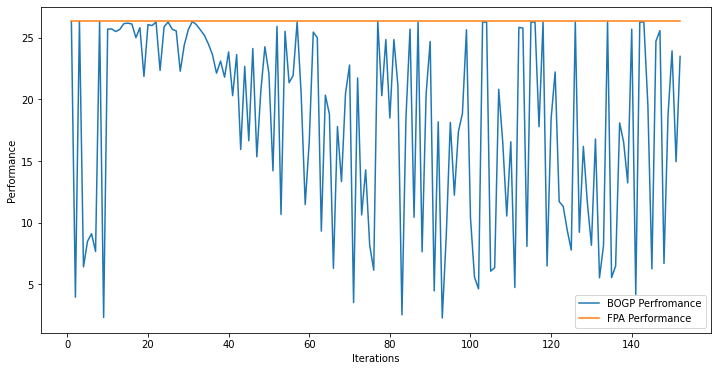

x_next is [-19.80754109 -23.53911906 -27.51519135  -8.18163304 -16.08767215
  -9.99466726 -16.4890061  -20.44087303 -23.56740081 -11.32790706
 -22.7428626  -19.69407503  -6.99733578  -9.94058822  -4.713264
 -14.3453358  -25.57453053  -9.37352438  -5.60918154 -19.47436874]
f()=18.170695, actual=6.679
151


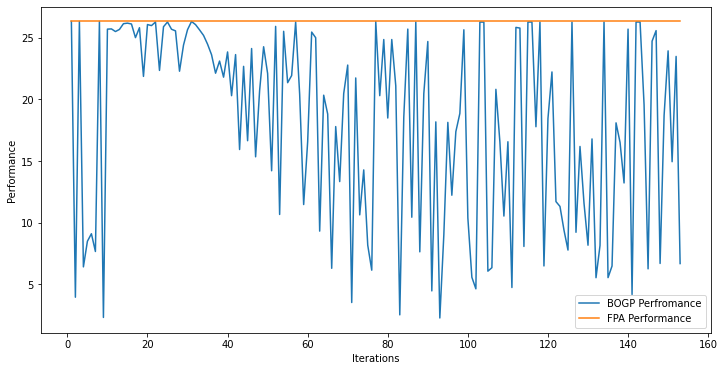

x_next is [-3.91649362e+00 -3.98568866e+00 -2.15007680e+01 -3.38024904e+00
 -5.31045618e+00 -4.91639491e+00 -2.96394570e+01 -7.77356313e-01
 -2.72926467e+01 -4.07532126e+00 -2.57562676e+00 -3.14833454e+00
 -4.42099512e-01 -1.43842626e+01 -1.48964424e+01 -3.51278458e+00
 -3.10662081e+00 -1.28567546e+00 -2.21326440e+00 -1.48321236e-02]
f()=19.259867, actual=19.343
152


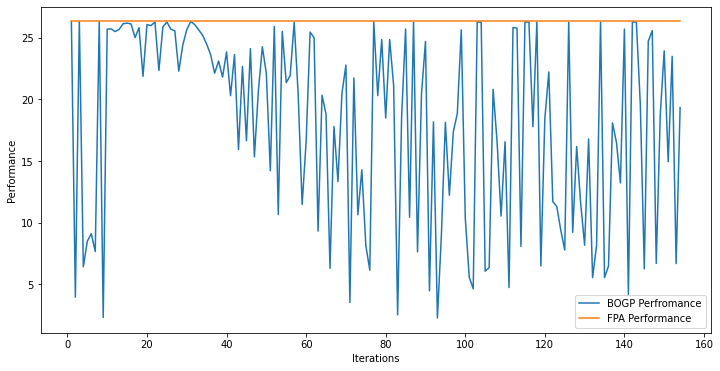

x_next is [ -1.1963502  -10.04254645  -9.51260709  -1.40439883 -25.9787271
  -8.45229343 -18.92410774  -3.19210106 -15.2603901   -4.8595103
 -15.98500592 -20.03834906  -3.80613662  -6.00114445  -5.42274178
 -19.48416664 -12.7761565   -7.91960959 -25.08159275 -26.06430877]
f()=18.106813, actual=10.091
153


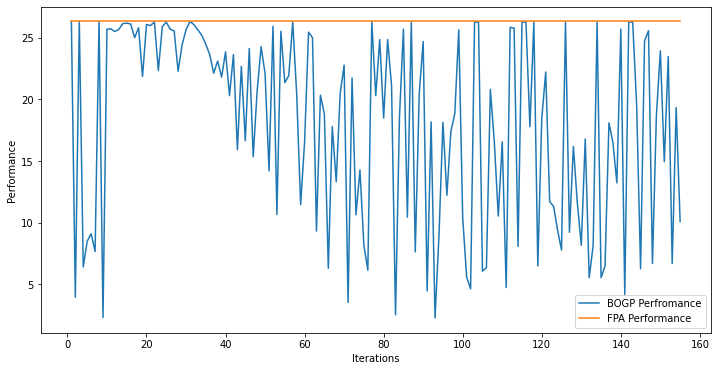

x_next is [ -2.18800479 -15.88801496 -30.6631286   -0.89181751  -5.132781
  -0.95944869  -2.86069286  -0.94443034 -29.76623381  -3.47967365
 -16.34590489 -30.40156772 -22.3206005  -25.20607793 -28.12622111
  -0.69128641  -6.05365652  -2.98635461  -1.07218856  -1.1208854 ]
f()=20.358282, actual=20.014
154


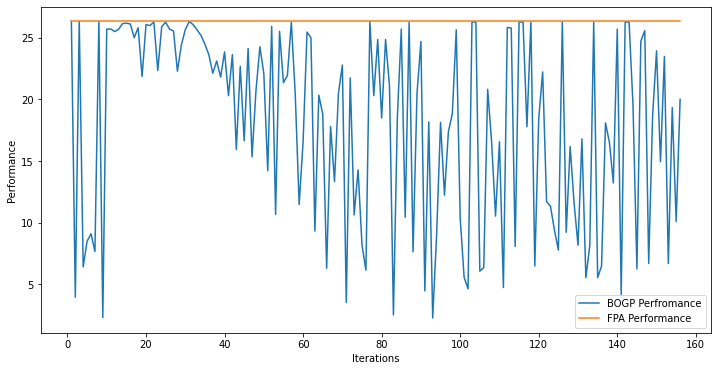

x_next is [ -1.27075212 -27.05359579 -12.62371999  -0.87274877  -5.03407635
  -3.27978072  -1.98855193  -1.11975878  -4.01711436  -0.69017936
 -18.90329607  -3.44923155 -26.95300301  -4.07217945 -10.40124208
  -3.95499802  -2.41649225  -9.93840576  -1.51220924  -1.30550764]
f()=20.030766, actual=20.099
155


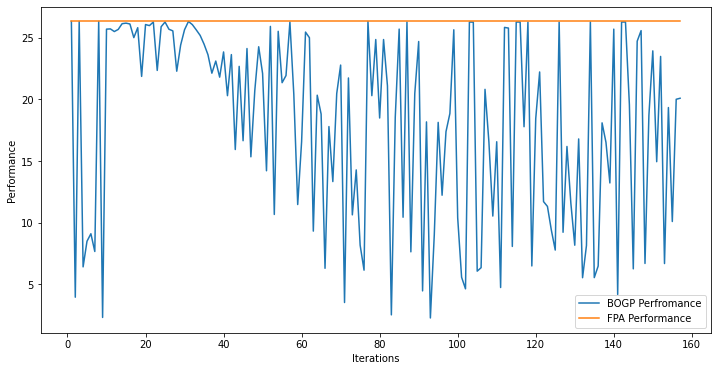

x_next is [ -2.12734073  -6.41581497  -6.28619793  -7.68839128  -2.38495025
  -7.92946858  -2.36118452  -6.98299161 -13.91502184  -7.73270832
 -20.52116863  -1.21654365  -5.03717786  -4.26405887  -2.161964
  -0.37410878  -6.975263    -6.37162766  -5.38359756  -1.08967797]
f()=18.077633, actual=16.343
156


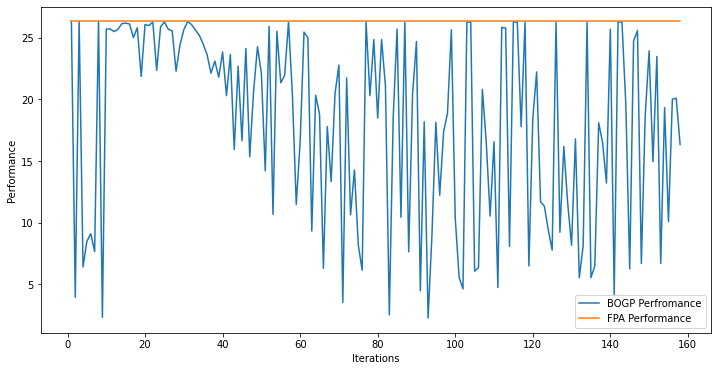

x_next is [ -2.03571527 -19.57110036 -23.93129288  -3.67461465  -4.36730679
  -3.13278318 -12.38981518 -13.52892003  -5.58517737  -9.75277589
  -5.98832923 -12.88626154 -25.94876716 -24.19706501 -10.58570132
 -15.4310334   -0.44209612  -8.03069254  -0.84058012 -17.14327341]
f()=13.017027, actual=12.989
157


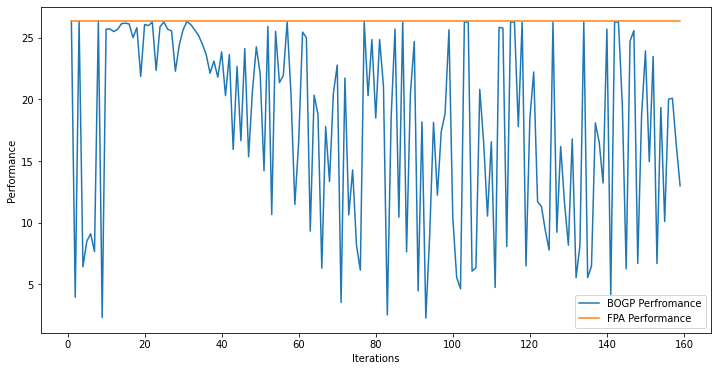

x_next is [-10.62147409 -10.05623878 -18.79634179  -6.13636026 -25.74419596
 -21.17655389 -28.75887265  -3.10577454 -29.64934381 -27.0679679
 -29.0332768   -5.72132829  -5.5809707  -29.84827991  -5.15239029
 -10.82833401  -5.54046126 -20.85763736  -8.02724699  -3.61685403]
f()=10.161123, actual=9.207
158


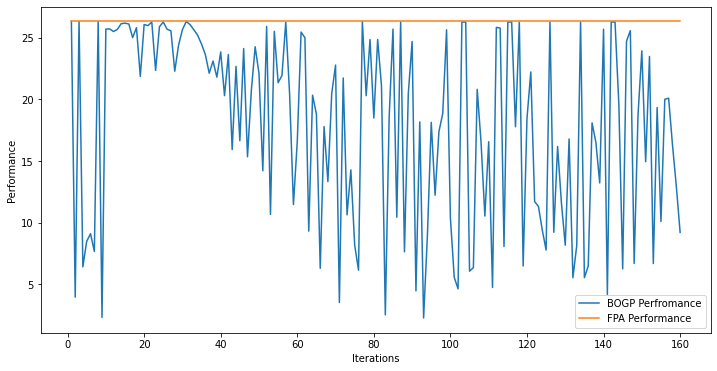

x_next is [-28.99082963 -21.86665018 -22.7664673   -3.54687661  -6.45578236
  -1.19989435 -23.66880098  -9.99360377 -25.44877087  -1.37031086
 -18.44437519 -24.47155989  -9.93169296 -30.46501242 -26.69101808
 -19.56707913  -1.96469215  -9.58461703  -9.50950748 -10.86898063]
f()=11.948200, actual=11.323
159


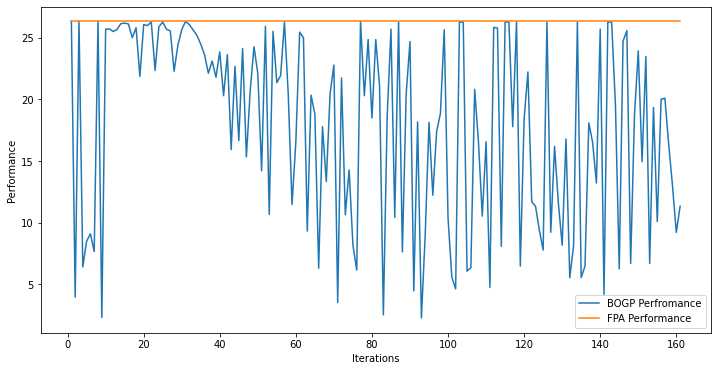

x_next is [ -6.86244771 -30.48874707 -19.0406036  -21.50467191 -18.46157203
 -26.42254851 -22.40360246  -9.35465816 -15.22248613  -0.37413961
 -14.7461705  -20.8313339  -13.76465553 -26.44698661 -13.88790513
  -1.07583382 -15.17228983 -22.03393116  -5.01054876 -20.89842259]
f()=9.123469, actual=9.990
160


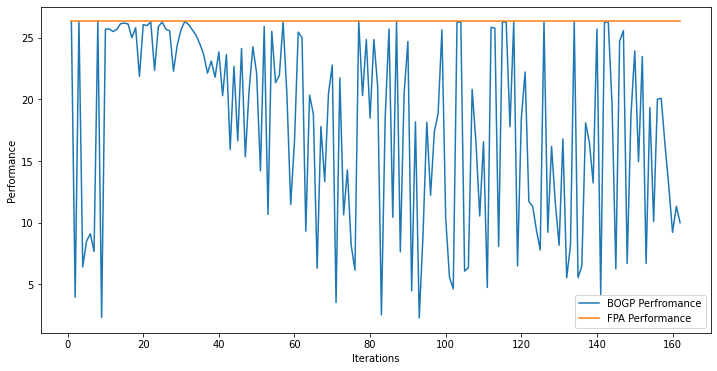

x_next is [ -8.38690351 -20.18253031  -1.46905191  -2.42503582  -3.31346088
  -1.5514278  -24.78387458 -12.42143361 -21.16966517  -1.72456117
  -3.37637318 -29.89277538  -2.14233434  -2.23243618 -28.92943377
  -1.36634633  -3.77937971 -24.74768365  -1.78471663  -8.1331713 ]
f()=17.694331, actual=17.135
161


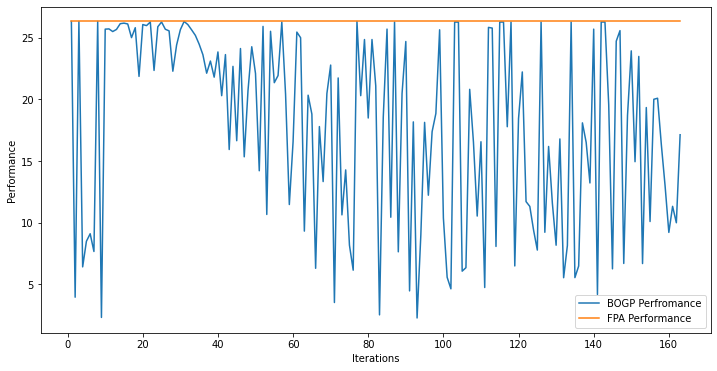

x_next is [ -0.70964666 -30.86941766 -28.77153603  -0.18495693  -1.18282035
  -0.40230729  -0.33618299  -3.15621725 -28.37601959  -0.30190652
  -0.69213685  -5.85002829  -2.659916    -0.58266007 -26.67811278
  -2.15044367  -0.52781595  -3.79637726  -1.60913682  -1.96957502]
f()=23.089673, actual=22.567
162


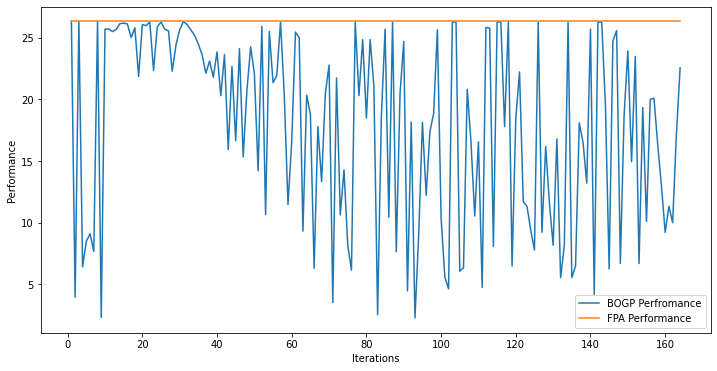

x_next is [-1.89347571e-01 -2.94022802e-01 -1.94667600e-01 -1.25334653e-02
 -3.83596503e-02 -7.65471670e-03 -1.44900095e-02 -1.68924507e-01
 -1.79379816e+01 -2.15112144e-02 -3.35109500e-02 -5.50266619e-02
 -1.50090056e-01 -2.35862015e-02 -9.20933500e-03 -6.78659312e-03
 -9.32804061e-02 -8.16209334e-02 -3.11082398e-02 -3.93613765e-02]
f()=26.187446, actual=26.128
163


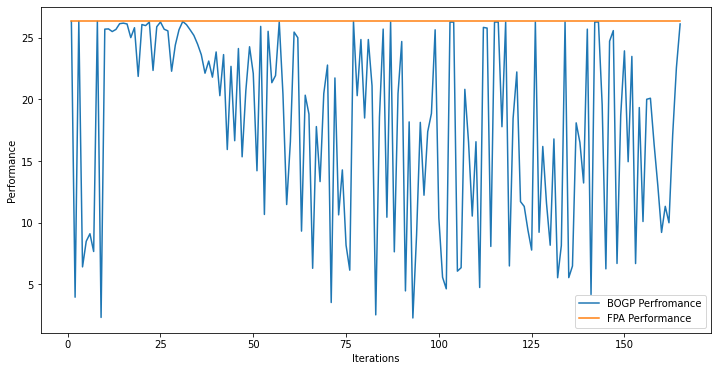

x_next is [ -6.75592357  -5.05093198 -26.70906833 -11.65215735  -0.53922838
 -10.22857763 -12.36710025 -29.25704769 -25.74840792 -12.49167356
 -29.56903617 -14.76009936 -18.06626381  -7.71579082  -4.6164123
  -1.07287857 -23.23333879 -22.95605238 -16.43640784  -7.5658593 ]
f()=17.963081, actual=8.835
164


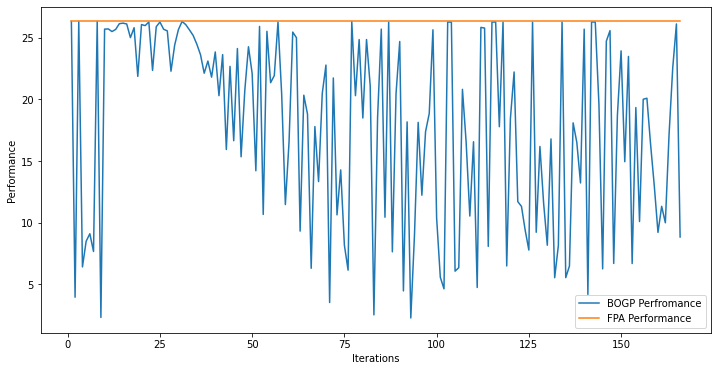

x_next is [ -5.15436094 -23.15035231 -21.01436849  -0.61022524  -5.34686546
  -0.73116029  -1.45971056 -14.42363719  -4.25723456  -1.77103968
  -3.9895871   -2.43058314 -22.08202074 -25.06984391 -18.64337785
  -2.88408821  -3.32813789  -1.01702717  -0.99448201  -3.43391509]
f()=18.827320, actual=19.064
165


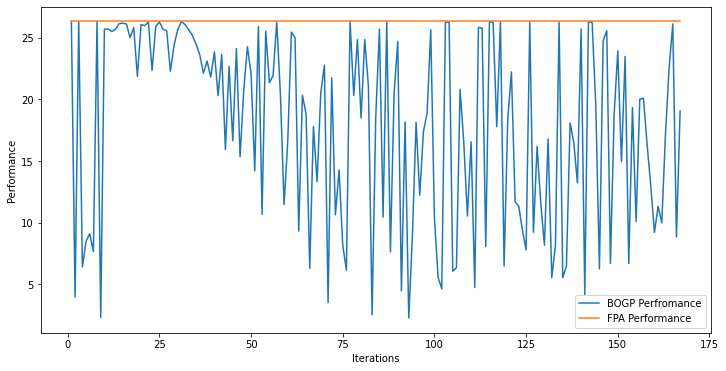

x_next is [-2.05180919e-02 -2.99870085e+01 -2.75255944e+01 -9.52966973e-03
 -6.43514585e-03 -1.06224550e-02 -4.18127928e-03 -7.50279981e-03
 -2.36094224e-01 -1.28416680e-03 -4.24531015e+00 -1.37279644e+01
 -1.65858329e-02 -1.29960929e-01 -2.16664013e+01 -1.48647711e-02
 -1.52300883e-02 -2.21567274e-02 -5.86664332e-03 -1.21174334e-03]
f()=27.139676, actual=25.555
166


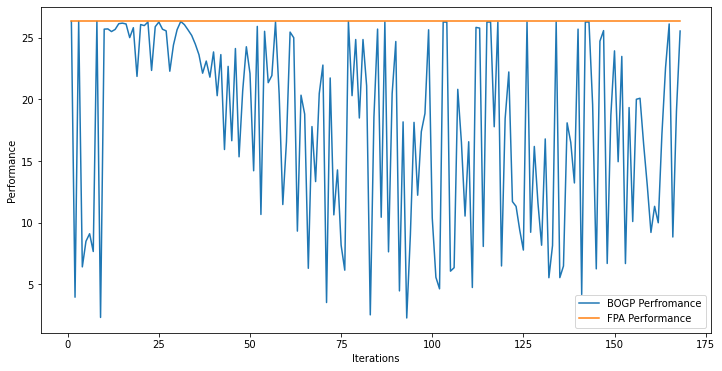

x_next is [-7.78953824e-05 -1.54794087e-04 -3.09998481e+01 -1.39233530e-04
 -9.84873921e-06 -3.98539993e-04 -2.36354492e-04 -2.22210093e-04
 -1.71019737e-04 -2.62555794e-04 -1.52684890e-04 -1.64249611e-04
 -2.39258877e-06 -4.25039769e-04 -1.37820451e-04 -7.68448857e-04
 -1.14850841e-04 -1.55418776e-06 -8.85821996e-05 -1.30903652e-04]
f()=17.960612, actual=26.286
167


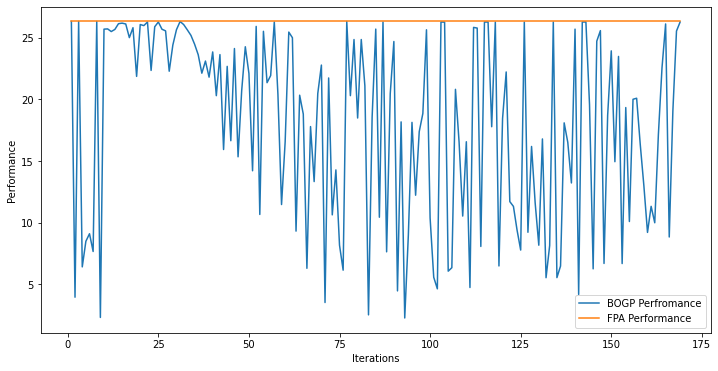

x_next is [ -1.09808616 -20.51460031 -30.92235527  -4.27911374  -7.23624392
  -2.65615463 -16.60654553 -17.70421738 -13.20069162  -1.89938817
 -16.47665147 -14.55738248 -12.34557765 -10.61254418  -6.01364618
  -4.86687687  -6.90394141  -4.05861253  -2.96280577  -7.93259518]
f()=15.544085, actual=15.643
168


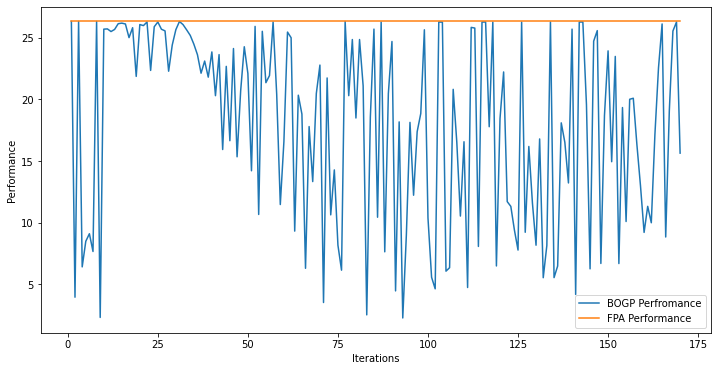

x_next is [ -0.37476604 -27.50807798  -2.60639637  -0.09930075  -2.14825825
  -0.10261579  -1.95282807  -2.98257927 -30.82600513  -0.19895455
 -29.31087818  -4.46052323  -5.25835094  -4.32478998  -0.222535
  -4.08236651  -0.37214229  -5.79960021  -0.07191893  -0.53554817]
f()=23.066612, actual=22.509
169


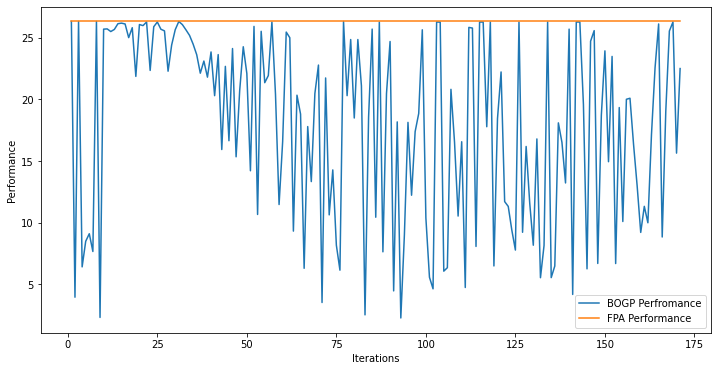

x_next is [-15.39901056 -16.34866826 -26.5976909   -0.18475021 -22.35457152
  -9.31019485 -24.83584955  -1.26137227  -1.06824945  -8.95617794
  -1.00379211 -18.01465555 -11.39391678 -23.1856357  -17.21779804
  -6.12111059 -10.9038928  -12.69024831  -2.10611398 -11.69191594]
f()=13.218736, actual=12.285
170


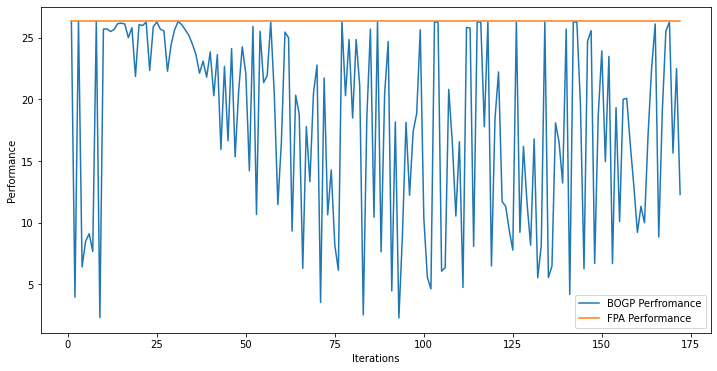

x_next is [-11.09832153  -9.07929876 -28.14186343 -15.16171578  -3.68819732
  -1.98243313  -0.88117465  -4.5597638   -5.57244613  -6.18805348
 -21.79923669 -10.77019964  -1.61960285 -10.29644716  -6.96887266
 -19.29420312 -29.26905377  -6.69011889  -1.38465637 -10.18766136]
f()=11.971737, actual=10.787
171


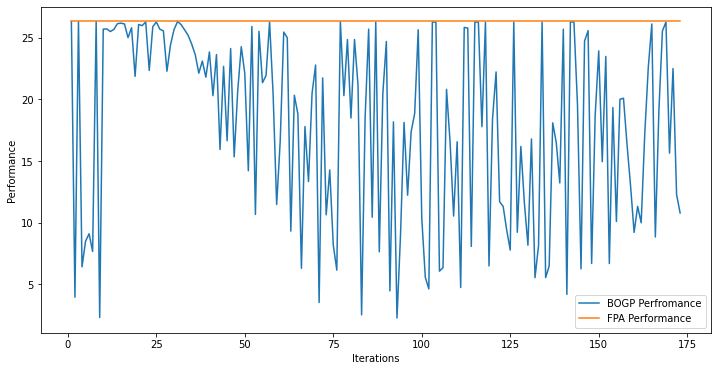

x_next is [-22.62711445 -16.46556805 -10.5864244  -14.37475801 -29.38364559
 -25.8657265  -10.97235487 -15.76245898 -26.34791272 -16.46192411
 -14.3403177  -23.99098939 -20.60104761  -9.45346039  -7.02290355
  -2.20513022  -7.801726   -22.36723614 -23.70163363 -20.32223214]
f()=17.947486, actual=4.842
172


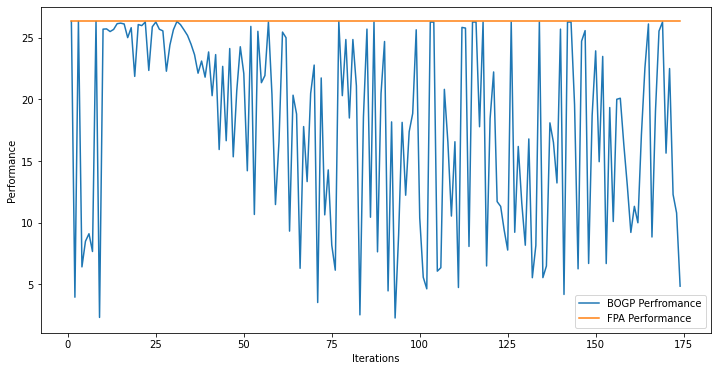

x_next is [ -2.01472363 -17.79569231 -30.6348136   -3.02660814 -10.36097757
  -2.67486442  -0.26602367 -18.63137497 -18.95037383  -1.16532399
 -20.14421804 -24.4524563  -27.36235538  -6.89126136 -24.77442193
  -2.29135299 -22.15301101 -14.02220795  -3.77985098 -13.14504272]
f()=15.115805, actual=15.314
173


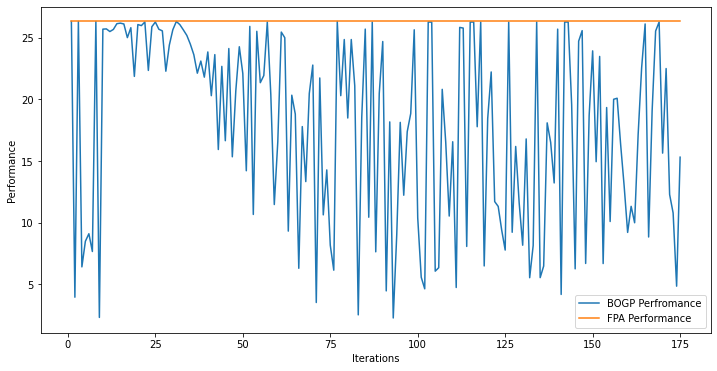

x_next is [-13.25898136 -18.9962724   -0.20999655 -23.55334383 -30.60163747
 -29.09752699 -10.16012173  -9.57785122 -17.33256757 -16.30214576
  -3.78481609 -24.54346609 -24.57442211  -3.7201823  -12.14524443
  -1.51714008 -13.53302313 -10.21581781  -5.17290765  -4.79826682]
f()=17.857342, actual=7.869
174


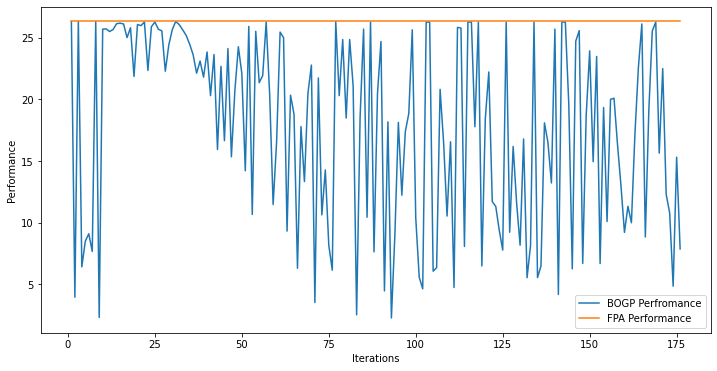

x_next is [-18.47218864  -6.73908436 -15.26978332 -14.83386767 -17.24982323
 -22.55400959  -9.74710429 -13.35621628 -13.15579911 -12.95034732
 -17.16955044 -18.81512395 -17.29236792 -27.0986195  -13.61749874
 -17.00116985 -15.87307478 -17.75556689  -8.84716922 -14.75457147]
f()=17.800455, actual=3.919
175


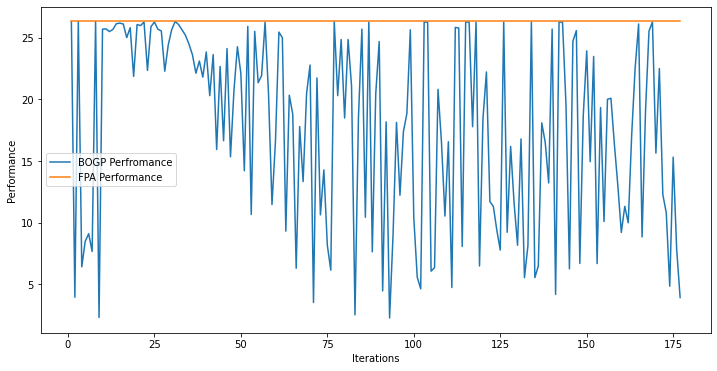

x_next is [ -8.90646685 -18.95185066  -7.39341561  -9.62006676 -29.75097114
  -9.91577843 -11.79555676  -7.03344477 -21.60575074  -7.73106604
  -3.93566002 -11.54215146 -26.05254045 -15.46050428 -30.36901427
 -21.4592696  -22.24252592 -10.24777983 -12.51522018 -16.0349739 ]
f()=17.721705, actual=5.901
176


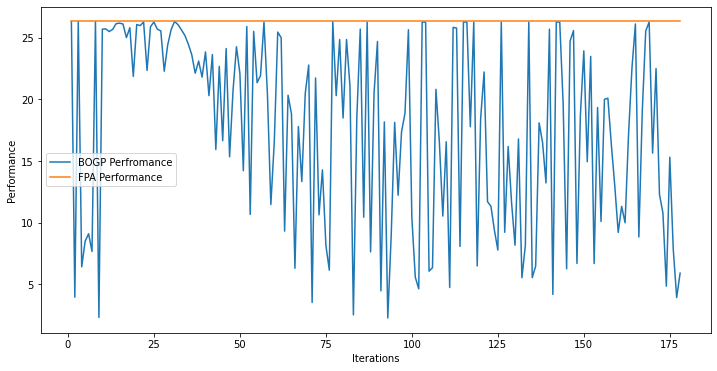

x_next is [ -0.57976239 -29.59638658 -16.4733564   -1.47179044  -3.2995992
  -8.32074656 -19.06260837 -19.49805015  -2.75877335  -4.5231766
 -13.76035245 -17.79975321 -28.27301469  -0.1560429   -9.21390854
  -0.76140453  -4.40095855 -11.29310485  -1.3090943   -0.1557802 ]
f()=18.151786, actual=18.293
177


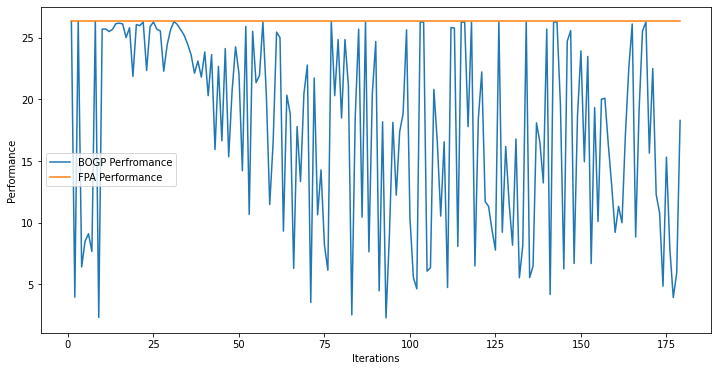

x_next is [ -1.39400861 -13.3926015  -13.67001951  -0.44893012 -14.81669599
 -28.80002008 -21.47181594  -1.59720569 -23.90065965  -3.38341066
 -21.52845989  -0.15974507  -4.65028956  -9.20778802 -24.07334429
  -0.99754027  -1.94326392 -27.33167577  -3.07206231  -2.2030298 ]
f()=17.265382, actual=18.332
178


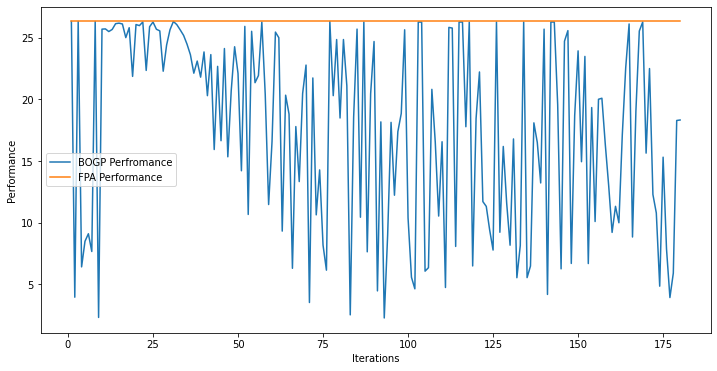

x_next is [ -0.7248441   -0.09832346 -16.56918506  -0.27508227  -0.92425571
  -0.72229482  -1.17179218  -0.6571673  -28.67137986  -0.14190556
  -4.12983679  -0.30166199  -0.17815538  -3.32845068  -1.83068974
  -1.004347    -0.47218847  -0.7308713   -0.08500584  -0.0551061 ]
f()=24.820435, actual=24.908
179


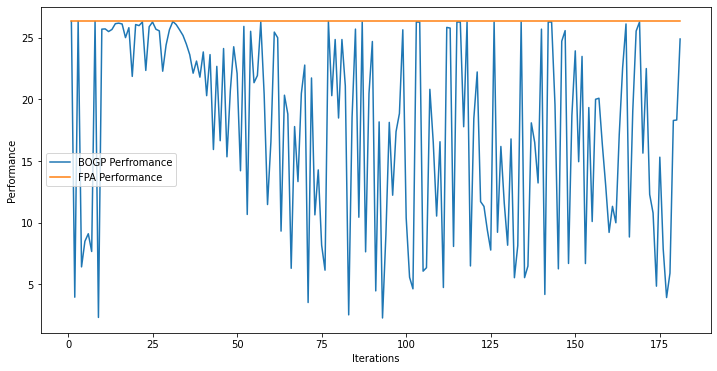

x_next is [-20.4620161  -26.30011486  -2.88698506 -19.56813977 -28.41420146
  -6.93046555 -14.18523057 -22.43614025 -15.24891422 -26.59678341
 -16.34683877  -5.44468551 -15.08552878  -1.20482036 -18.21309198
 -10.21388794 -12.33495106 -22.19918745  -9.72313595  -0.59682206]
f()=17.702686, actual=6.028
180


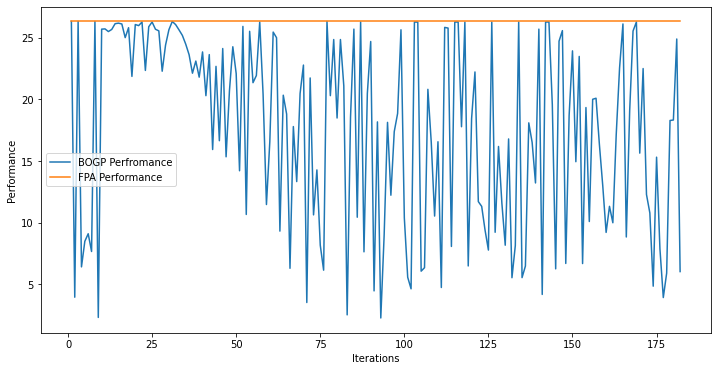

x_next is [-1.05230740e+01 -2.30298970e+01 -1.69275022e+01 -1.39932040e+00
 -1.49241516e+01 -5.67538855e+00 -5.18767065e+00 -5.27448408e-02
 -1.40041458e+01 -5.41312077e-01 -1.75433652e+01 -4.10586417e-01
 -6.32261676e+00 -1.86952925e+01 -6.60214108e+00 -6.71825856e-02
 -1.98164537e+00 -8.39117186e-03 -2.95980261e+00 -2.21447452e-01]
f()=19.123415, actual=19.900
181


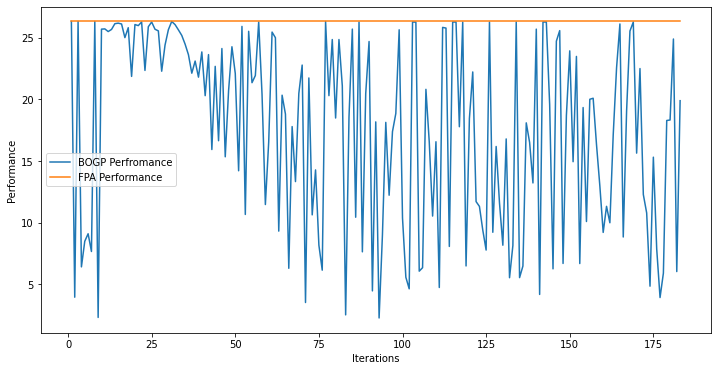

x_next is [-13.47048741 -10.56407364  -9.51956606  -6.12553276  -4.5604539
  -1.51961474 -19.66260567  -8.66537405 -26.84543599  -3.59447241
 -27.29162255 -28.04141823 -21.99768006 -20.51897108 -28.48639546
  -0.77567285  -1.1727341   -4.57872844  -2.58665823  -6.74875318]
f()=15.476925, actual=15.654
182


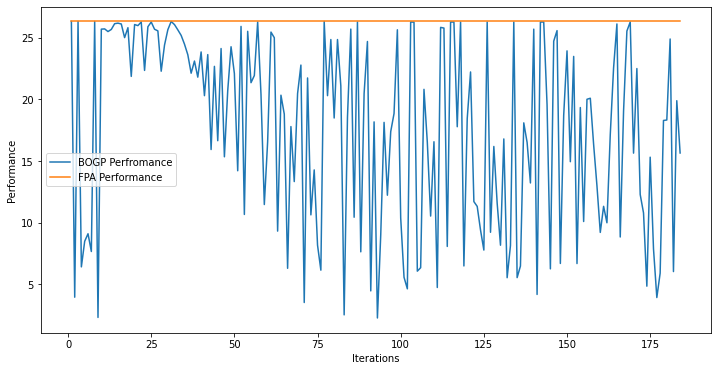

x_next is [-1.79334054e-01 -1.75232839e-01 -3.05855800e+01 -1.27339903e-01
 -2.69372737e-02 -2.02531992e-01 -4.90020592e-02 -1.18197203e-01
 -3.91840541e-02 -2.36065737e-01 -3.06940034e+01 -2.62808374e-02
 -1.00771527e-01 -2.11587450e-02 -9.32919951e-01 -1.47939203e-01
 -2.12386815e-01 -9.95290401e-02 -4.21199807e-02 -1.44910152e-01]
f()=25.949934, actual=25.921
183


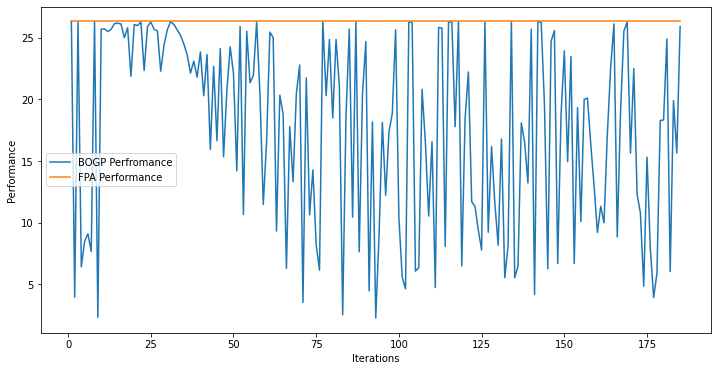

x_next is [-2.73999905e-02 -2.68583902e-01 -1.40780953e-01 -1.33235989e-03
 -7.44869668e-04 -7.74420419e-03 -6.97269214e-02 -2.91307674e-02
 -3.05448136e+01 -3.82592189e-02 -3.06867888e+01 -5.11666593e-02
 -7.36222475e-02 -5.36924016e-02 -3.09591002e+01 -3.27685059e-02
 -5.37496877e-02 -6.39325488e-02 -8.92937277e-03 -3.57676814e-03]
f()=25.817412, actual=26.014
184


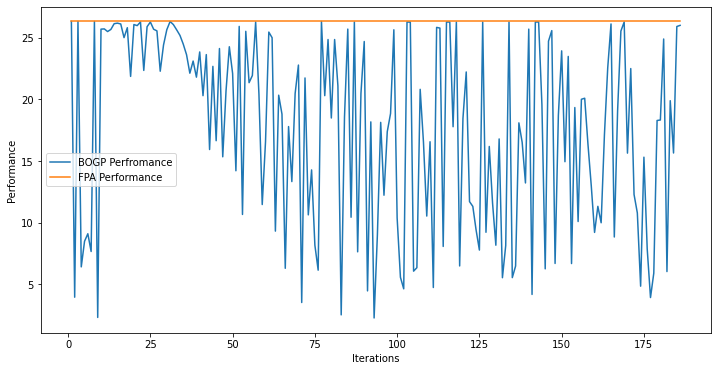

x_next is [ -3.62079307 -27.0010273  -29.07971249  -5.79376334 -12.06881922
  -3.25391665  -3.33173347  -2.36963635  -9.08048583  -1.913377
  -5.03616366  -4.78756447  -4.01156287  -4.37344605  -1.45977586
  -0.85771112  -0.76507628 -30.20264648  -0.07308644  -3.62954374]
f()=19.457950, actual=18.930
185


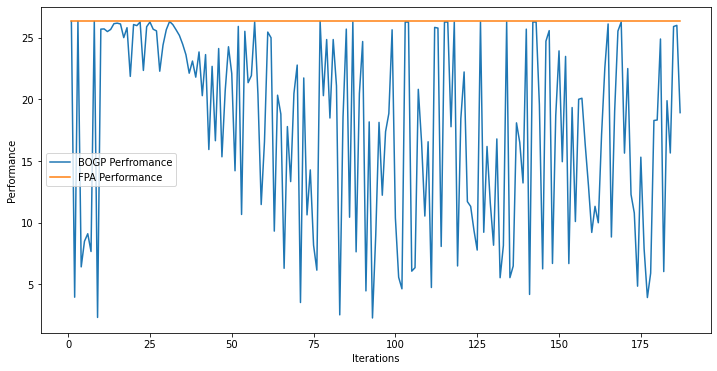

x_next is [-21.24078012  -2.22705347 -11.48563242  -6.40166727 -19.38163415
 -21.94729548  -7.12499317 -26.63478521  -1.32331808 -19.7016617
 -21.57982634 -30.52949006 -17.343298   -11.15831687  -2.4096843
 -18.80923695 -21.115135   -22.01371753  -0.05999839 -11.43203307]
f()=6.770997, actual=7.629
186


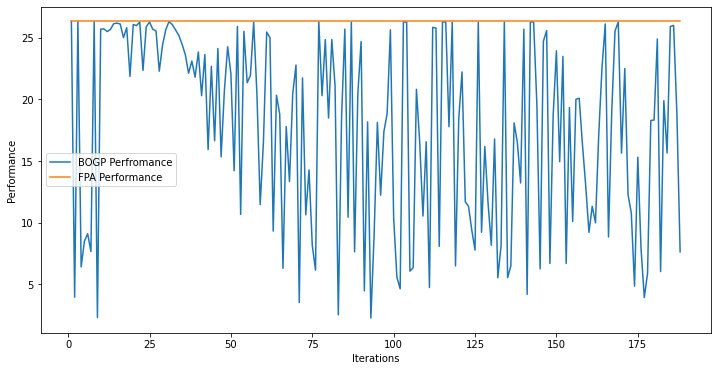

x_next is [ -0.17408534 -23.54427053 -27.4451322   -1.41603154  -1.75123718
  -0.48304642  -0.10897889  -1.45574574  -5.99080215  -2.18897252
 -22.37504133  -6.90361819  -1.92751049  -1.17910501 -27.07887824
  -1.34817161  -3.14708806  -6.14215362  -1.9627556   -0.82959848]
f()=22.054555, actual=21.989
187


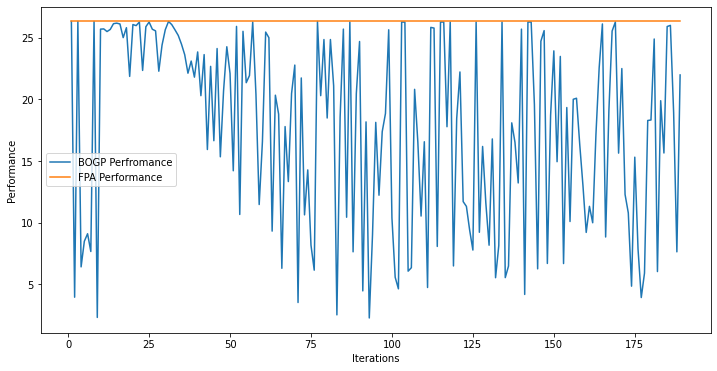

x_next is [ -0.29704293 -29.90727442 -20.47993205  -0.78884416  -3.75546439
  -0.34939799  -1.12036884  -0.32435569  -9.74968032  -0.15451328
  -1.21423664  -1.22000835  -3.03471396 -29.03934421  -5.08596121
  -1.15903377  -5.49384938  -2.80855008  -0.10038191  -0.49163432]
f()=23.067786, actual=22.994
188


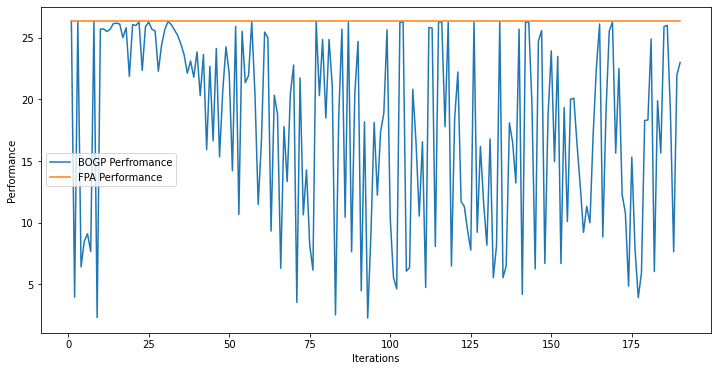

x_next is [-3.55505926e+00 -1.31529626e+01 -1.10989554e+01 -4.45179824e+00
 -3.87268840e+00 -5.43688802e-01 -1.96820072e+01 -2.02604543e+01
 -3.31921591e+00 -2.54546219e+00 -3.03278615e+01 -1.88053222e-01
 -6.90268538e-01 -1.72168985e+01 -2.87488356e+01 -2.98939600e-02
 -2.61711884e+01 -2.35759167e+01 -1.45177769e+01 -3.39125835e+00]
f()=14.771716, actual=15.595
189


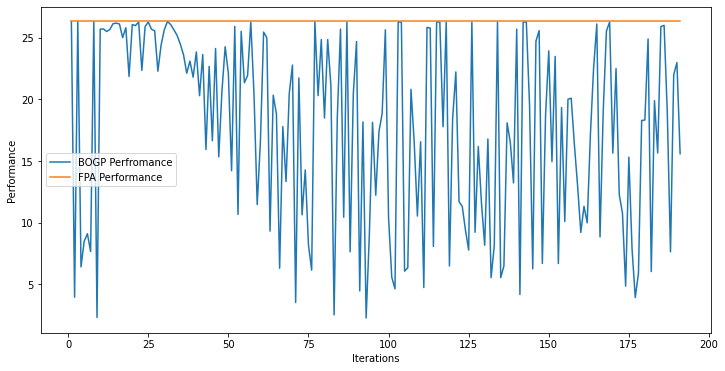

x_next is [-0.01268871 -0.05932914 -0.03652639 -0.00536115 -0.02172962 -0.01147482
 -0.00640698 -0.06639763 -0.00364777 -0.00336225 -0.10008476 -0.13839066
 -0.00104194 -0.16283819 -0.10051201 -0.00795275 -0.01347189 -0.00344861
 -0.01967853 -0.0053968 ]
f()=26.271098, actual=26.277
190


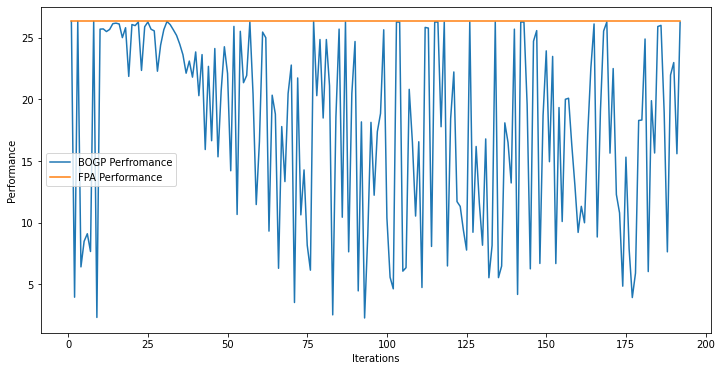

In [ ]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective_FPA(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model)

  np.save("/content/drive/MyDrive/trainingx_BOGP_PI_P=0.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_PI_P=0.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_PI_P=0.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective_FPA(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)

  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


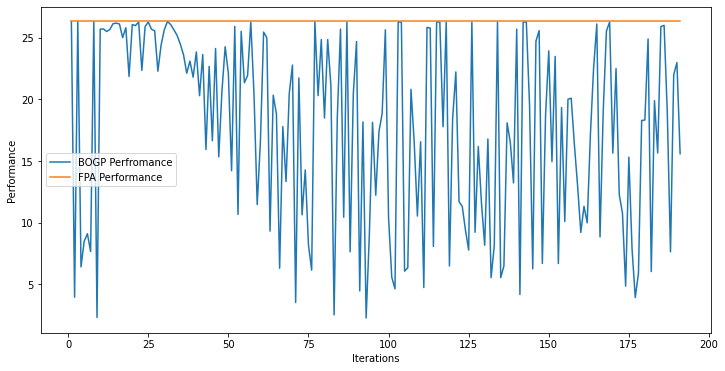

P_max = 0.000, Optimal_SE = 26.331
P_max = 0.000, Optimal_SE_FPA = 26.331


In [16]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 
ix = 0
ix = argmax(y)
print('P_max = %.3f, Optimal_SE = %.3f' % (P_max, y[ix]))

ix_FPA=0
ix_FPA=argmax(y_FPA)
print('P_max = %.3f, Optimal_SE_FPA = %.3f' % (P_max, y_FPA[ix_FPA]))

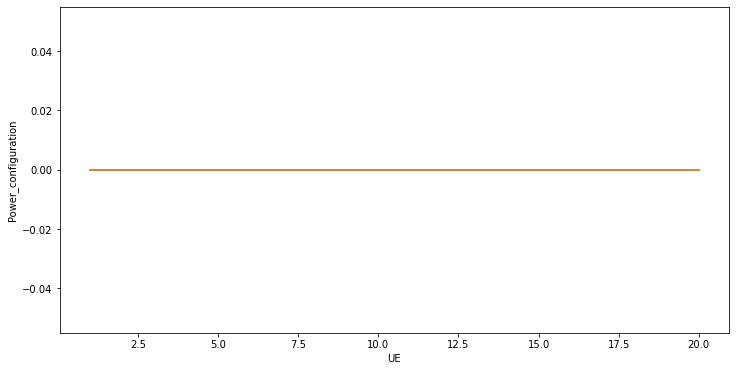

Power_configuration_BOGP is [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [17]:
X_FPA = P_max * np.ones([1,var], dtype = "float").reshape((int)(20), 1)
pyplot.figure(figsize = (12, 6)) 
pyplot.xlabel("UE")
pyplot.ylabel("Power_configuration")
pyplot.plot(np.arange(1,21),X[ix][:])
pyplot.plot(np.arange(1,21),X_FPA[:])
pyplot.show()
print("Power_configuration_BOGP is", X[ix])

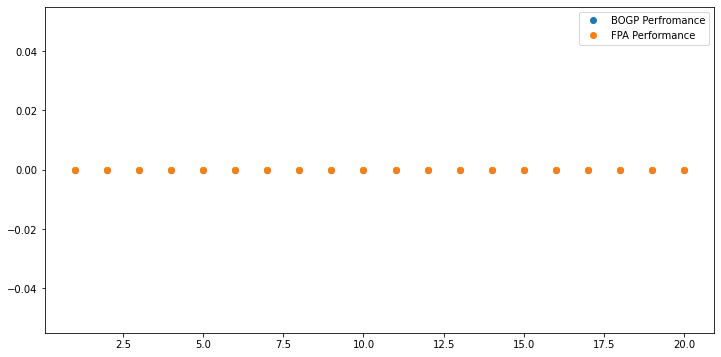

Power_configuration_BOGP is [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [18]:
import matplotlib.pyplot as plt
X_FPA=np.linspace(P_max,P_max,20)
plt.figure(figsize = (12, 6)) 
plt.plot(np.arange(1,21),X[ix][:], 'o')
plt.plot(np.arange(1,21),X_FPA[:], 'o')
plt.legend(["BOGP Perfromance","FPA Performance"])
plt.show()
print("Power_configuration_BOGP is", X[ix])